In [2]:
import os

# Change to your project directory (update the path as needed)
os.chdir(r"G:\Snow-Analyze-in-Iran")

# Verify the change
print(os.getcwd())

G:\Snow-Analyze-in-Iran


data\raw\snow_iran-mon-1950-2023.nc --> exists: True
data\raw\snow_iran-mon-2024-2025.nc --> exists: True
data\raw\Iran\iran layer\IRAN.shp --> exists: True
data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc --> exists: True
data\raw\CanESM5-CanOE _Snowfall_Historical.nc --> exists: True
data\raw\GFDL-ESM4-Snow_Depth_Historical.nc --> exists: True
data\raw\GFDL-ESM4-Snowfall_Historical.nc --> exists: True

ERA5 file 1:
<xarray.Dataset> Size: 3GB
Dimensions:    (time: 888, latitude: 201, longitude: 231)
Coordinates:
  * time       (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2023-12-01
  * latitude   (latitude) float32 804B 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude  (longitude) float32 924B 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
Data variables:
    asn        (time, latitude, longitude) float64 330MB ...
    snowc      (time, latitude, longitude) float64 330MB ...
    rsn        (time, latitude, longitude) float64 330MB ...
    sde        (time, latitude, longitude) floa

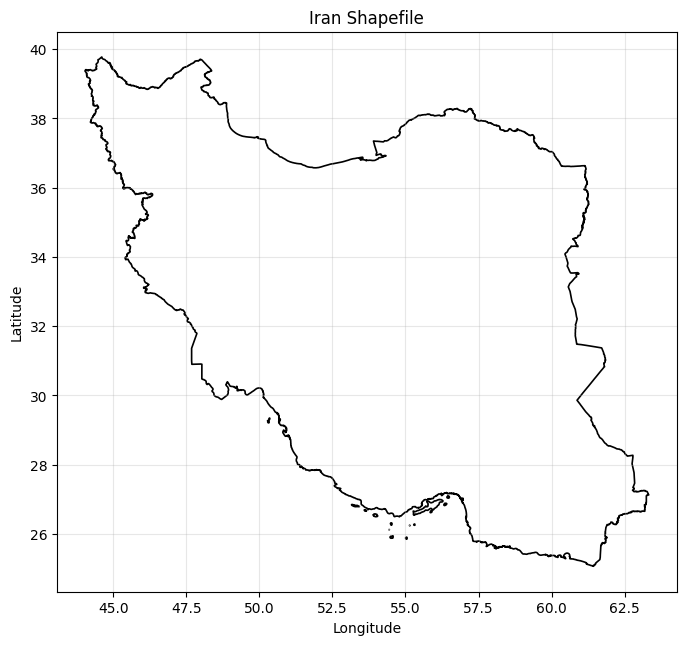

Saved: outputs\figures\iran_shapefile.png


In [3]:
# ============================================================
# STEP 1 — Load ERA5 snow data and Iran shapefile
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt

# -----------------------------
# 1. Project paths
# -----------------------------
BASE_DIR = Path(".")  # اگر اسکریپت را در پوشه اصلی پروژه اجرا می‌کنید
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# 2. Input files
# -----------------------------
era5_file_1 = RAW_DIR / "snow_iran-mon-1950-2023.nc"

# نام واقعی فایل دوم 2024-2025 را اینجا جایگزین کن
era5_file_2 = RAW_DIR / "snow_iran-mon-2024-2025.nc"

iran_shp = RAW_DIR / "Iran" / "iran layer" / "IRAN.shp"

# Climate model files
model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    }
}

# -----------------------------
# 3. Check files
# -----------------------------
all_files = [era5_file_1, era5_file_2, iran_shp]
for model, files in model_files.items():
    all_files.extend(files.values())

for f in all_files:
    print(f"{f} --> exists: {f.exists()}")

# -----------------------------
# 4. Load ERA5 first file
# -----------------------------
ds_era5_1 = xr.open_dataset(era5_file_1)

print("\nERA5 file 1:")
print(ds_era5_1)

print("\nVariables:")
for v in ds_era5_1.data_vars:
    print(
        v,
        "| long_name:", ds_era5_1[v].attrs.get("long_name", ""),
        "| units:", ds_era5_1[v].attrs.get("units", "")
    )

print("\nTime range:")
print(str(ds_era5_1.time.min().values), "to", str(ds_era5_1.time.max().values))

# -----------------------------
# 5. Load Iran shapefile
# -----------------------------
iran = gpd.read_file(iran_shp)

print("\nIran shapefile:")
print(iran.head())
print("CRS:", iran.crs)
print("Bounds:", iran.total_bounds)

# Ensure WGS84
if iran.crs is None:
    iran = iran.set_crs("EPSG:4326")
else:
    iran = iran.to_crs("EPSG:4326")

# -----------------------------
# 6. Plot Iran shapefile
# -----------------------------
fig, ax = plt.subplots(figsize=(8, 8))
iran.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=1.2)
ax.set_title("Iran Shapefile")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True, alpha=0.3)

fig_path = FIG_DIR / "iran_shapefile.png"
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved:", fig_path)

In [5]:
import xarray as xr

ds2 = xr.open_dataset(era5_file_2)

print(ds2)

print("\nCoordinates:")
print(list(ds2.coords))

print("\nDimensions:")
print(list(ds2.dims))

print("\nData variables:")
print(list(ds2.data_vars))

<xarray.Dataset> Size: 36MB
Dimensions:     (valid_time: 24, latitude: 201, longitude: 231)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 192B 2024-01-01 ... 2025-12-01
  * latitude    (latitude) float64 2kB 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude   (longitude) float64 2kB 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
    number      int64 8B ...
    expver      (valid_time) <U4 384B ...
Data variables:
    asn         (valid_time, latitude, longitude) float32 4MB ...
    snowc       (valid_time, latitude, longitude) float32 4MB ...
    rsn         (valid_time, latitude, longitude) float32 4MB ...
    sde         (valid_time, latitude, longitude) float32 4MB ...
    sd          (valid_time, latitude, longitude) float32 4MB ...
    sf          (valid_time, latitude, longitude) float32 4MB ...
    smlt        (valid_time, latitude, longitude) float32 4MB ...
    tsn         (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    GRIB_centre:             ecmf
  

In [6]:
# ============================================================
# STEP 2 — Merge ERA5 1950–2023 and 2024–2025 files
# Final corrected version for your files
# ============================================================

import xarray as xr
import numpy as np
import pandas as pd

# -----------------------------
# 1. Load files
# -----------------------------
ds1 = xr.open_dataset(era5_file_1)
ds2 = xr.open_dataset(era5_file_2)

# -----------------------------
# 2. Rename valid_time to time in file 2
# -----------------------------
if "valid_time" in ds2.coords or "valid_time" in ds2.dims:
    ds2 = ds2.rename({"valid_time": "time"})

# -----------------------------
# 3. Remove unnecessary coordinates from file 2
# -----------------------------
drop_vars = [v for v in ["number", "expver"] if v in ds2.coords or v in ds2.variables]

if len(drop_vars) > 0:
    ds2 = ds2.drop_vars(drop_vars)

# -----------------------------
# 4. Make coordinate dtypes consistent
# -----------------------------
ds2 = ds2.assign_coords(
    latitude=ds2.latitude.astype(ds1.latitude.dtype),
    longitude=ds2.longitude.astype(ds1.longitude.dtype)
)

# -----------------------------
# 5. Keep common variables
# -----------------------------
common_vars = sorted(list(set(ds1.data_vars) & set(ds2.data_vars)))

print("Common variables:")
print(common_vars)

ds1 = ds1[common_vars]
ds2 = ds2[common_vars]

# -----------------------------
# 6. Check grids
# -----------------------------
same_lat = np.allclose(ds1.latitude.values, ds2.latitude.values)
same_lon = np.allclose(ds1.longitude.values, ds2.longitude.values)

print("Same latitude grid:", same_lat)
print("Same longitude grid:", same_lon)

if not same_lat or not same_lon:
    print("Grids differ slightly. Interpolating file 2 to file 1 grid...")
    ds2 = ds2.interp(
        latitude=ds1.latitude,
        longitude=ds1.longitude,
        method="linear"
    )

# -----------------------------
# 7. Combine along time
# -----------------------------
ds_era5 = xr.concat([ds1, ds2], dim="time")

# Sort by time
ds_era5 = ds_era5.sortby("time")

# Remove duplicate months if any
_, unique_index = np.unique(ds_era5.time.values, return_index=True)
ds_era5 = ds_era5.isel(time=np.sort(unique_index))

# -----------------------------
# 8. Final checks
# -----------------------------
print("\nMerged ERA5 dataset:")
print(ds_era5)

print("\nFinal time range:")
print(str(ds_era5.time.min().values), "to", str(ds_era5.time.max().values))

print("\nNumber of months:")
print(ds_era5.sizes["time"])

print("\nVariables:")
for v in ds_era5.data_vars:
    print(
        v,
        "| dtype:", ds_era5[v].dtype,
        "| units:", ds_era5[v].attrs.get("units", "")
    )

# -----------------------------
# 9. Save final file
# -----------------------------
era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"

encoding = {
    var: {
        "zlib": True,
        "complevel": 4,
        "dtype": "float32"
    }
    for var in ds_era5.data_vars
}

ds_era5.to_netcdf(era5_final_file, encoding=encoding)

print("\nSaved final ERA5 file:")
print(era5_final_file)

Common variables:
['asn', 'rsn', 'sd', 'sde', 'sf', 'smlt', 'snowc', 'tsn']
Same latitude grid: True
Same longitude grid: True

Merged ERA5 dataset:
<xarray.Dataset> Size: 3GB
Dimensions:    (time: 912, latitude: 201, longitude: 231)
Coordinates:
  * time       (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2025-12-01
  * latitude   (latitude) float32 804B 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude  (longitude) float32 924B 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
Data variables:
    asn        (time, latitude, longitude) float64 339MB 0.7867 0.7994 ... nan
    rsn        (time, latitude, longitude) float64 339MB 190.7 204.4 ... nan nan
    sd         (time, latitude, longitude) float64 339MB 0.07539 0.1193 ... nan
    sde        (time, latitude, longitude) float64 339MB 0.375 0.5625 ... nan
    sf         (time, latitude, longitude) float64 339MB 0.006616 ... nan
    smlt       (time, latitude, longitude) float64 339MB 0.001943 ... nan
    snowc      (time, latitude, long

In [7]:
# ============================================================
# Check final merged ERA5 file
# ============================================================

ds_check = xr.open_dataset(era5_final_file)

print(ds_check)

print("\nTime range:")
print(str(ds_check.time.min().values), "to", str(ds_check.time.max().values))

print("\nNumber of months:")
print(ds_check.sizes["time"])

print("\nMissing months check:")
time_index = pd.to_datetime(ds_check.time.values)
expected_time = pd.date_range("1950-01-01", "2025-12-01", freq="MS")

missing_months = expected_time.difference(time_index)
extra_months = time_index.difference(expected_time)

print("Missing months:", len(missing_months))
print(missing_months)

print("Extra months:", len(extra_months))
print(extra_months)

<xarray.Dataset> Size: 1GB
Dimensions:    (time: 912, latitude: 201, longitude: 231)
Coordinates:
  * time       (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2025-12-01
  * latitude   (latitude) float32 804B 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude  (longitude) float32 924B 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
Data variables:
    asn        (time, latitude, longitude) float32 169MB ...
    rsn        (time, latitude, longitude) float32 169MB ...
    sd         (time, latitude, longitude) float32 169MB ...
    sde        (time, latitude, longitude) float32 169MB ...
    sf         (time, latitude, longitude) float32 169MB ...
    smlt       (time, latitude, longitude) float32 169MB ...
    snowc      (time, latitude, longitude) float32 169MB ...
    tsn        (time, latitude, longitude) float32 169MB ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-06-13 09:43:49 GMT by grib_to_netcdf-2.24.0: /opt/ecmw...

Time range:
1950-01-01T00:00:00.000000000 to

In [8]:
# ============================================================
# STEP 3 — Inspect climate model NetCDF files
# Check variables, units, time range, coordinates, resolution
# ============================================================

from pathlib import Path
import xarray as xr
import numpy as np
import pandas as pd

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"

model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    }
}

# -----------------------------
# Helper functions
# -----------------------------
def get_coord_name(ds, possible_names):
    for name in possible_names:
        if name in ds.coords or name in ds.dims:
            return name
    return None


def estimate_resolution(coord_values):
    values = np.asarray(coord_values)
    values = values[~np.isnan(values)]

    if len(values) < 2:
        return np.nan

    diffs = np.diff(np.sort(np.unique(values)))
    if len(diffs) == 0:
        return np.nan

    return float(np.median(np.abs(diffs)))


def inspect_netcdf_file(file_path):
    ds = xr.open_dataset(file_path, decode_times=True)

    lon_name = get_coord_name(ds, ["longitude", "lon", "x", "nav_lon"])
    lat_name = get_coord_name(ds, ["latitude", "lat", "y", "nav_lat"])
    time_name = get_coord_name(ds, ["time", "valid_time", "date", "month"])

    print("\n" + "=" * 90)
    print("FILE:")
    print(file_path)

    print("\nDATASET:")
    print(ds)

    print("\nDIMENSIONS:")
    for d, s in ds.sizes.items():
        print(f"{d}: {s}")

    print("\nCOORDINATES:")
    print(list(ds.coords))

    print("\nDATA VARIABLES:")
    for v in ds.data_vars:
        da = ds[v]
        print("-" * 60)
        print("Variable:", v)
        print("Dims:", da.dims)
        print("Shape:", da.shape)
        print("Dtype:", da.dtype)
        print("Long name:", da.attrs.get("long_name", ""))
        print("Standard name:", da.attrs.get("standard_name", ""))
        print("Units:", da.attrs.get("units", ""))

    print("\nDETECTED COORDINATES:")
    print("Time:", time_name)
    print("Latitude:", lat_name)
    print("Longitude:", lon_name)

    if time_name is not None:
        try:
            tmin = pd.to_datetime(ds[time_name].values).min()
            tmax = pd.to_datetime(ds[time_name].values).max()
            print("Time range:", tmin, "to", tmax)
            print("Number of time steps:", ds.sizes[time_name])
        except Exception as e:
            print("Could not decode time:", e)

    if lat_name is not None:
        lat_res = estimate_resolution(ds[lat_name].values)
        print("Latitude range:", float(ds[lat_name].min()), "to", float(ds[lat_name].max()))
        print("Latitude resolution approx:", lat_res, "degree")

    if lon_name is not None:
        lon_res = estimate_resolution(ds[lon_name].values)
        print("Longitude range:", float(ds[lon_name].min()), "to", float(ds[lon_name].max()))
        print("Longitude resolution approx:", lon_res, "degree")

    return ds


# -----------------------------
# Run inspection for all model files
# -----------------------------
inspection_summary = []

for model_name, variables in model_files.items():
    for variable_type, file_path in variables.items():

        ds_tmp = inspect_netcdf_file(file_path)

        lon_name = get_coord_name(ds_tmp, ["longitude", "lon", "x", "nav_lon"])
        lat_name = get_coord_name(ds_tmp, ["latitude", "lat", "y", "nav_lat"])
        time_name = get_coord_name(ds_tmp, ["time", "valid_time", "date", "month"])

        lon_res = estimate_resolution(ds_tmp[lon_name].values) if lon_name else np.nan
        lat_res = estimate_resolution(ds_tmp[lat_name].values) if lat_name else np.nan

        inspection_summary.append({
            "model": model_name,
            "file_type": variable_type,
            "file": str(file_path),
            "time_name": time_name,
            "lat_name": lat_name,
            "lon_name": lon_name,
            "n_time": ds_tmp.sizes.get(time_name, np.nan) if time_name else np.nan,
            "n_lat": ds_tmp.sizes.get(lat_name, np.nan) if lat_name else np.nan,
            "n_lon": ds_tmp.sizes.get(lon_name, np.nan) if lon_name else np.nan,
            "lat_resolution_degree": lat_res,
            "lon_resolution_degree": lon_res,
            "data_variables": ", ".join(list(ds_tmp.data_vars))
        })

inspection_df = pd.DataFrame(inspection_summary)

inspection_csv = OUT_DIR / "climate_model_files_inspection_summary.csv"
inspection_df.to_csv(inspection_csv, index=False)

print("\n" + "=" * 90)
print("Inspection summary:")
print(inspection_df)

print("\nSaved:")
print(inspection_csv)


FILE:
data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc

DATASET:
<xarray.Dataset> Size: 51kB
Dimensions:    (time: 180, bnds: 2, lat: 8, lon: 8)
Coordinates:
  * time       (time) object 1kB 2000-01-16 12:00:00 ... 2014-12-16 12:00:00
  * lat        (lat) float64 64B 23.72 26.51 29.3 32.09 34.88 37.67 40.46 43.25
  * lon        (lon) float64 64B 42.19 45.0 47.81 50.62 53.44 56.25 59.06 61.88
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object 3kB ...
    lat_bnds   (lat, bnds) float64 128B ...
    lon_bnds   (lon, bnds) float64 128B ...
    snd        (time, lat, lon) float32 46kB ...
Attributes: (12/53)
    CCCma_model_hash:            932b659de600c6a0e94f619abaf9cc79eabcd337
    CCCma_parent_runid:          canoecpl-007
    CCCma_pycmor_hash:           3ecdc18eb7c1f7fbce0346850f41adf815d9fb66
    CCCma_runid:                 c2-his01
    Conventions:                 CF-1.7 CMIP-6.2
    YMDH_branch_time_in_child:   1850:01:01:00
    ...            

In [9]:
# ============================================================
# STEP 6 — Final comparison: ERA5 vs CMIP6 snow variables
# Period: 2000–2014
# Correct mapping:
#   CMIP snd  -> ERA5 sde
#   CMIP prsn -> ERA5 sf
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"
iran_shp = RAW_DIR / "Iran" / "iran layer" / "IRAN.shp"

model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    }
}

# -----------------------------
# Load ERA5
# -----------------------------
ds_era5 = xr.open_dataset(era5_final_file)

print("ERA5:")
print(ds_era5)

print("\nERA5 time range:")
print(str(ds_era5.time.min().values), "to", str(ds_era5.time.max().values))

ERA5:
<xarray.Dataset> Size: 1GB
Dimensions:    (time: 912, latitude: 201, longitude: 231)
Coordinates:
  * time       (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2025-12-01
  * latitude   (latitude) float32 804B 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude  (longitude) float32 924B 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
Data variables:
    asn        (time, latitude, longitude) float32 169MB ...
    rsn        (time, latitude, longitude) float32 169MB ...
    sd         (time, latitude, longitude) float32 169MB ...
    sde        (time, latitude, longitude) float32 169MB ...
    sf         (time, latitude, longitude) float32 169MB ...
    smlt       (time, latitude, longitude) float32 169MB ...
    snowc      (time, latitude, longitude) float32 169MB ...
    tsn        (time, latitude, longitude) float32 169MB ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-06-13 09:43:49 GMT by grib_to_netcdf-2.24.0: /opt/ecmw...

ERA5 time range:
1950-01-01T00:00:00.0

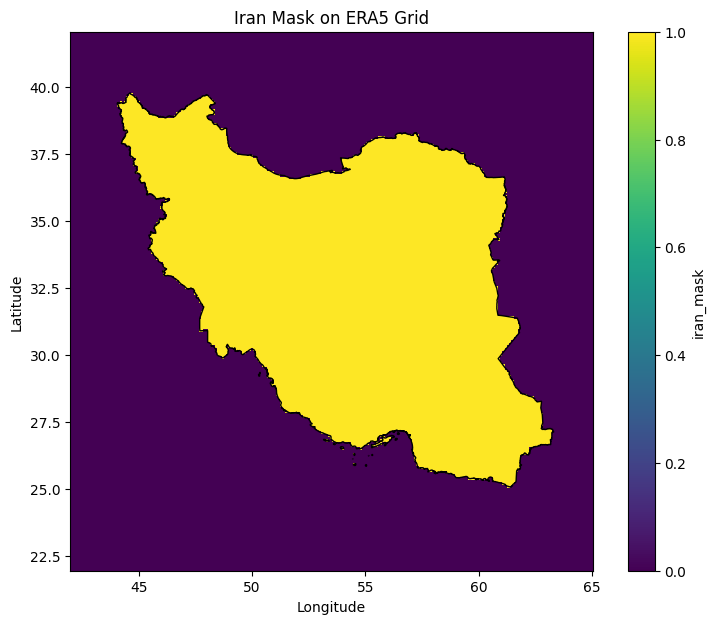

In [10]:
# ============================================================
# Create Iran mask on ERA5 grid
# ============================================================

iran = gpd.read_file(iran_shp)

if iran.crs is None:
    iran = iran.set_crs("EPSG:4326")
else:
    iran = iran.to_crs("EPSG:4326")


def create_country_mask(ds, country_gdf):
    lons = ds.longitude.values
    lats = ds.latitude.values

    lon2d, lat2d = np.meshgrid(lons, lats)

    points = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon2d.ravel(), lat2d.ravel())],
        crs="EPSG:4326"
    )

    country_polygon = country_gdf.geometry.union_all()

    mask_flat = points.within(country_polygon).values
    mask_2d = mask_flat.reshape(lat2d.shape)

    mask = xr.DataArray(
        mask_2d,
        coords={
            "latitude": ds.latitude,
            "longitude": ds.longitude
        },
        dims=("latitude", "longitude"),
        name="iran_mask"
    )

    return mask


iran_mask = create_country_mask(ds_era5, iran)

fig, ax = plt.subplots(figsize=(9, 7))
iran_mask.plot(ax=ax)
iran.boundary.plot(ax=ax, color="black", linewidth=1)
ax.set_title("Iran Mask on ERA5 Grid")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.savefig(FIG_DIR / "iran_mask_on_era5_grid.png", dpi=300, bbox_inches="tight")
plt.show()

In [11]:
# ============================================================
# Helper functions
# ============================================================

def standardize_model_dataset(ds):
    """
    Rename CMIP coordinates:
    lat -> latitude
    lon -> longitude
    """
    rename_dict = {}

    if "lat" in ds.coords or "lat" in ds.dims:
        rename_dict["lat"] = "latitude"

    if "lon" in ds.coords or "lon" in ds.dims:
        rename_dict["lon"] = "longitude"

    if rename_dict:
        ds = ds.rename(rename_dict)

    # Convert longitudes if needed
    if "longitude" in ds.coords:
        if float(ds.longitude.max()) > 180:
            ds = ds.assign_coords(
                longitude=(((ds.longitude + 180) % 360) - 180)
            )
            ds = ds.sortby("longitude")

    # Sort coordinates
    if "latitude" in ds.coords:
        ds = ds.sortby("latitude")

    if "longitude" in ds.coords:
        ds = ds.sortby("longitude")

    return ds


def select_period_by_year_month(da, start_year=2000, end_year=2014):
    """
    Works with both normal datetime64 and cftime calendars.
    Avoids pd.to_datetime errors for cftime.DatetimeNoLeap.
    """
    return da.where(
        (da.time.dt.year >= start_year) & 
        (da.time.dt.year <= end_year),
        drop=True
    )


def assign_month_index(da):
    """
    Replace time coordinate with a standard monthly index.
    This avoids problems when comparing ERA5 datetime64 with CMIP cftime.
    """
    years = da.time.dt.year.values
    months = da.time.dt.month.values

    new_time = pd.to_datetime([
        f"{int(y):04d}-{int(m):02d}-01"
        for y, m in zip(years, months)
    ])

    return da.assign_coords(time=new_time)


def convert_units(da, variable_type):
    """
    variable_type:
    - snow_depth: snd, units m
    - snowfall: prsn, units kg m-2 s-1
    """

    units_original = da.attrs.get("units", "")
    units = units_original.lower().replace(" ", "").replace("^", "**")

    da_out = da.copy()

    if variable_type == "snow_depth":
        # snd is already m in your files
        da_out.attrs["units"] = units_original
        return da_out

    if variable_type == "snowfall":
        # prsn: kg m-2 s-1
        # Convert to monthly m water equivalent:
        # kg m-2 s-1 × seconds/month = kg m-2 per month
        # 1 kg m-2 = 1 mm water = 0.001 m water
        if units in ["kgm-2s-1", "kg/m2/s", "kgm**-2s**-1"]:
            seconds_per_month = da_out.time.dt.days_in_month * 24 * 3600
            da_out = da_out * seconds_per_month / 1000.0
            da_out.attrs["units"] = "m water equivalent per month"
            da_out.attrs["unit_conversion"] = f"Converted from {units_original}"

        return da_out


def area_weighted_mean_iran(da, mask):
    weights = np.cos(np.deg2rad(da.latitude))
    weights.name = "weights"

    da_masked = da.where(mask)

    ts = da_masked.weighted(weights).mean(
        dim=("latitude", "longitude"),
        skipna=True
    )

    return ts


def calculate_metrics(obs, sim):
    df = pd.DataFrame({
        "ERA5": obs.values,
        "Model": sim.values
    }).dropna()

    if len(df) < 3:
        return {
            "n": len(df),
            "bias": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "corr": np.nan,
            "pbias": np.nan
        }

    bias = (df["Model"] - df["ERA5"]).mean()
    mae = mean_absolute_error(df["ERA5"], df["Model"])
    rmse = np.sqrt(mean_squared_error(df["ERA5"], df["Model"]))

    corr = pearsonr(df["ERA5"], df["Model"])[0]

    if df["ERA5"].sum() != 0:
        pbias = 100 * (df["Model"].sum() - df["ERA5"].sum()) / df["ERA5"].sum()
    else:
        pbias = np.nan

    return {
        "n": len(df),
        "bias": bias,
        "mae": mae,
        "rmse": rmse,
        "corr": corr,
        "pbias": pbias
    }


Model: CanESM5-CanOE
Variable type: snow_depth
File: data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model units original: m
ERA5 units: m
Model units after conversion: m
Common months: 180
Start: 2000-01-01 00:00:00
End: 2014-12-01 00:00:00


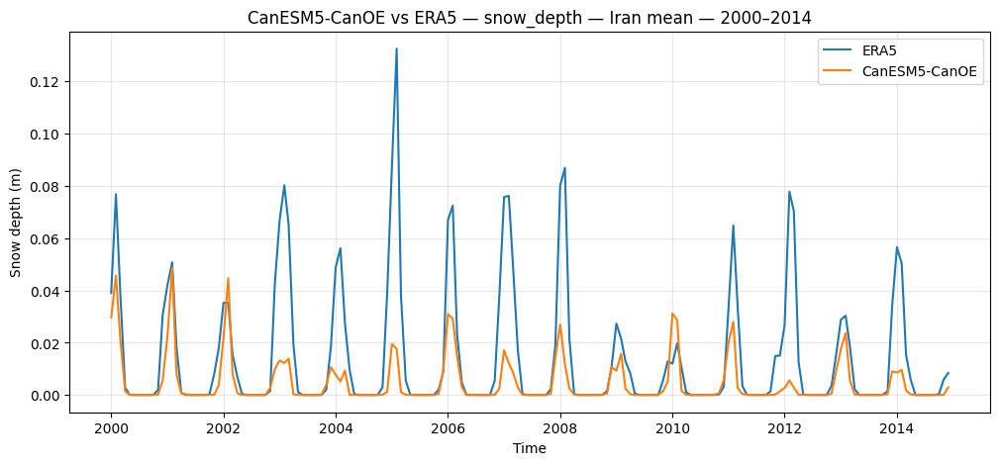

Saved: outputs\figures\timeseries_CanESM5-CanOE_snow_depth_vs_ERA5_2000_2014.png


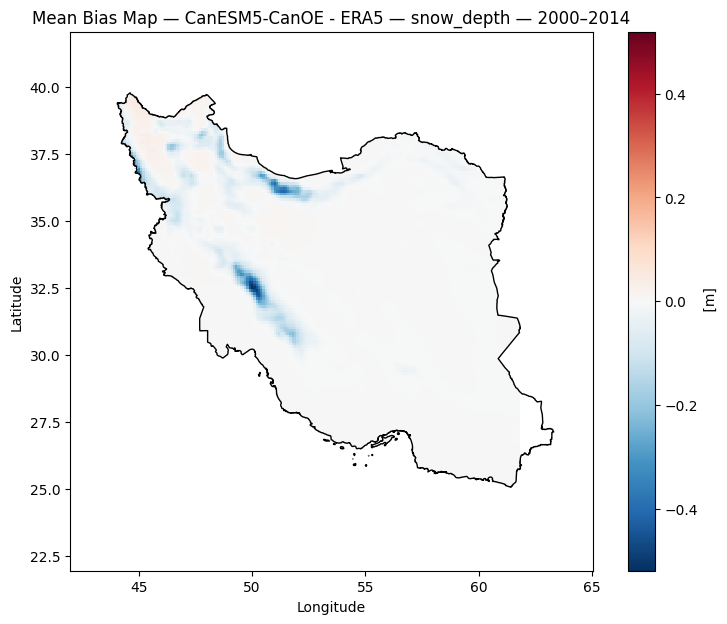

Saved: outputs\figures\bias_map_CanESM5-CanOE_snow_depth_2000_2014.png

Model: CanESM5-CanOE
Variable type: snowfall
File: data\raw\CanESM5-CanOE _Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model units original: kg m-2 s-1
ERA5 units: m of water equivalent
Model units after conversion: m water equivalent per month
Common months: 180
Start: 2000-01-01 00:00:00
End: 2014-12-01 00:00:00


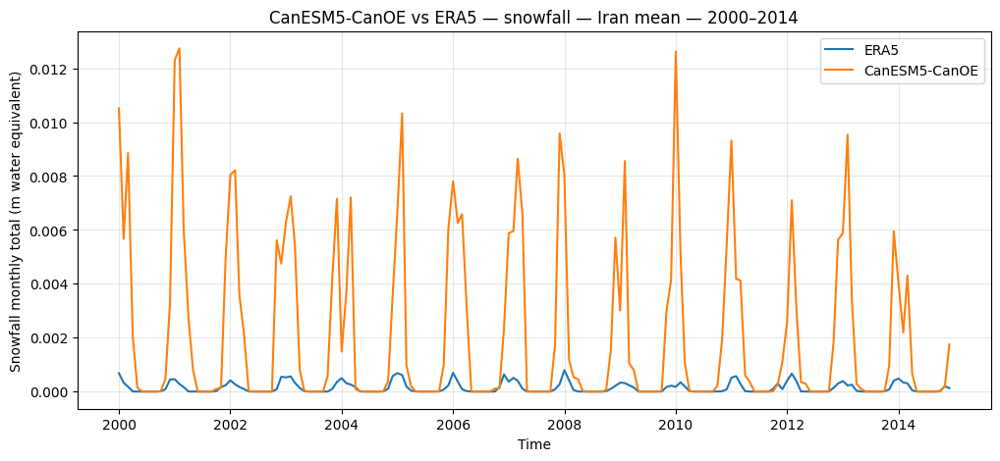

Saved: outputs\figures\timeseries_CanESM5-CanOE_snowfall_vs_ERA5_2000_2014.png


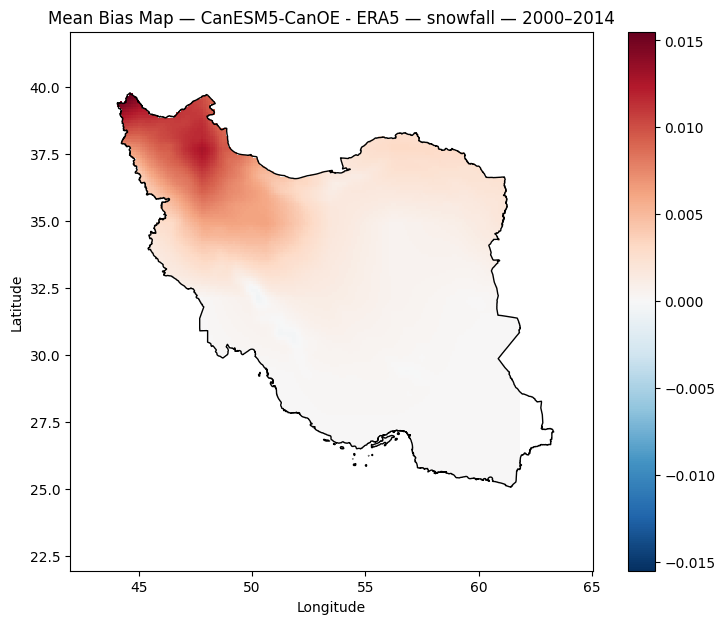

Saved: outputs\figures\bias_map_CanESM5-CanOE_snowfall_2000_2014.png

Model: GFDL-ESM4
Variable type: snow_depth
File: data\raw\GFDL-ESM4-Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model units original: m
ERA5 units: m
Model units after conversion: m
Common months: 180
Start: 2000-01-01 00:00:00
End: 2014-12-01 00:00:00


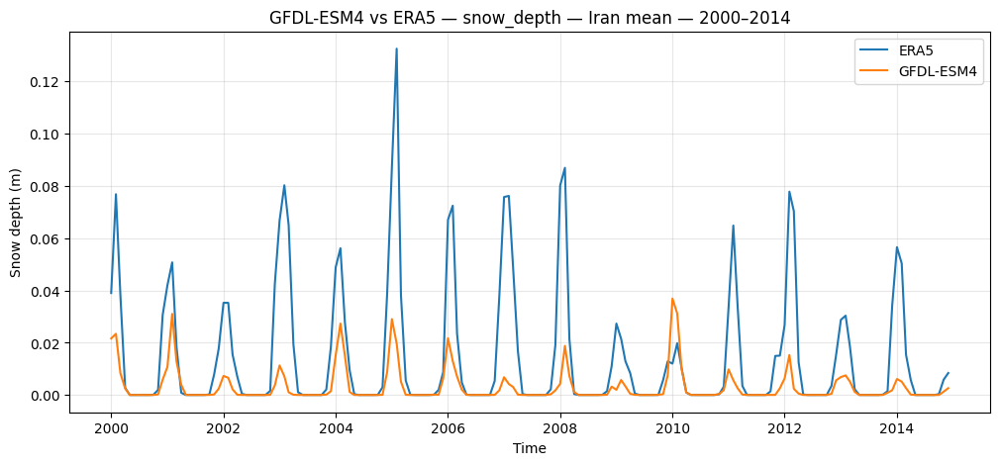

Saved: outputs\figures\timeseries_GFDL-ESM4_snow_depth_vs_ERA5_2000_2014.png


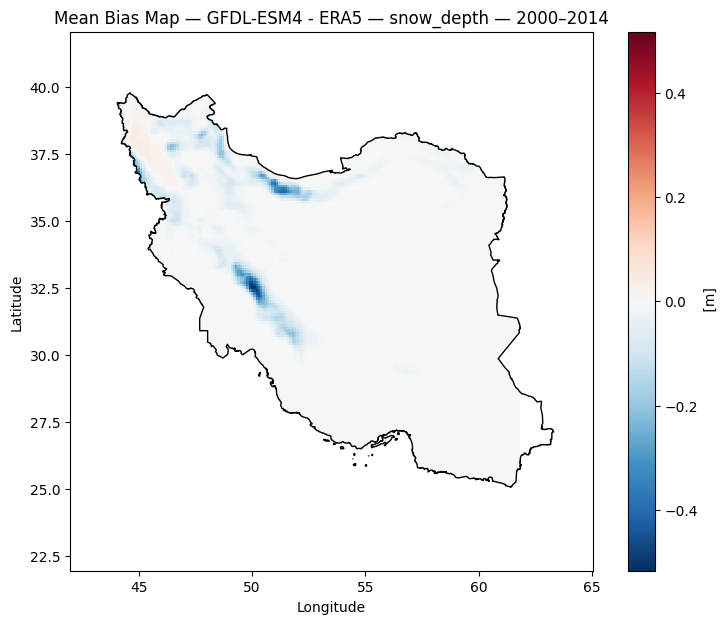

Saved: outputs\figures\bias_map_GFDL-ESM4_snow_depth_2000_2014.png

Model: GFDL-ESM4
Variable type: snowfall
File: data\raw\GFDL-ESM4-Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model units original: kg m-2 s-1
ERA5 units: m of water equivalent
Model units after conversion: m water equivalent per month
Common months: 180
Start: 2000-01-01 00:00:00
End: 2014-12-01 00:00:00


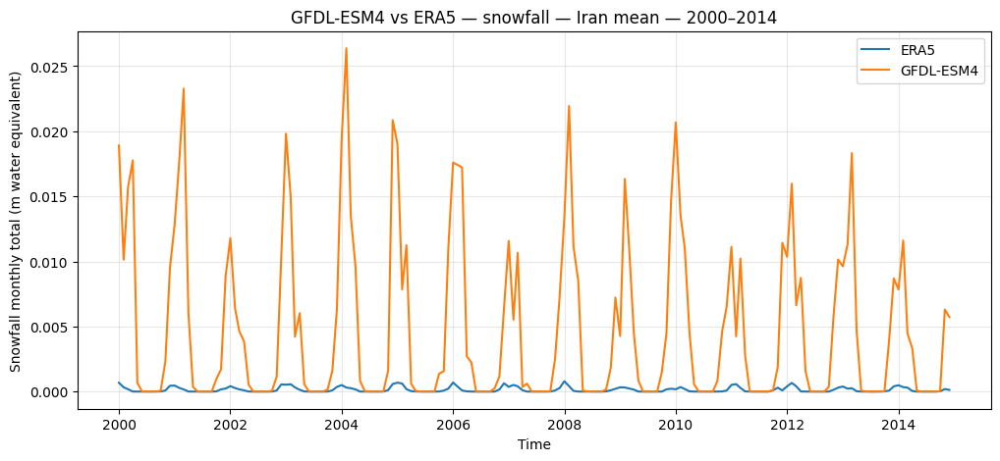

Saved: outputs\figures\timeseries_GFDL-ESM4_snowfall_vs_ERA5_2000_2014.png


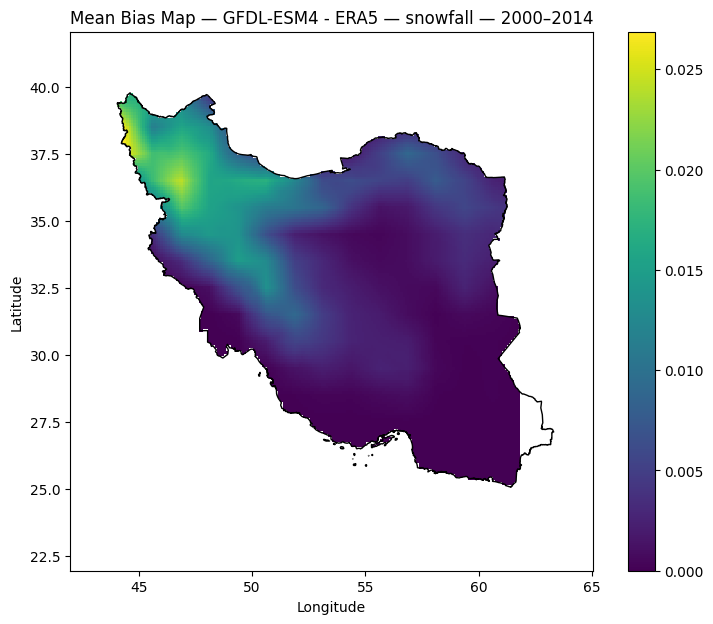

Saved: outputs\figures\bias_map_GFDL-ESM4_snowfall_2000_2014.png


In [12]:
# ============================================================
# Main validation loop
# ============================================================

# Correct ERA5 mapping based on your model variables
era5_var_map = {
    "snow_depth": "sde",  # CMIP snd, m  -> ERA5 sde, m
    "snowfall": "sf"     # CMIP prsn converted to monthly m w.e. -> ERA5 sf
}

model_var_map = {
    "snow_depth": "snd",
    "snowfall": "prsn"
}

validation_results = []
timeseries_all = []

for model_name, var_files in model_files.items():

    for variable_type, model_path in var_files.items():

        print("\n" + "=" * 90)
        print("Model:", model_name)
        print("Variable type:", variable_type)
        print("File:", model_path)

        # -----------------------------
        # Load model
        # -----------------------------
        ds_model = xr.open_dataset(model_path, decode_times=True)
        ds_model = standardize_model_dataset(ds_model)

        model_var = model_var_map[variable_type]
        era5_var = era5_var_map[variable_type]

        print("Model variable:", model_var)
        print("ERA5 variable:", era5_var)

        model_da = ds_model[model_var]
        era_da = ds_era5[era5_var]

        print("Model units original:", model_da.attrs.get("units", ""))
        print("ERA5 units:", era_da.attrs.get("units", ""))

        # -----------------------------
        # Select 2000–2014
        # -----------------------------
        model_sub = select_period_by_year_month(model_da, 2000, 2014)
        era_sub = select_period_by_year_month(era_da, 2000, 2014)

        # -----------------------------
        # Convert time to common monthly datetime index
        # -----------------------------
        model_sub = assign_month_index(model_sub)
        era_sub = assign_month_index(era_sub)

        # -----------------------------
        # Unit conversion
        # -----------------------------
        model_sub = convert_units(model_sub, variable_type)

        print("Model units after conversion:", model_sub.attrs.get("units", ""))

        # -----------------------------
        # Match common months
        # -----------------------------
        common_time = np.intersect1d(era_sub.time.values, model_sub.time.values)

        era_sub = era_sub.sel(time=common_time)
        model_sub = model_sub.sel(time=common_time)

        print("Common months:", len(common_time))
        print("Start:", pd.to_datetime(common_time[0]))
        print("End:", pd.to_datetime(common_time[-1]))

        # -----------------------------
        # Regrid model to ERA5 grid
        # -----------------------------
        model_on_era = model_sub.interp(
            latitude=era_sub.latitude,
            longitude=era_sub.longitude,
            method="linear"
        )

        # -----------------------------
        # Apply Iran mask
        # -----------------------------
        era_iran = era_sub.where(iran_mask)
        model_iran = model_on_era.where(iran_mask)

        # -----------------------------
        # Iran area-weighted mean
        # -----------------------------
        era_ts = area_weighted_mean_iran(era_iran, iran_mask)
        model_ts = area_weighted_mean_iran(model_iran, iran_mask)

        # -----------------------------
        # Metrics
        # -----------------------------
        metrics = calculate_metrics(era_ts, model_ts)

        validation_results.append({
            "model": model_name,
            "variable_type": variable_type,
            "model_variable": model_var,
            "era5_variable": era5_var,
            "model_units_final": model_sub.attrs.get("units", ""),
            "era5_units": era_da.attrs.get("units", ""),
            **metrics
        })

        # -----------------------------
        # Save time series rows
        # -----------------------------
        df_ts = pd.DataFrame({
            "time": pd.to_datetime(era_ts.time.values),
            "ERA5": era_ts.values,
            "Model": model_ts.values,
            "model": model_name,
            "variable_type": variable_type
        })

        timeseries_all.append(df_ts)

        # -----------------------------
        # Plot time series
        # -----------------------------
        fig, ax = plt.subplots(figsize=(12, 5))

        ax.plot(era_ts.time, era_ts, label="ERA5")
        ax.plot(model_ts.time, model_ts, label=model_name)

        ax.set_title(f"{model_name} vs ERA5 — {variable_type} — Iran mean — 2000–2014")
        ax.set_xlabel("Time")

        if variable_type == "snow_depth":
            ax.set_ylabel("Snow depth (m)")
        else:
            ax.set_ylabel("Snowfall monthly total (m water equivalent)")

        ax.grid(True, alpha=0.3)
        ax.legend()

        fig_path = FIG_DIR / f"timeseries_{model_name}_{variable_type}_vs_ERA5_2000_2014.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        print("Saved:", fig_path)

        # -----------------------------
        # Bias map
        # -----------------------------
        bias_map = (model_iran - era_iran).mean(dim="time", skipna=True)

        fig, ax = plt.subplots(figsize=(9, 7))
        bias_map.plot(ax=ax)
        iran.boundary.plot(ax=ax, color="black", linewidth=1)

        ax.set_title(f"Mean Bias Map — {model_name} - ERA5 — {variable_type} — 2000–2014")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

        fig_path = FIG_DIR / f"bias_map_{model_name}_{variable_type}_2000_2014.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        print("Saved:", fig_path)

In [13]:
# ============================================================
# Save validation results
# ============================================================

validation_df = pd.DataFrame(validation_results)

validation_csv = OUT_DIR / "ERA5_vs_CMIP6_validation_2000_2014.csv"
validation_df.to_csv(validation_csv, index=False)

print("\nValidation results:")
print(validation_df)

print("\nSaved:")
print(validation_csv)

# Save time series
timeseries_df = pd.concat(timeseries_all, ignore_index=True)

timeseries_csv = OUT_DIR / "ERA5_CMIP6_Iran_mean_timeseries_2000_2014.csv"
timeseries_df.to_csv(timeseries_csv, index=False)

print("\nSaved time series:")
print(timeseries_csv)

print(timeseries_df.head())


Validation results:
           model variable_type model_variable era5_variable  \
0  CanESM5-CanOE    snow_depth            snd           sde   
1  CanESM5-CanOE      snowfall           prsn            sf   
2      GFDL-ESM4    snow_depth            snd           sde   
3      GFDL-ESM4      snowfall           prsn            sf   

              model_units_final             era5_units    n      bias  \
0                             m                      m  180 -0.009725   
1  m water equivalent per month  m of water equivalent  180  0.002007   
2                             m                      m  180 -0.011186   
3  m water equivalent per month  m of water equivalent  180  0.004694   

        mae      rmse      corr        pbias  
0  0.010217  0.021424  0.676323   -67.441431  
1  0.002010  0.003607  0.740231  1459.986192  
2  0.011636  0.023241  0.653233   -77.577320  
3  0.004694  0.007778  0.732776  3415.319443  

Saved:
data\processed\ERA5_vs_CMIP6_validation_2000_2014.csv


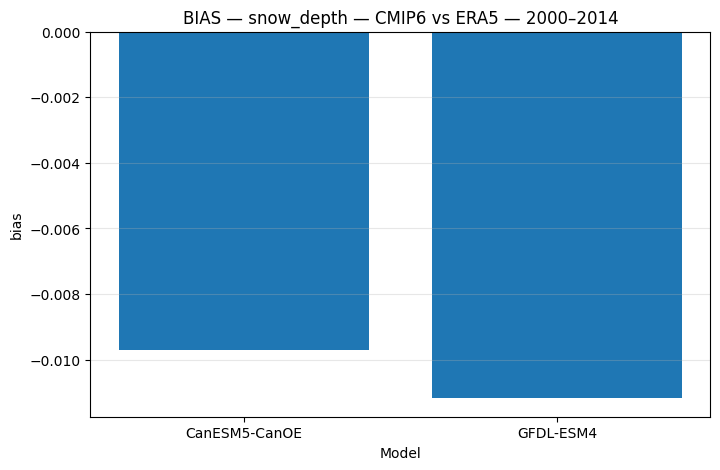

Saved: outputs\figures\summary_bias_snow_depth_CMIP6_vs_ERA5_2000_2014.png


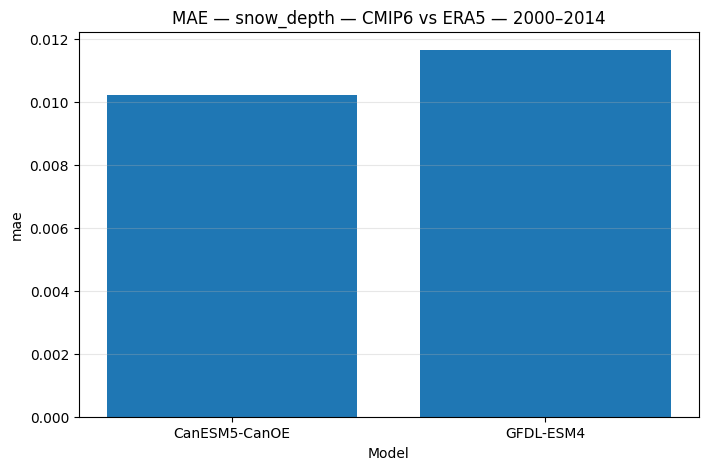

Saved: outputs\figures\summary_mae_snow_depth_CMIP6_vs_ERA5_2000_2014.png


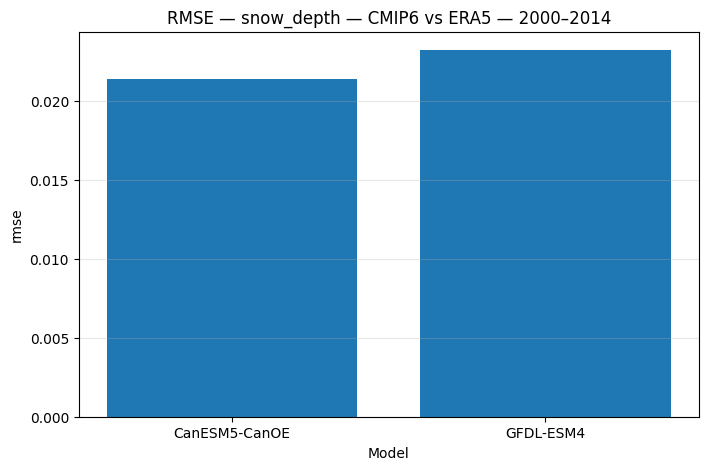

Saved: outputs\figures\summary_rmse_snow_depth_CMIP6_vs_ERA5_2000_2014.png


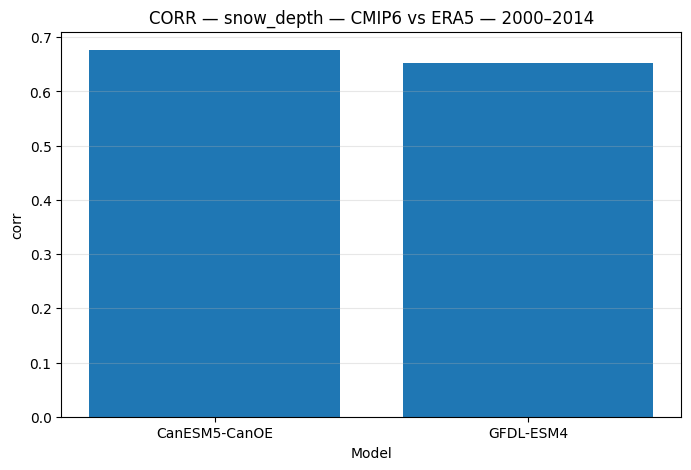

Saved: outputs\figures\summary_corr_snow_depth_CMIP6_vs_ERA5_2000_2014.png


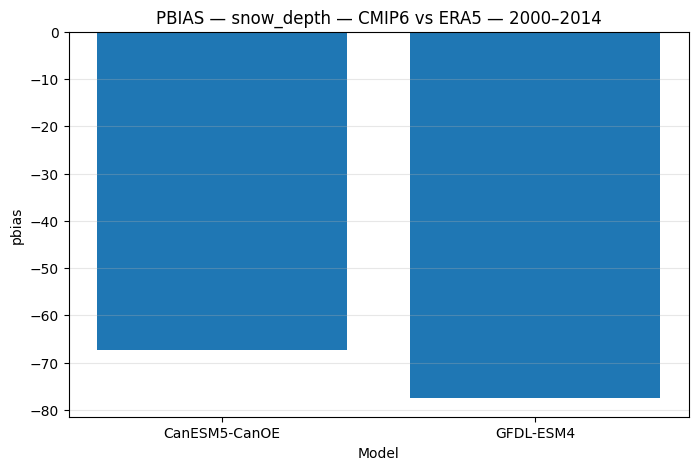

Saved: outputs\figures\summary_pbias_snow_depth_CMIP6_vs_ERA5_2000_2014.png


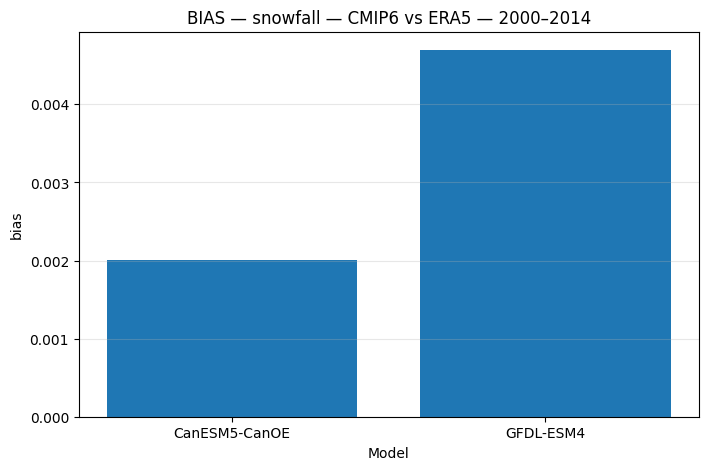

Saved: outputs\figures\summary_bias_snowfall_CMIP6_vs_ERA5_2000_2014.png


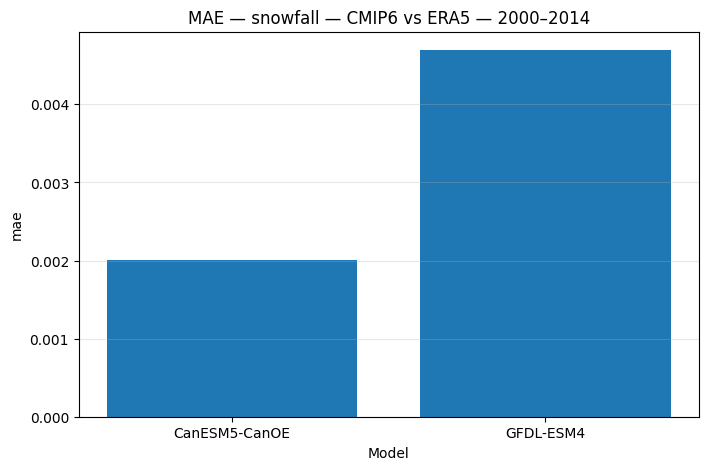

Saved: outputs\figures\summary_mae_snowfall_CMIP6_vs_ERA5_2000_2014.png


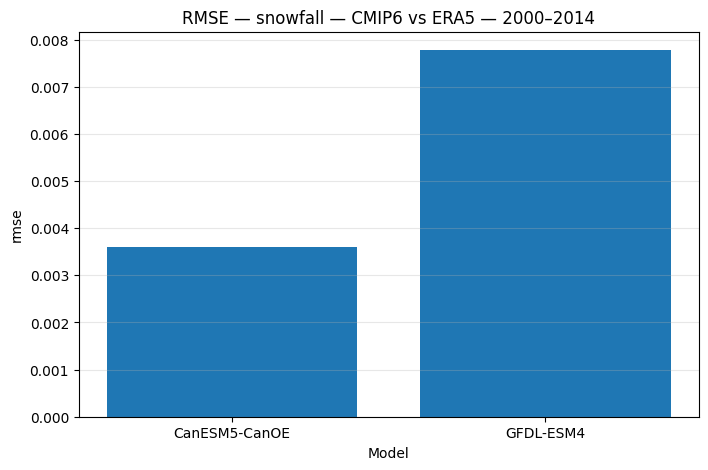

Saved: outputs\figures\summary_rmse_snowfall_CMIP6_vs_ERA5_2000_2014.png


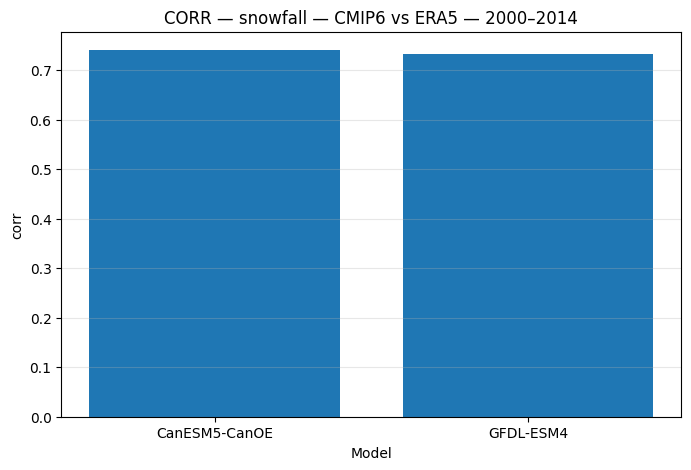

Saved: outputs\figures\summary_corr_snowfall_CMIP6_vs_ERA5_2000_2014.png


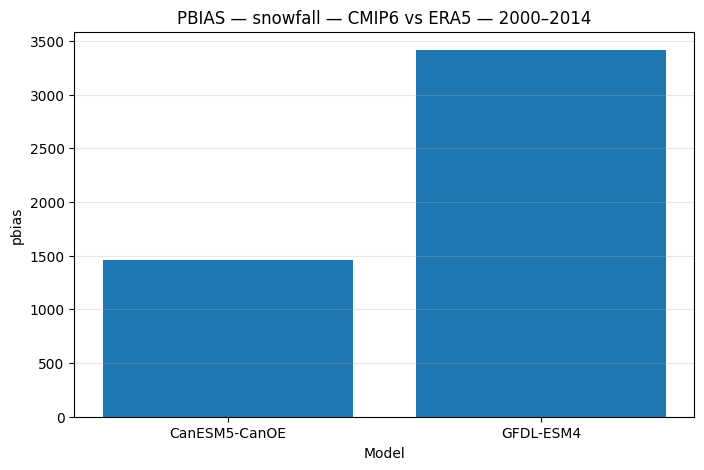

Saved: outputs\figures\summary_pbias_snowfall_CMIP6_vs_ERA5_2000_2014.png


In [14]:
# ============================================================
# Summary bar plots
# ============================================================

metrics_to_plot = ["bias", "mae", "rmse", "corr", "pbias"]

for variable_type in validation_df["variable_type"].unique():

    df_var = validation_df[validation_df["variable_type"] == variable_type].copy()

    for metric in metrics_to_plot:

        fig, ax = plt.subplots(figsize=(8, 5))

        ax.bar(df_var["model"], df_var[metric])

        ax.set_title(f"{metric.upper()} — {variable_type} — CMIP6 vs ERA5 — 2000–2014")
        ax.set_xlabel("Model")
        ax.set_ylabel(metric)
        ax.grid(axis="y", alpha=0.3)

        fig_path = FIG_DIR / f"summary_{metric}_{variable_type}_CMIP6_vs_ERA5_2000_2014.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        print("Saved:", fig_path)

In [18]:
# ============================================================
# CODE 0 — Inspect all CMIP6 snow model files
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"

OUT_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Model files
# -----------------------------
model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },

    "CNRM-CM6-1-HR": {
        "snowfall": RAW_DIR / "CNRM-CM6-1-HR_Snowfall flux.nc",
    },

    "EC-Earth3-AerChem": {
        "snow_depth": RAW_DIR / "EC-Earth3-AerChem_Snow depth.nc",
        "snowfall": RAW_DIR / "EC-Earth3-AerChem_Snowfall flux.nc",
    },

    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    },

    "HadGEM3-GC31-MM": {
        "snowfall": RAW_DIR / "HadGEM3-GC31-MM_Snowfall flux.nc",
    },

    "MPI-ESM1-2-HR": {
        "snowfall": RAW_DIR / "MPI-ESM1-2-HR_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MPI-ESM1-2-HR_Surface snow amount.nc",
    },

    "MRI-ESM2-0": {
        "snow_depth": RAW_DIR / "MRI-ESM2-0_Snow depth.nc",
        "snowfall": RAW_DIR / "MRI-ESM2-0_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MRI-ESM2-0_Surface snow amount.nc",
    },
}

# -----------------------------
# Helper functions
# -----------------------------
def get_coord_name(ds, possible_names):
    for name in possible_names:
        if name in ds.coords or name in ds.dims:
            return name
    return None


def estimate_resolution(values):
    values = np.asarray(values)
    values = values[~np.isnan(values)]

    if len(values) < 2:
        return np.nan

    values = np.sort(np.unique(values))
    diffs = np.diff(values)

    if len(diffs) == 0:
        return np.nan

    return float(np.median(np.abs(diffs)))


def detect_main_variable(ds):
    ignore_keywords = ["bnds", "bounds"]

    candidates = []

    for v in ds.data_vars:
        v_lower = v.lower()

        if any(k in v_lower for k in ignore_keywords):
            continue

        dims = set(ds[v].dims)

        has_time = any(d in dims for d in ["time", "valid_time"])
        has_lat = any(d in dims for d in ["lat", "latitude", "y"])
        has_lon = any(d in dims for d in ["lon", "longitude", "x"])

        if has_time and has_lat and has_lon:
            candidates.append(v)

    if len(candidates) == 1:
        return candidates[0]

    if len(candidates) > 1:
        return candidates[0]

    return None


def safe_time_range(ds, time_name):
    if time_name is None:
        return None, None, None

    try:
        years = ds[time_name].dt.year.values
        months = ds[time_name].dt.month.values

        start = f"{int(years[0]):04d}-{int(months[0]):02d}"
        end = f"{int(years[-1]):04d}-{int(months[-1]):02d}"

        return start, end, len(years)

    except Exception:
        return "not decoded", "not decoded", ds.sizes.get(time_name, np.nan)


# -----------------------------
# Inspection loop
# -----------------------------
summary_rows = []

for model_name, files in model_files.items():

    for file_type, file_path in files.items():

        print("\n" + "=" * 100)
        print("MODEL:", model_name)
        print("FILE TYPE:", file_type)
        print("FILE:", file_path)
        print("EXISTS:", file_path.exists())

        if not file_path.exists():
            continue

        ds = xr.open_dataset(file_path, decode_times=True)

        print("\nDATASET:")
        print(ds)

        lat_name = get_coord_name(ds, ["latitude", "lat", "y"])
        lon_name = get_coord_name(ds, ["longitude", "lon", "x"])
        time_name = get_coord_name(ds, ["time", "valid_time", "date", "month"])

        main_var = detect_main_variable(ds)

        print("\nDetected:")
        print("time:", time_name)
        print("lat:", lat_name)
        print("lon:", lon_name)
        print("main variable:", main_var)

        start_time, end_time, n_time = safe_time_range(ds, time_name)

        if lat_name is not None:
            lat_min = float(ds[lat_name].min())
            lat_max = float(ds[lat_name].max())
            lat_res = estimate_resolution(ds[lat_name].values)
            n_lat = ds.sizes.get(lat_name, np.nan)
        else:
            lat_min = lat_max = lat_res = n_lat = np.nan

        if lon_name is not None:
            lon_min = float(ds[lon_name].min())
            lon_max = float(ds[lon_name].max())
            lon_res = estimate_resolution(ds[lon_name].values)
            n_lon = ds.sizes.get(lon_name, np.nan)
        else:
            lon_min = lon_max = lon_res = n_lon = np.nan

        if main_var is not None:
            units = ds[main_var].attrs.get("units", "")
            long_name = ds[main_var].attrs.get("long_name", "")
            standard_name = ds[main_var].attrs.get("standard_name", "")
            shape = ds[main_var].shape
            dims = ds[main_var].dims
        else:
            units = long_name = standard_name = ""
            shape = ""
            dims = ""

        print("\nMain variable information:")
        print("variable:", main_var)
        print("long_name:", long_name)
        print("standard_name:", standard_name)
        print("units:", units)
        print("dims:", dims)
        print("shape:", shape)

        print("\nGrid:")
        print("lat range:", lat_min, "to", lat_max)
        print("lon range:", lon_min, "to", lon_max)
        print("lat resolution:", lat_res)
        print("lon resolution:", lon_res)
        print("n_lat:", n_lat)
        print("n_lon:", n_lon)

        print("\nTime:")
        print("start:", start_time)
        print("end:", end_time)
        print("n_time:", n_time)

        summary_rows.append({
            "model": model_name,
            "file_type": file_type,
            "file": str(file_path),
            "exists": file_path.exists(),
            "main_variable": main_var,
            "long_name": long_name,
            "standard_name": standard_name,
            "units": units,
            "dims": str(dims),
            "shape": str(shape),
            "time_name": time_name,
            "start_time": start_time,
            "end_time": end_time,
            "n_time": n_time,
            "lat_name": lat_name,
            "lon_name": lon_name,
            "n_lat": n_lat,
            "n_lon": n_lon,
            "lat_min": lat_min,
            "lat_max": lat_max,
            "lon_min": lon_min,
            "lon_max": lon_max,
            "lat_resolution_degree": lat_res,
            "lon_resolution_degree": lon_res,
        })

summary_df = pd.DataFrame(summary_rows)

summary_csv = OUT_DIR / "all_cmip6_snow_models_inspection_summary.csv"
summary_df.to_csv(summary_csv, index=False)

print("\n" + "=" * 100)
print("INSPECTION SUMMARY:")
print(summary_df)

print("\nSaved:")
print(summary_csv)


MODEL: CanESM5-CanOE
FILE TYPE: snow_depth
FILE: data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc
EXISTS: True

DATASET:
<xarray.Dataset> Size: 51kB
Dimensions:    (time: 180, bnds: 2, lat: 8, lon: 8)
Coordinates:
  * time       (time) object 1kB 2000-01-16 12:00:00 ... 2014-12-16 12:00:00
  * lat        (lat) float64 64B 23.72 26.51 29.3 32.09 34.88 37.67 40.46 43.25
  * lon        (lon) float64 64B 42.19 45.0 47.81 50.62 53.44 56.25 59.06 61.88
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) object 3kB ...
    lat_bnds   (lat, bnds) float64 128B ...
    lon_bnds   (lon, bnds) float64 128B ...
    snd        (time, lat, lon) float32 46kB ...
Attributes: (12/53)
    CCCma_model_hash:            932b659de600c6a0e94f619abaf9cc79eabcd337
    CCCma_parent_runid:          canoecpl-007
    CCCma_pycmor_hash:           3ecdc18eb7c1f7fbce0346850f41adf815d9fb66
    CCCma_runid:                 c2-his01
    Conventions:                 CF-1.7 CMIP-6.2
    YMDH_b


METHOD: model_to_era5
MODEL: CanESM5-CanOE
VARIABLE TYPE: snow_depth
FILE: data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


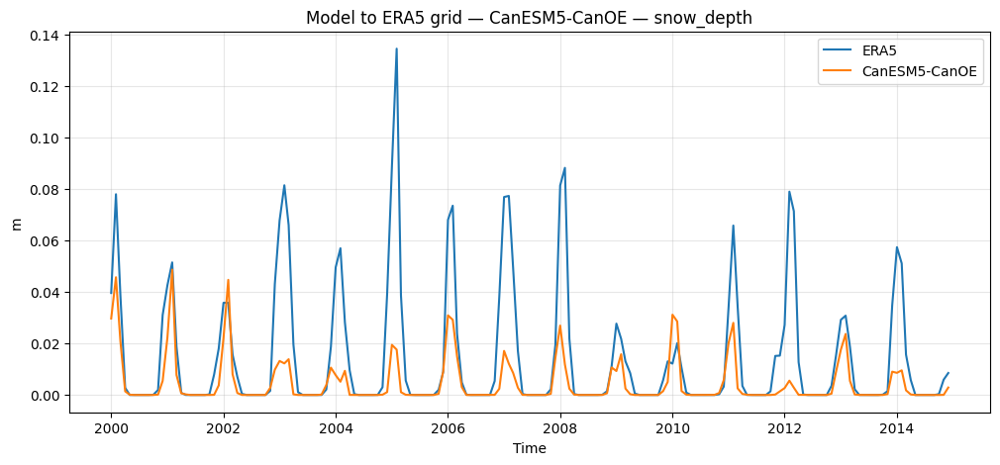

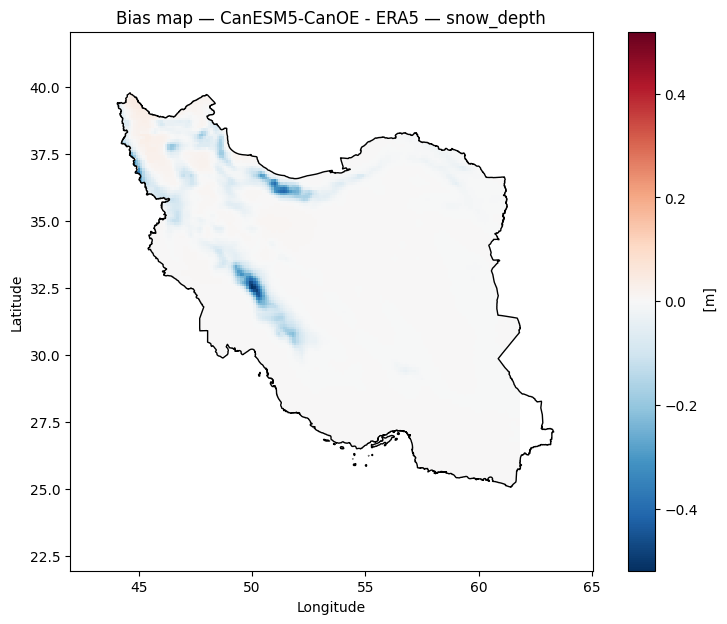

Metrics: {'n': 180, 'bias': -0.00993631295066771, 'mae': 0.010414777549861951, 'rmse': 0.0218151435868802, 'corr': 0.6763122434180305, 'pbias': -67.91264363096876}

METHOD: model_to_era5
MODEL: CanESM5-CanOE
VARIABLE TYPE: snowfall
FILE: data\raw\CanESM5-CanOE _Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


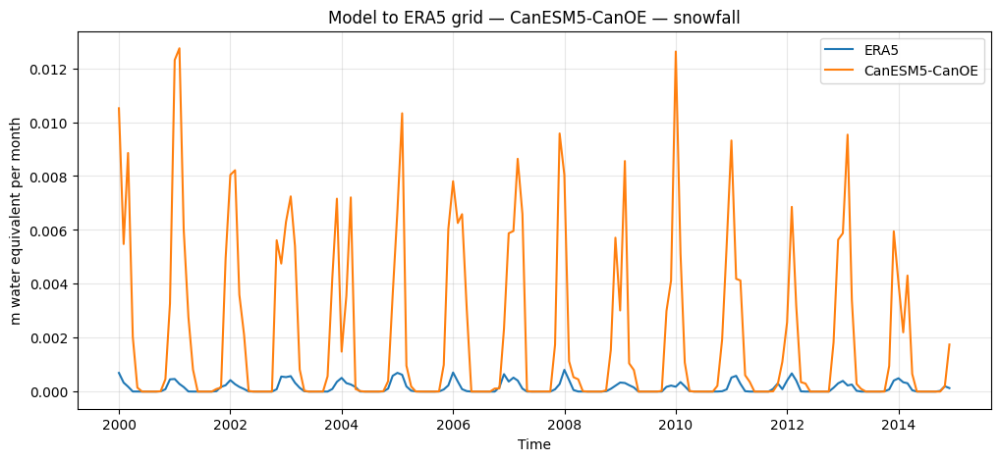

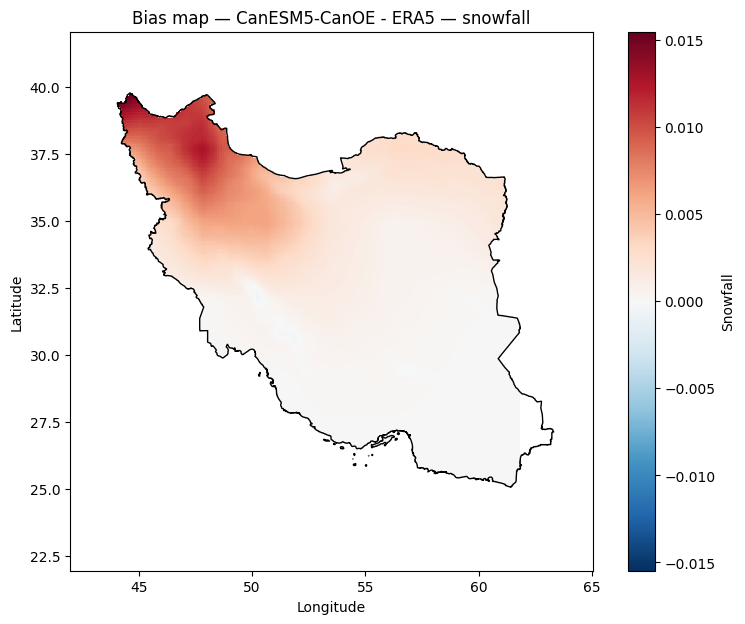

Metrics: {'n': 180, 'bias': 0.002001414591897772, 'mae': 0.002004751805861515, 'rmse': 0.003599708687610475, 'corr': 0.7392115217070079, 'pbias': 1435.1931428102314}

METHOD: model_to_era5
MODEL: CNRM-CM6-1-HR
VARIABLE TYPE: snowfall
FILE: data\raw\CNRM-CM6-1-HR_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


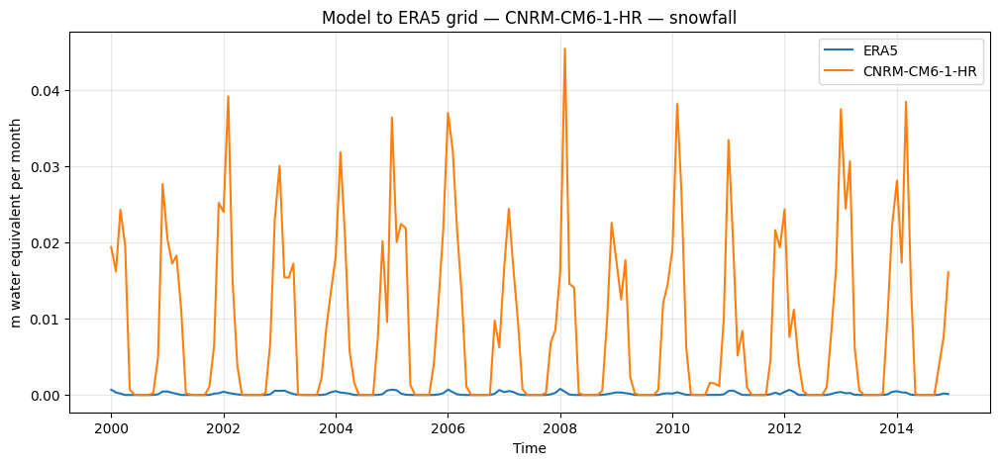

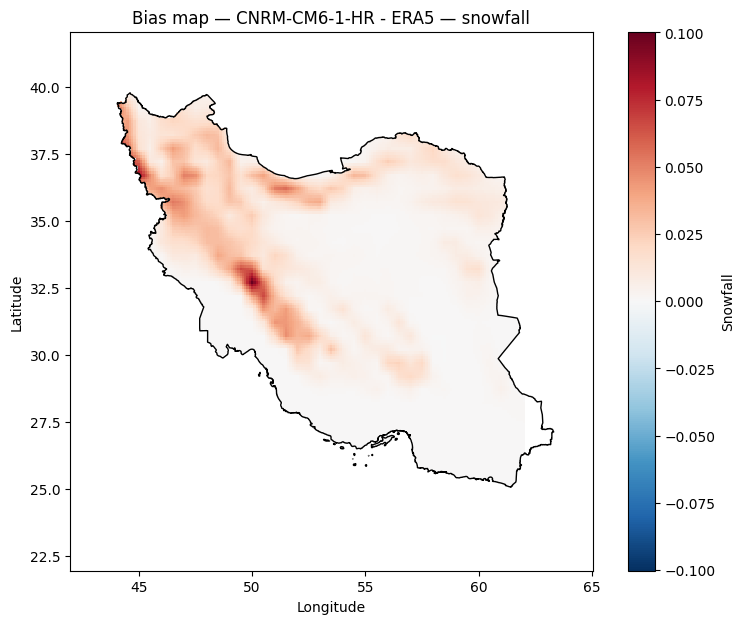

Metrics: {'n': 180, 'bias': 0.008965608021585676, 'mae': 0.008965617989824344, 'rmse': 0.014103195870885793, 'corr': 0.7380625543208538, 'pbias': 6449.094553266525}

METHOD: model_to_era5
MODEL: EC-Earth3-AerChem
VARIABLE TYPE: snow_depth
FILE: data\raw\EC-Earth3-AerChem_Snow depth.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


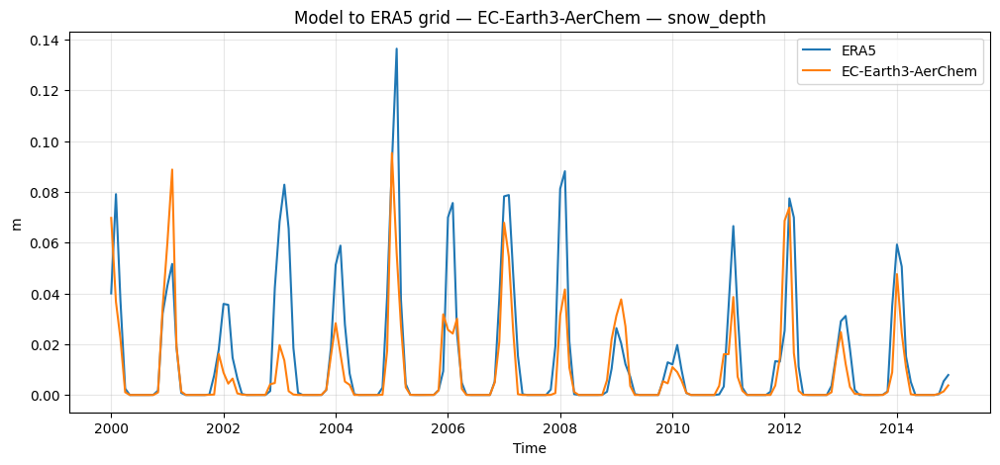

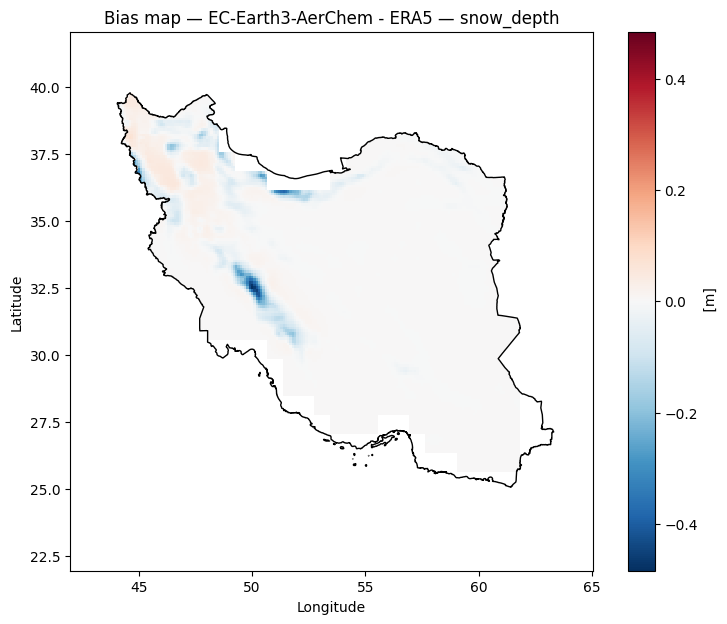

Metrics: {'n': 180, 'bias': -0.005413620290993028, 'mae': 0.00806619757912099, 'rmse': 0.016897481341407367, 'corr': 0.7613989403843004, 'pbias': -37.231922659625255}

METHOD: model_to_era5
MODEL: EC-Earth3-AerChem
VARIABLE TYPE: snowfall
FILE: data\raw\EC-Earth3-AerChem_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


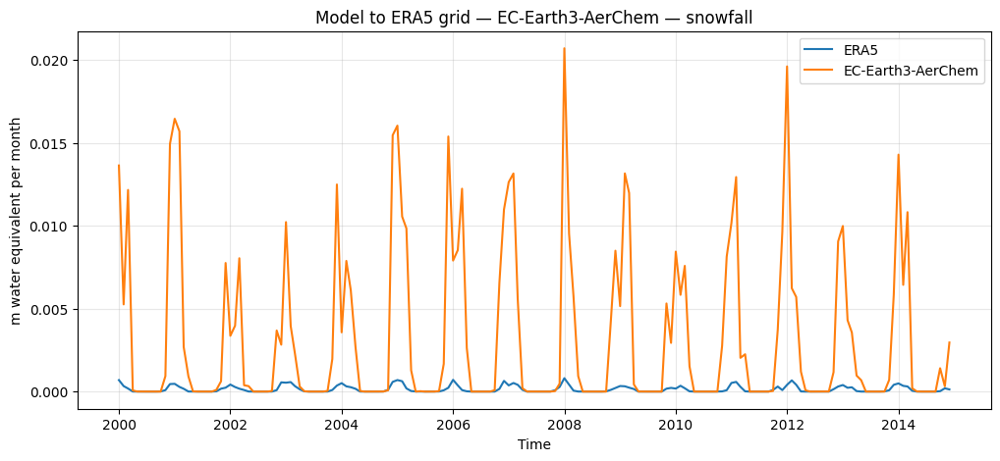

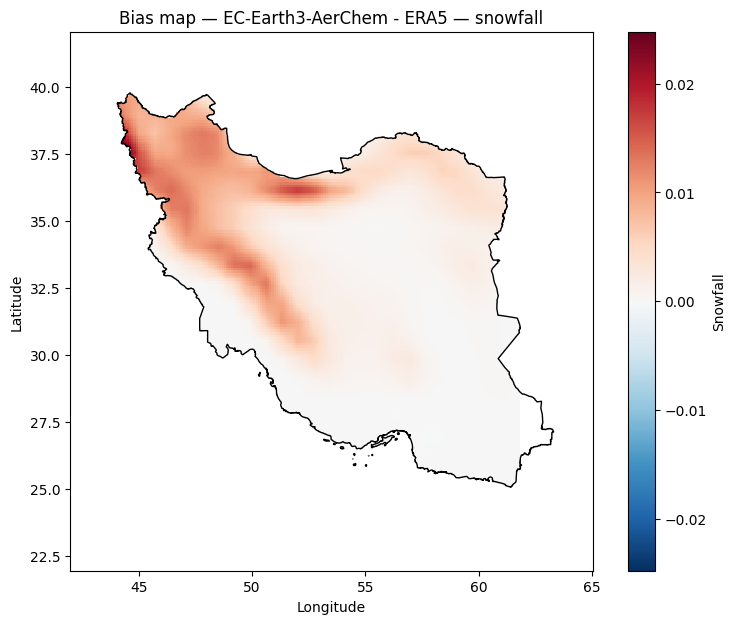

Metrics: {'n': 180, 'bias': 0.003117242628858829, 'mae': 0.0031193733598085995, 'rmse': 0.005656906145597487, 'corr': 0.7952654936733696, 'pbias': 2235.341573192846}

METHOD: model_to_era5
MODEL: GFDL-ESM4
VARIABLE TYPE: snow_depth
FILE: data\raw\GFDL-ESM4-Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


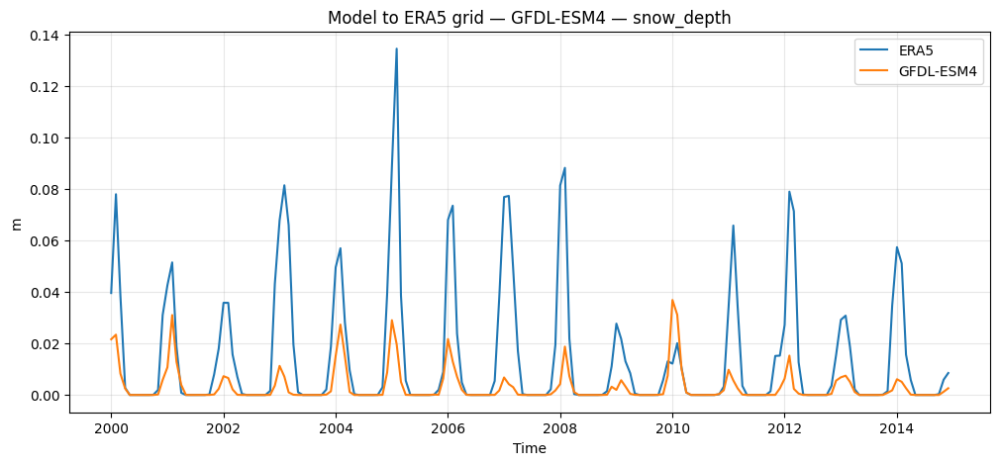

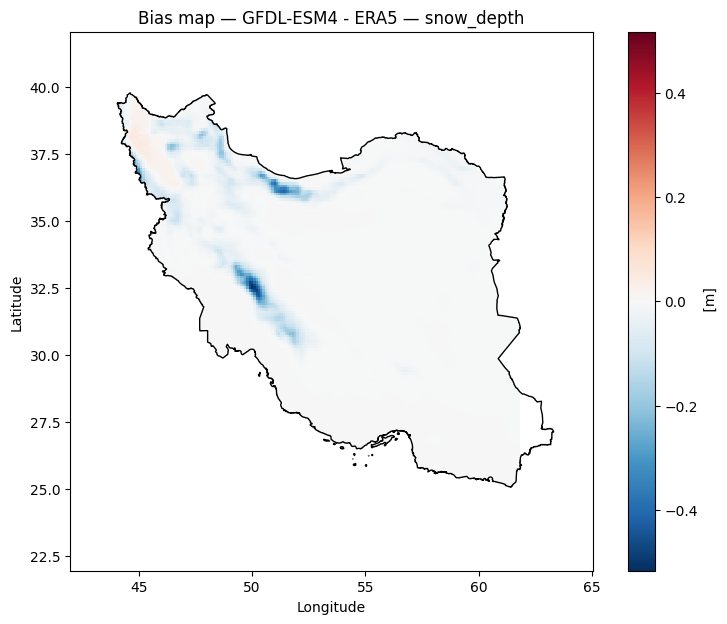

Metrics: {'n': 180, 'bias': -0.011397834034587835, 'mae': 0.01184218806266612, 'rmse': 0.02364369591019269, 'corr': 0.6532242603265191, 'pbias': -77.90183860208238}

METHOD: model_to_era5
MODEL: GFDL-ESM4
VARIABLE TYPE: snowfall
FILE: data\raw\GFDL-ESM4-Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


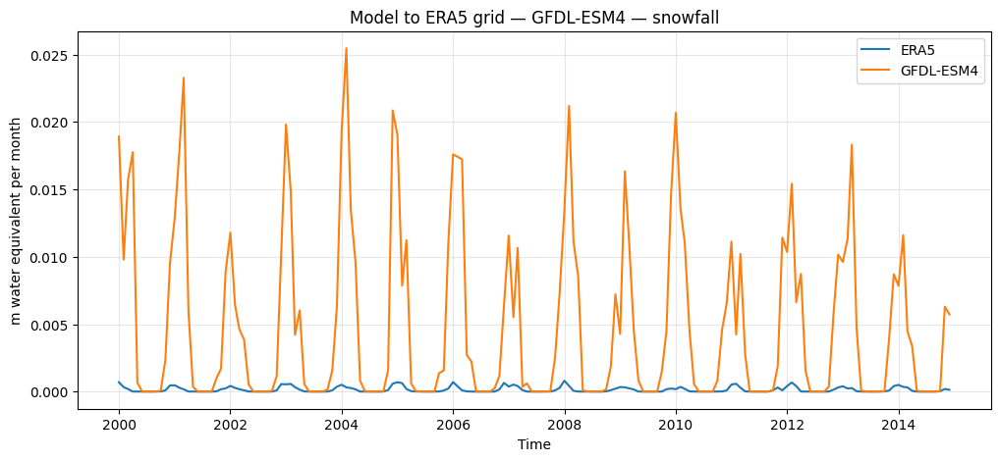

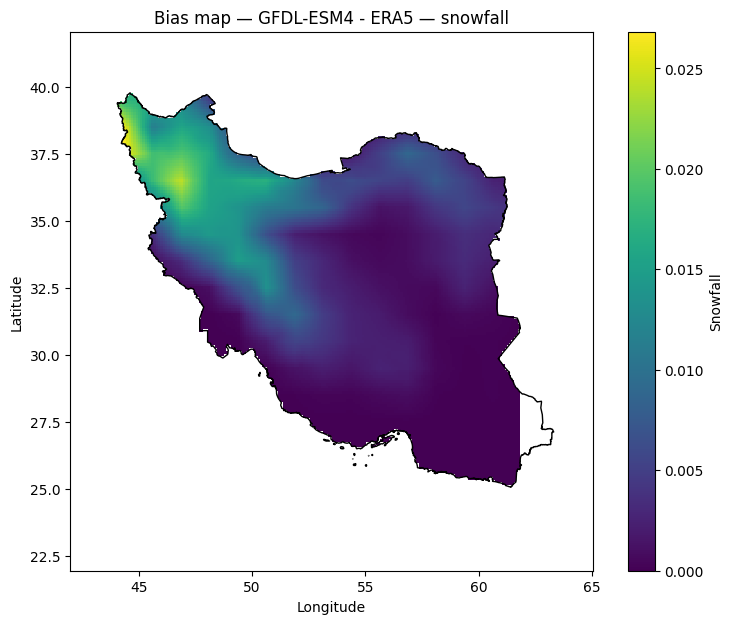

Metrics: {'n': 180, 'bias': 0.004678187217644423, 'mae': 0.004678209908313641, 'rmse': 0.007738593900726393, 'corr': 0.7334924974969411, 'pbias': 3354.678353824949}

METHOD: model_to_era5
MODEL: HadGEM3-GC31-MM
VARIABLE TYPE: snowfall
FILE: data\raw\HadGEM3-GC31-MM_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


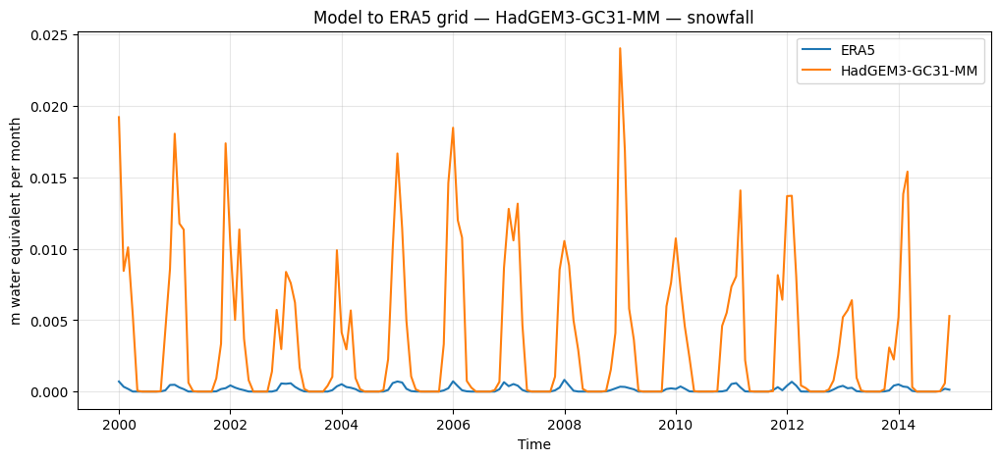

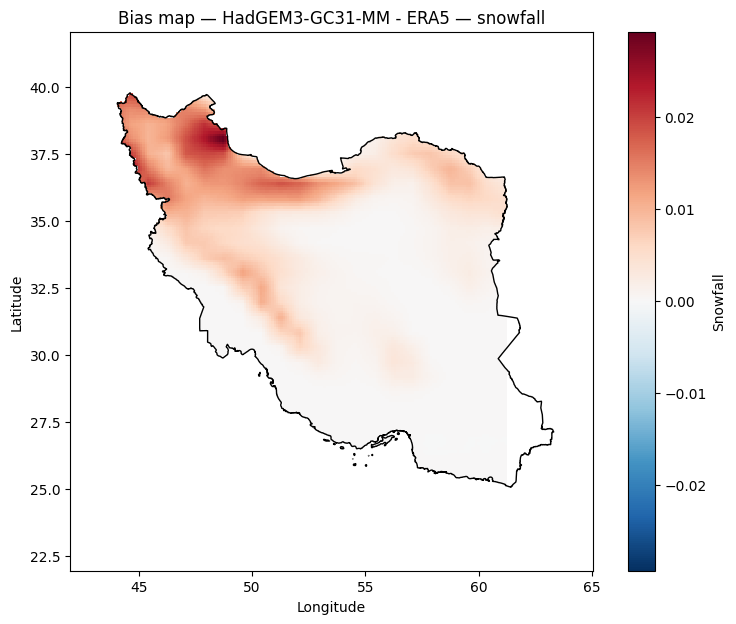

Metrics: {'n': 180, 'bias': 0.0035268477844889253, 'mae': 0.0035277608177803404, 'rmse': 0.006106671175244791, 'corr': 0.7828108105540781, 'pbias': 2484.240814640669}

METHOD: model_to_era5
MODEL: MPI-ESM1-2-HR
VARIABLE TYPE: snowfall
FILE: data\raw\MPI-ESM1-2-HR_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


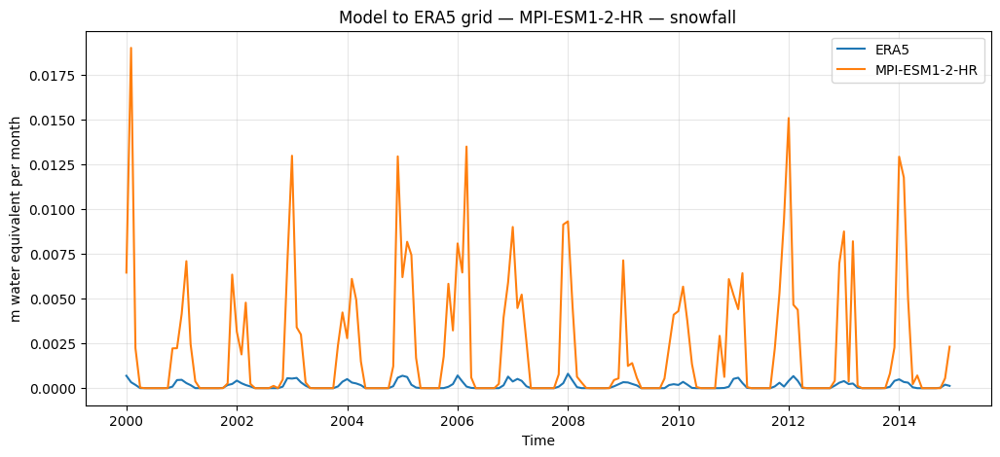

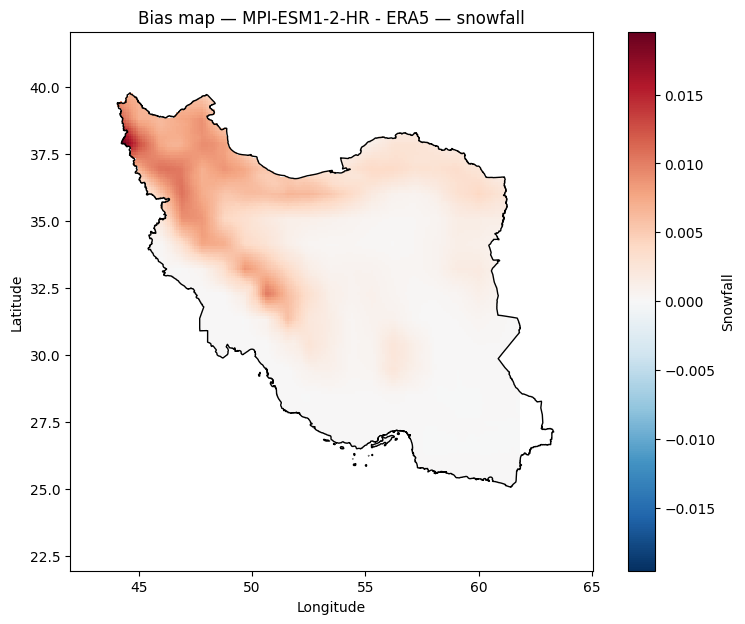

Metrics: {'n': 180, 'bias': 0.0021220157691028544, 'mae': 0.002123182823492611, 'rmse': 0.003991916417759391, 'corr': 0.7190945767290071, 'pbias': 1521.6749656776292}

METHOD: model_to_era5
MODEL: MPI-ESM1-2-HR
VARIABLE TYPE: surface_snow_amount
FILE: data\raw\MPI-ESM1-2-HR_Surface snow amount.nc
Model variable: snw
ERA5 variable: sd
Model original units: kg m-2
ERA5 units: m of water equivalent


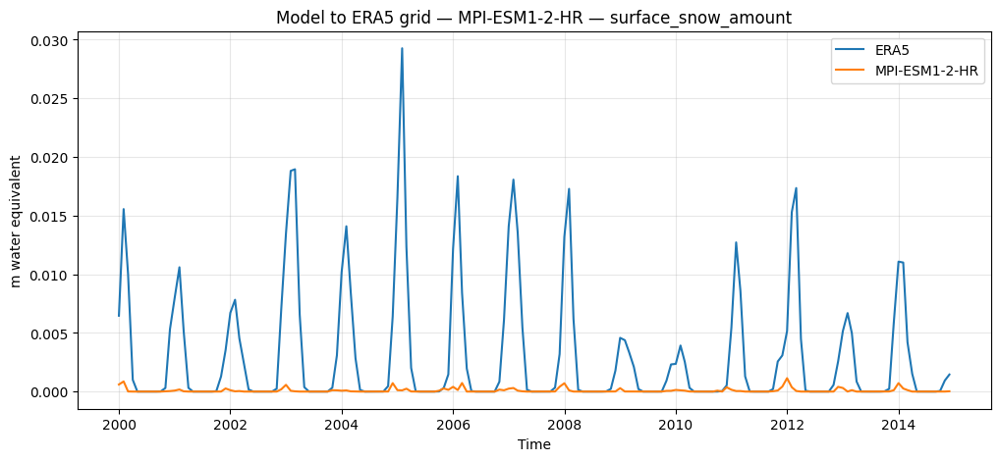

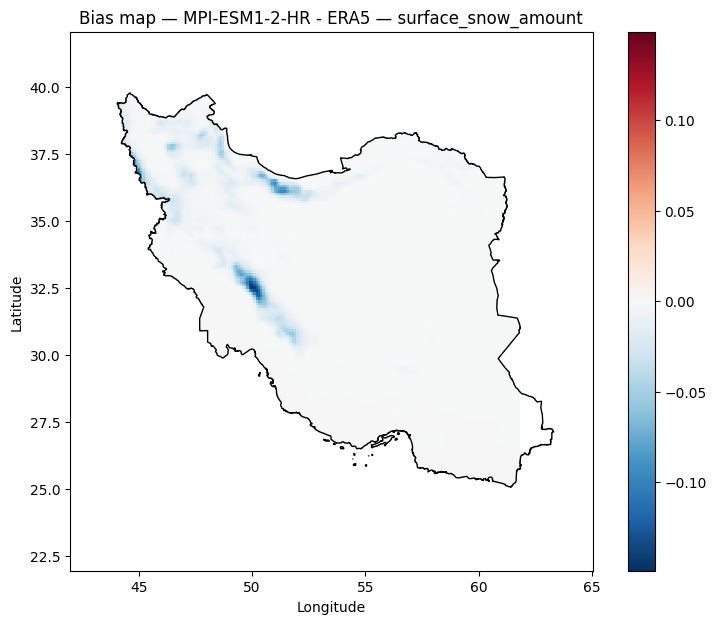

Metrics: {'n': 180, 'bias': -0.003060578183321227, 'mae': 0.0030621909815227387, 'rmse': 0.00599027445008389, 'corr': 0.45025134905142383, 'pbias': -97.45151256749921}

METHOD: model_to_era5
MODEL: MRI-ESM2-0
VARIABLE TYPE: snow_depth
FILE: data\raw\MRI-ESM2-0_Snow depth.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


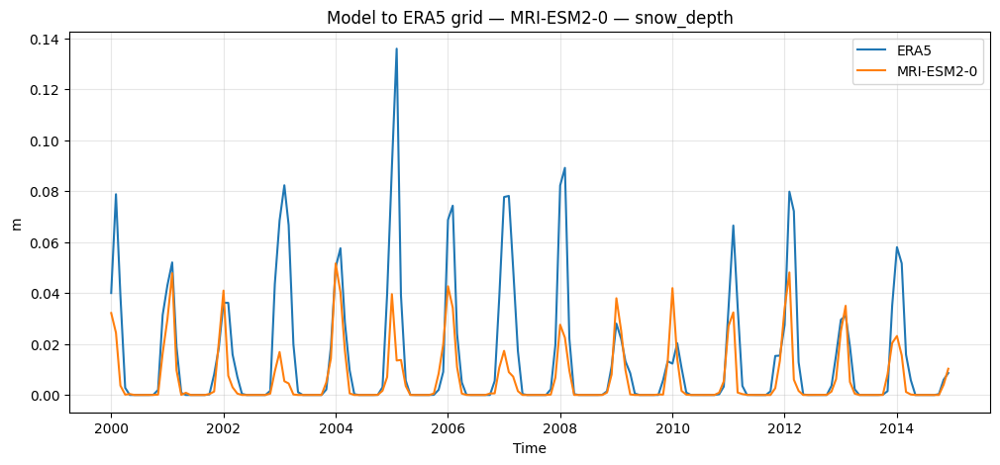

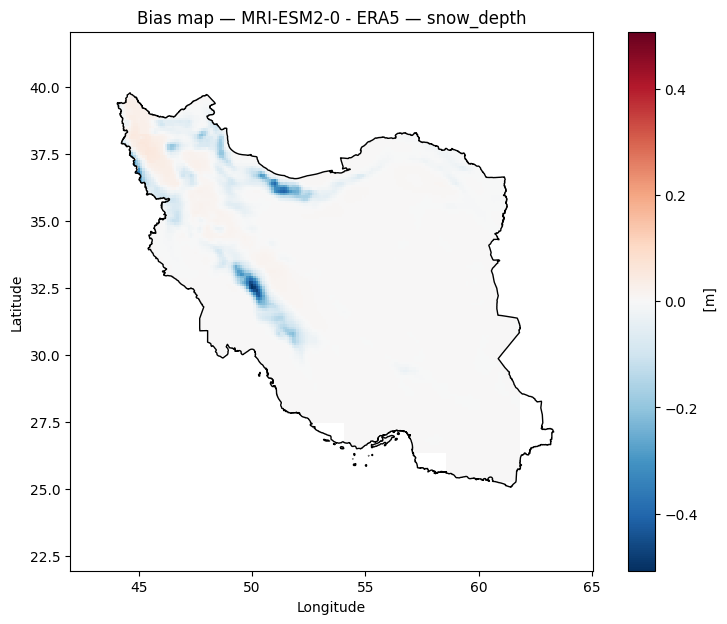

Metrics: {'n': 180, 'bias': -0.008131670350722115, 'mae': 0.009189301838417884, 'rmse': 0.02027081246920675, 'corr': 0.6912877102425241, 'pbias': -54.981465681779426}

METHOD: model_to_era5
MODEL: MRI-ESM2-0
VARIABLE TYPE: snowfall
FILE: data\raw\MRI-ESM2-0_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


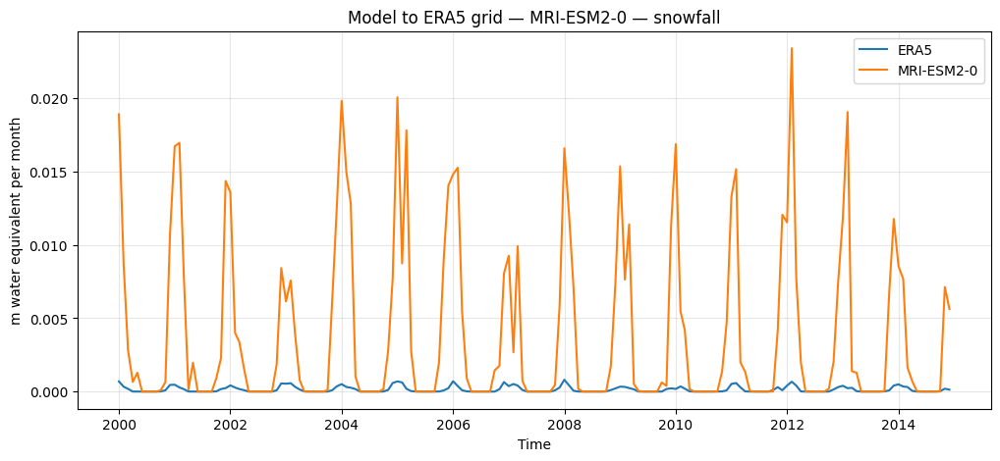

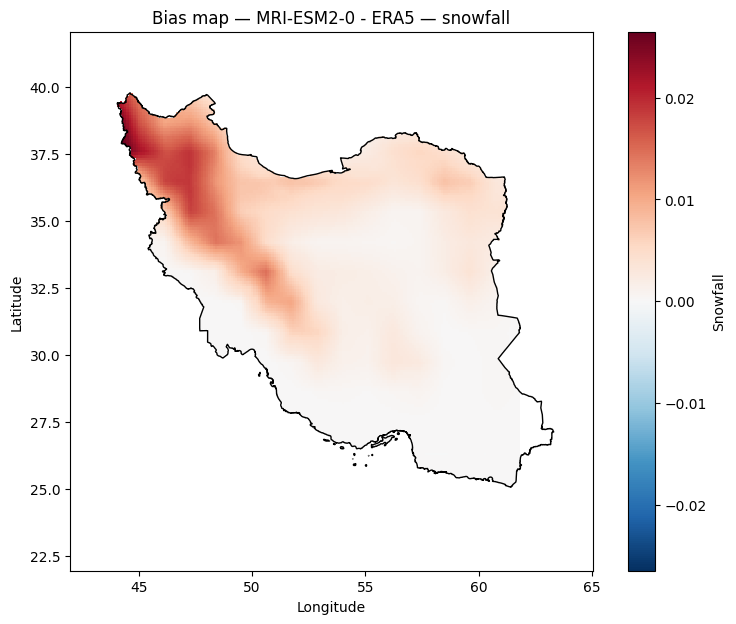

Metrics: {'n': 180, 'bias': 0.0037350191114657216, 'mae': 0.0037368282281027582, 'rmse': 0.006646737183426256, 'corr': 0.8048050140646876, 'pbias': 2678.3425254107638}

METHOD: model_to_era5
MODEL: MRI-ESM2-0
VARIABLE TYPE: surface_snow_amount
FILE: data\raw\MRI-ESM2-0_Surface snow amount.nc
Model variable: snw
ERA5 variable: sd
Model original units: kg m-2
ERA5 units: m of water equivalent


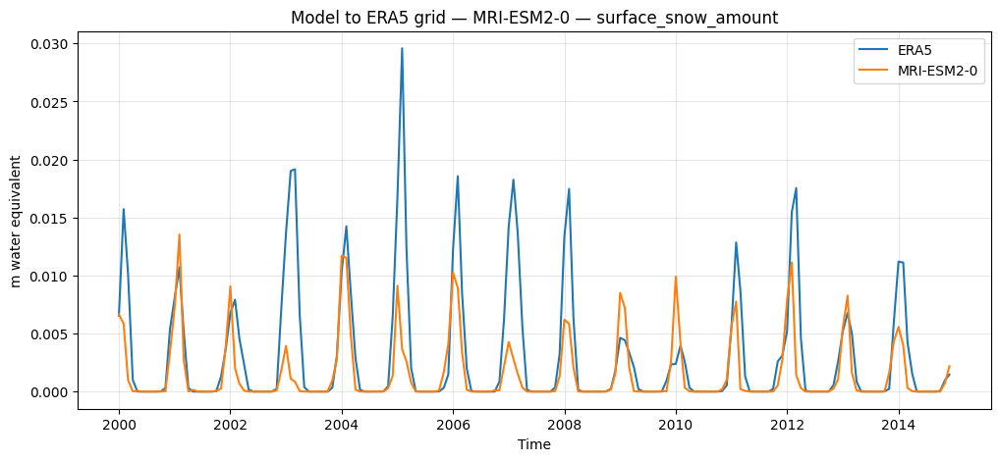

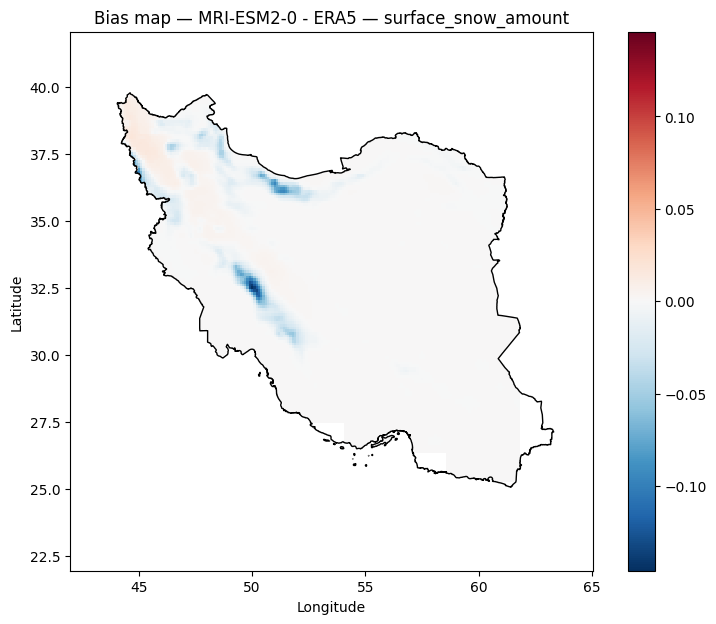

Metrics: {'n': 180, 'bias': -0.0016145330039134499, 'mae': 0.001990793695787778, 'rmse': 0.004388890156342018, 'corr': 0.6431757133751871, 'pbias': -50.8561160936381}

Saved:
data\processed\validation_model_to_era5_grid_2000_2014.csv
data\processed\timeseries_model_to_era5_grid_2000_2014.csv
           method              model        variable_type model_variable  \
0   model_to_era5      CanESM5-CanOE           snow_depth            snd   
1   model_to_era5      CanESM5-CanOE             snowfall           prsn   
2   model_to_era5      CNRM-CM6-1-HR             snowfall           prsn   
3   model_to_era5  EC-Earth3-AerChem           snow_depth            snd   
4   model_to_era5  EC-Earth3-AerChem             snowfall           prsn   
5   model_to_era5          GFDL-ESM4           snow_depth            snd   
6   model_to_era5          GFDL-ESM4             snowfall           prsn   
7   model_to_era5    HadGEM3-GC31-MM             snowfall           prsn   
8   model_to_era5      

In [19]:
# ============================================================
# CODE 1 — CMIP6 models to ERA5 grid + validation
# Method: model_to_era5
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"
iran_shp = RAW_DIR / "Iran" / "iran layer" / "IRAN.shp"

# -----------------------------
# Model files based on your inspection result
# -----------------------------
model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "CNRM-CM6-1-HR": {
        "snowfall": RAW_DIR / "CNRM-CM6-1-HR_Snowfall flux.nc",
    },
    "EC-Earth3-AerChem": {
        "snow_depth": RAW_DIR / "EC-Earth3-AerChem_Snow depth.nc",
        "snowfall": RAW_DIR / "EC-Earth3-AerChem_Snowfall flux.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    },
    "HadGEM3-GC31-MM": {
        "snowfall": RAW_DIR / "HadGEM3-GC31-MM_Snowfall flux.nc",
    },
    "MPI-ESM1-2-HR": {
        "snowfall": RAW_DIR / "MPI-ESM1-2-HR_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MPI-ESM1-2-HR_Surface snow amount.nc",
    },
    "MRI-ESM2-0": {
        "snow_depth": RAW_DIR / "MRI-ESM2-0_Snow depth.nc",
        "snowfall": RAW_DIR / "MRI-ESM2-0_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MRI-ESM2-0_Surface snow amount.nc",
    },
}

# -----------------------------
# Variable mapping
# -----------------------------
model_var_map = {
    "snow_depth": "snd",
    "surface_snow_amount": "snw",
    "snowfall": "prsn",
}

era5_var_map = {
    "snow_depth": "sde",
    "surface_snow_amount": "sd",
    "snowfall": "sf",
}

# -----------------------------
# Settings
# -----------------------------
start_year = 2000
end_year = 2014

# برای تست فصل برفی True کن
use_snow_season_only = False
snow_season_months = [11, 12, 1, 2, 3, 4]

# -----------------------------
# Load ERA5 and Iran
# -----------------------------
ds_era5 = xr.open_dataset(era5_final_file)

iran = gpd.read_file(iran_shp)
if iran.crs is None:
    iran = iran.set_crs("EPSG:4326")
else:
    iran = iran.to_crs("EPSG:4326")


# ============================================================
# Helper functions
# ============================================================

def standardize_model_dataset(ds):
    rename_dict = {}

    if "lat" in ds.coords or "lat" in ds.dims:
        rename_dict["lat"] = "latitude"
    if "lon" in ds.coords or "lon" in ds.dims:
        rename_dict["lon"] = "longitude"
    if "valid_time" in ds.coords or "valid_time" in ds.dims:
        rename_dict["valid_time"] = "time"

    if rename_dict:
        ds = ds.rename(rename_dict)

    if "longitude" in ds.coords and float(ds.longitude.max()) > 180:
        ds = ds.assign_coords(
            longitude=(((ds.longitude + 180) % 360) - 180)
        )

    ds = ds.sortby("latitude")
    ds = ds.sortby("longitude")

    return ds


def select_period(da, start_year=2000, end_year=2014):
    return da.where(
        (da.time.dt.year >= start_year) &
        (da.time.dt.year <= end_year),
        drop=True
    )


def assign_month_index(da):
    years = da.time.dt.year.values
    months = da.time.dt.month.values

    new_time = pd.to_datetime([
        f"{int(y):04d}-{int(m):02d}-01"
        for y, m in zip(years, months)
    ])

    return da.assign_coords(time=new_time)


def convert_model_units(da, variable_type):
    units_original = da.attrs.get("units", "")
    units = units_original.lower().replace(" ", "").replace("^", "**")

    out = da.copy()

    if variable_type == "snow_depth":
        out.attrs["units"] = "m"
        return out

    if variable_type == "surface_snow_amount":
        # snw: kg m-2 → m water equivalent
        if units in ["kgm-2", "kg/m2", "kgm**-2"]:
            out = out / 1000.0
        out.attrs["units"] = "m water equivalent"
        return out

    if variable_type == "snowfall":
        # prsn: kg m-2 s-1 → monthly m water equivalent
        if units in ["kgm-2s-1", "kg/m2/s", "kgm**-2s**-1"]:
            seconds_per_month = out.time.dt.days_in_month * 24 * 3600
            out = out * seconds_per_month / 1000.0
        out.attrs["units"] = "m water equivalent per month"
        return out


def create_mask_on_grid(lats, lons, country_gdf):
    lon2d, lat2d = np.meshgrid(lons, lats)

    points = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon2d.ravel(), lat2d.ravel())],
        crs="EPSG:4326"
    )

    country_polygon = country_gdf.geometry.union_all()
    mask_flat = points.within(country_polygon).values
    mask_2d = mask_flat.reshape(lat2d.shape)

    return xr.DataArray(
        mask_2d,
        coords={"latitude": lats, "longitude": lons},
        dims=("latitude", "longitude"),
        name="iran_mask"
    )


def area_weighted_mean(da, mask):
    weights = np.cos(np.deg2rad(da.latitude))
    weights.name = "weights"

    return da.where(mask).weighted(weights).mean(
        dim=("latitude", "longitude"),
        skipna=True
    )


def calculate_metrics(obs, sim):
    df = pd.DataFrame({
        "ERA5": obs.values,
        "Model": sim.values
    }).dropna()

    if len(df) < 3:
        return {
            "n": len(df),
            "bias": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "corr": np.nan,
            "pbias": np.nan
        }

    bias = (df["Model"] - df["ERA5"]).mean()
    mae = mean_absolute_error(df["ERA5"], df["Model"])
    rmse = np.sqrt(mean_squared_error(df["ERA5"], df["Model"]))

    if df["ERA5"].std() == 0 or df["Model"].std() == 0:
        corr = np.nan
    else:
        corr = pearsonr(df["ERA5"], df["Model"])[0]

    if df["ERA5"].sum() != 0:
        pbias = 100 * (df["Model"].sum() - df["ERA5"].sum()) / df["ERA5"].sum()
    else:
        pbias = np.nan

    return {
        "n": len(df),
        "bias": bias,
        "mae": mae,
        "rmse": rmse,
        "corr": corr,
        "pbias": pbias
    }


# -----------------------------
# ERA5 Iran mask
# -----------------------------
iran_mask_era5 = create_mask_on_grid(
    ds_era5.latitude.values,
    ds_era5.longitude.values,
    iran
)

# ============================================================
# Main loop
# ============================================================

results = []
timeseries_rows = []

for model_name, files in model_files.items():

    for variable_type, model_path in files.items():

        print("\n" + "=" * 100)
        print("METHOD: model_to_era5")
        print("MODEL:", model_name)
        print("VARIABLE TYPE:", variable_type)
        print("FILE:", model_path)

        ds_model = xr.open_dataset(model_path, decode_times=True)
        ds_model = standardize_model_dataset(ds_model)

        model_var = model_var_map[variable_type]
        era5_var = era5_var_map[variable_type]

        model_da = ds_model[model_var]
        era_da = ds_era5[era5_var]

        print("Model variable:", model_var)
        print("ERA5 variable:", era5_var)
        print("Model original units:", model_da.attrs.get("units", ""))
        print("ERA5 units:", era_da.attrs.get("units", ""))

        # Select period
        model_da = select_period(model_da, start_year, end_year)
        era_da = select_period(era_da, start_year, end_year)

        # Unit conversion before assigning standard time
        model_da = convert_model_units(model_da, variable_type)

        # Standard monthly time
        model_da = assign_month_index(model_da)
        era_da = assign_month_index(era_da)

        common_time = np.intersect1d(era_da.time.values, model_da.time.values)
        era_da = era_da.sel(time=common_time)
        model_da = model_da.sel(time=common_time)

        if use_snow_season_only:
            era_da = era_da.where(era_da.time.dt.month.isin(snow_season_months), drop=True)
            model_da = model_da.where(model_da.time.dt.month.isin(snow_season_months), drop=True)

        # Regrid model to ERA5
        model_on_era5 = model_da.interp(
            latitude=era_da.latitude,
            longitude=era_da.longitude,
            method="linear"
        )

        model_on_era5.name = f"{model_var}_on_era5_grid"

        regrid_file = OUT_DIR / f"{model_name}_{variable_type}_on_ERA5_grid_2000_2014.nc"
        model_on_era5.to_netcdf(
            regrid_file,
            encoding={model_on_era5.name: {"zlib": True, "complevel": 4, "dtype": "float32"}}
        )

        # Use valid model coverage inside Iran
        valid_space_mask = iran_mask_era5 & model_on_era5.notnull().any(dim="time")

        era_ts = area_weighted_mean(era_da, valid_space_mask)
        model_ts = area_weighted_mean(model_on_era5, valid_space_mask)

        metrics = calculate_metrics(era_ts, model_ts)

        results.append({
            "method": "model_to_era5",
            "model": model_name,
            "variable_type": variable_type,
            "model_variable": model_var,
            "era5_variable": era5_var,
            "model_units_final": model_da.attrs.get("units", ""),
            "era5_units": era_da.attrs.get("units", ""),
            "n_valid_grid_cells": int(valid_space_mask.sum().values),
            **metrics
        })

        df_ts = pd.DataFrame({
            "time": pd.to_datetime(era_ts.time.values),
            "ERA5": era_ts.values,
            "Model": model_ts.values,
            "model": model_name,
            "variable_type": variable_type,
            "method": "model_to_era5"
        })
        timeseries_rows.append(df_ts)

        # Plot time series
        fig, ax = plt.subplots(figsize=(12, 5))
        ax.plot(era_ts.time, era_ts, label="ERA5")
        ax.plot(model_ts.time, model_ts, label=model_name)
        ax.set_title(f"Model to ERA5 grid — {model_name} — {variable_type}")
        ax.set_xlabel("Time")
        ax.set_ylabel(model_da.attrs.get("units", ""))
        ax.grid(True, alpha=0.3)
        ax.legend()

        fig_path = FIG_DIR / f"model_to_era5_timeseries_{model_name}_{variable_type}.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        # Bias map
        bias_map = (model_on_era5 - era_da).where(valid_space_mask).mean(dim="time", skipna=True)

        fig, ax = plt.subplots(figsize=(9, 7))
        bias_map.plot(ax=ax)
        iran.boundary.plot(ax=ax, color="black", linewidth=1)
        ax.set_title(f"Bias map — {model_name} - ERA5 — {variable_type}")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

        fig_path = FIG_DIR / f"model_to_era5_bias_map_{model_name}_{variable_type}.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        print("Metrics:", metrics)

# -----------------------------
# Save results
# -----------------------------
results_df = pd.DataFrame(results)
results_csv = OUT_DIR / "validation_model_to_era5_grid_2000_2014.csv"
results_df.to_csv(results_csv, index=False)

ts_df = pd.concat(timeseries_rows, ignore_index=True)
ts_csv = OUT_DIR / "timeseries_model_to_era5_grid_2000_2014.csv"
ts_df.to_csv(ts_csv, index=False)

print("\nSaved:")
print(results_csv)
print(ts_csv)

print(results_df)


METHOD: era5_to_model
MODEL: CanESM5-CanOE
VARIABLE TYPE: snow_depth
FILE: data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


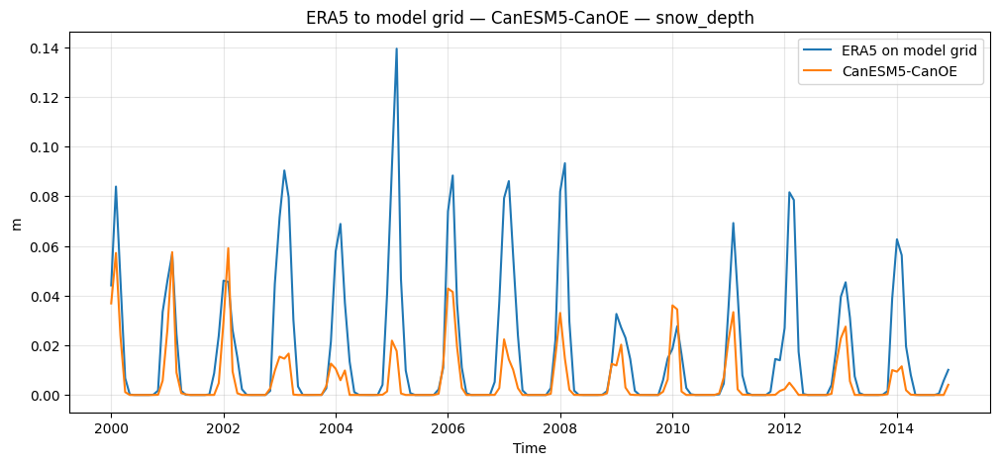

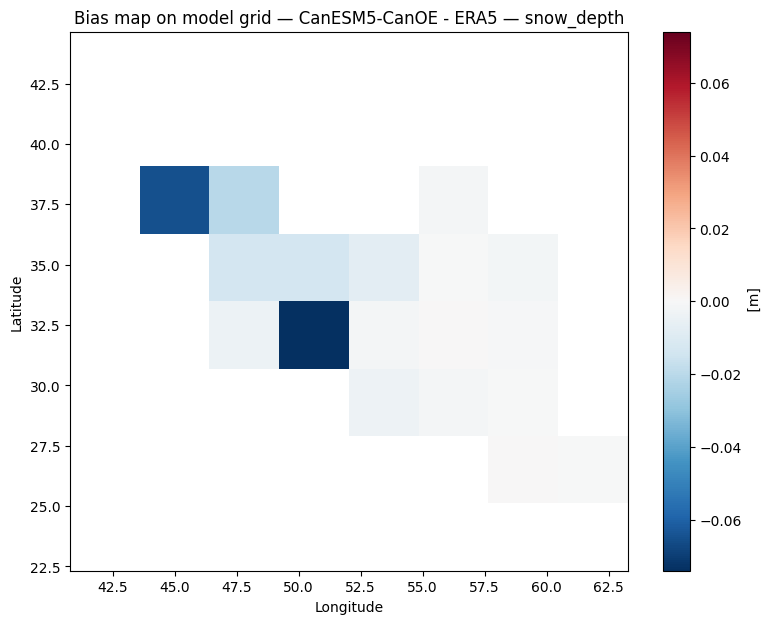

Metrics: {'n': 180, 'bias': -0.011366133673973187, 'mae': 0.011865728770441139, 'rmse': 0.02356804464302521, 'corr': 0.6794679631692323, 'pbias': -66.83848659104348}

METHOD: era5_to_model
MODEL: CanESM5-CanOE
VARIABLE TYPE: snowfall
FILE: data\raw\CanESM5-CanOE _Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


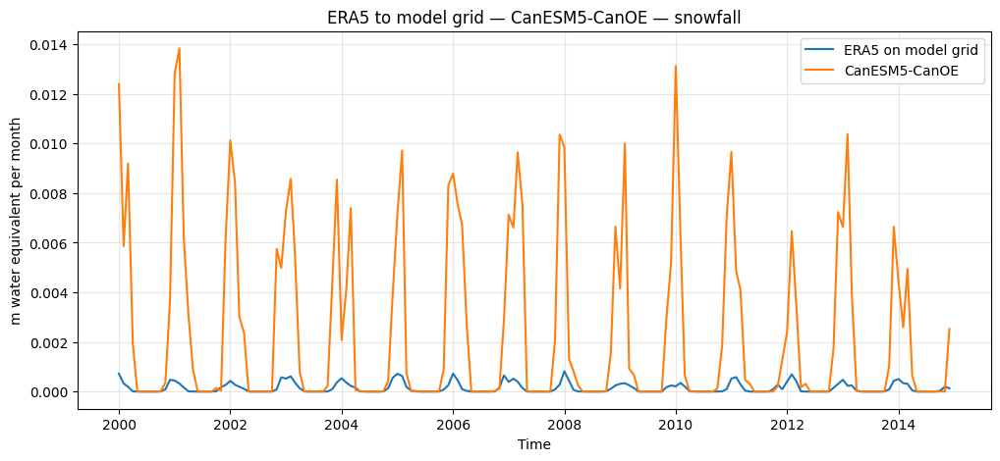

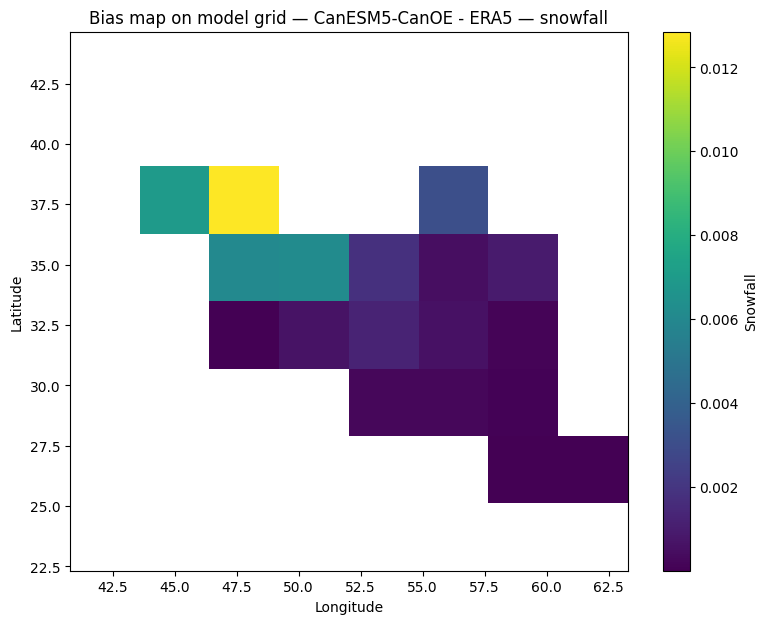

Metrics: {'n': 180, 'bias': 0.0022097266189732502, 'mae': 0.0022183539450846817, 'rmse': 0.003995163031322679, 'corr': 0.7575755054577672, 'pbias': 1531.1175743483661}

METHOD: era5_to_model
MODEL: CNRM-CM6-1-HR
VARIABLE TYPE: snowfall
FILE: data\raw\CNRM-CM6-1-HR_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


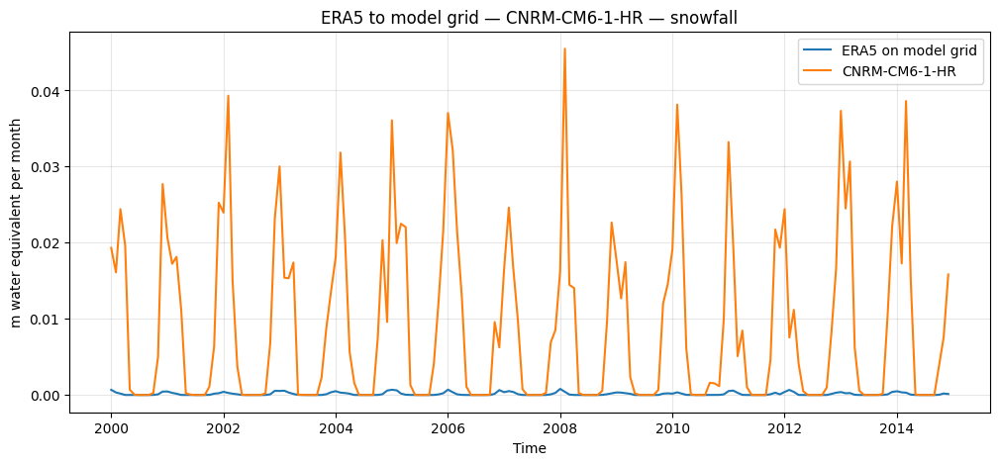

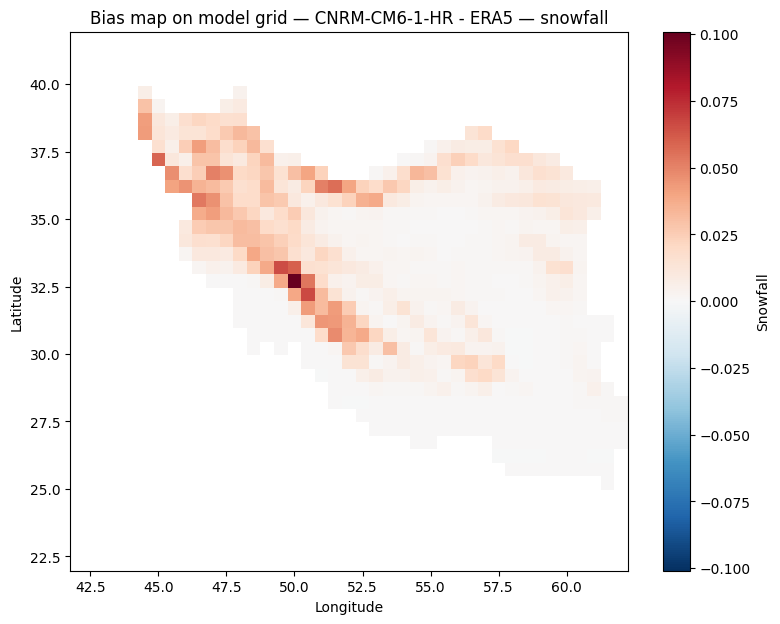

Metrics: {'n': 180, 'bias': 0.0089650386519974, 'mae': 0.008965053056855792, 'rmse': 0.014107829416965274, 'corr': 0.7363712657008656, 'pbias': 6535.816356195118}

METHOD: era5_to_model
MODEL: EC-Earth3-AerChem
VARIABLE TYPE: snow_depth
FILE: data\raw\EC-Earth3-AerChem_Snow depth.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


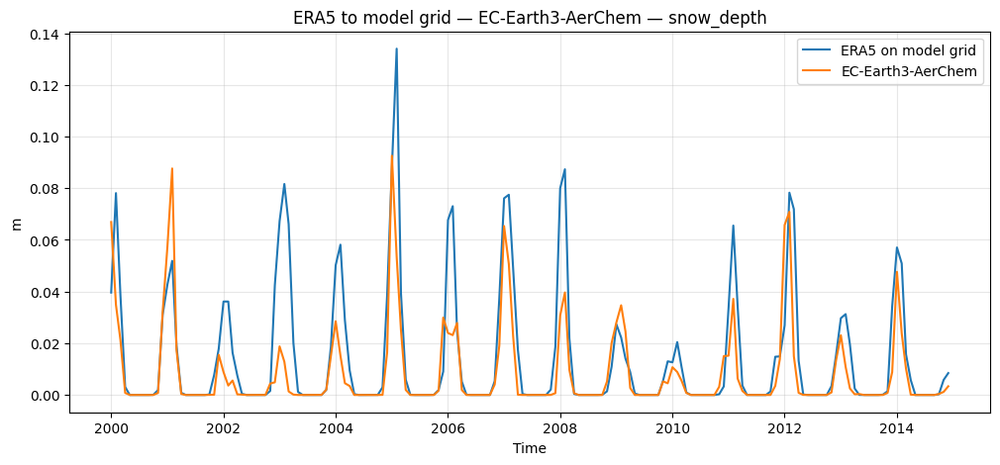

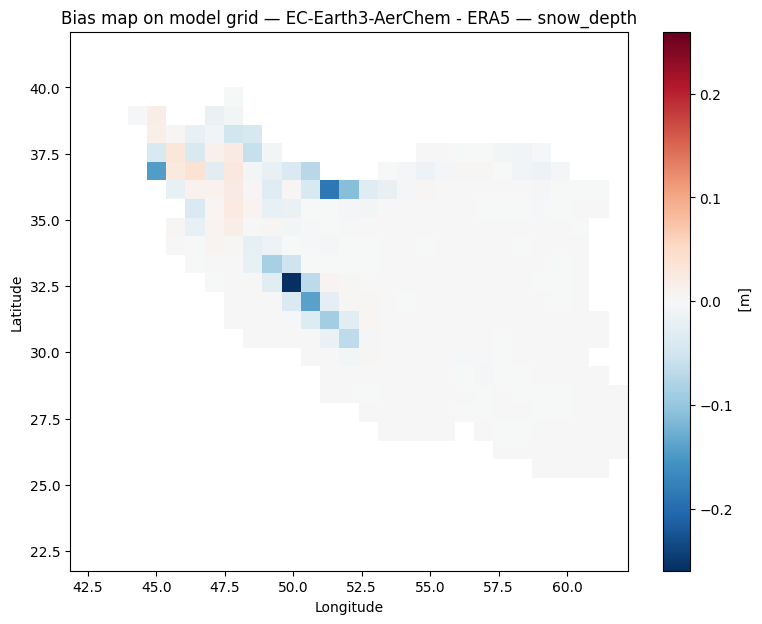

Metrics: {'n': 180, 'bias': -0.006008456412022607, 'mae': 0.008245818089216398, 'rmse': 0.0170128720207742, 'corr': 0.7593745980494555, 'pbias': -41.01644661760073}

METHOD: era5_to_model
MODEL: EC-Earth3-AerChem
VARIABLE TYPE: snowfall
FILE: data\raw\EC-Earth3-AerChem_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


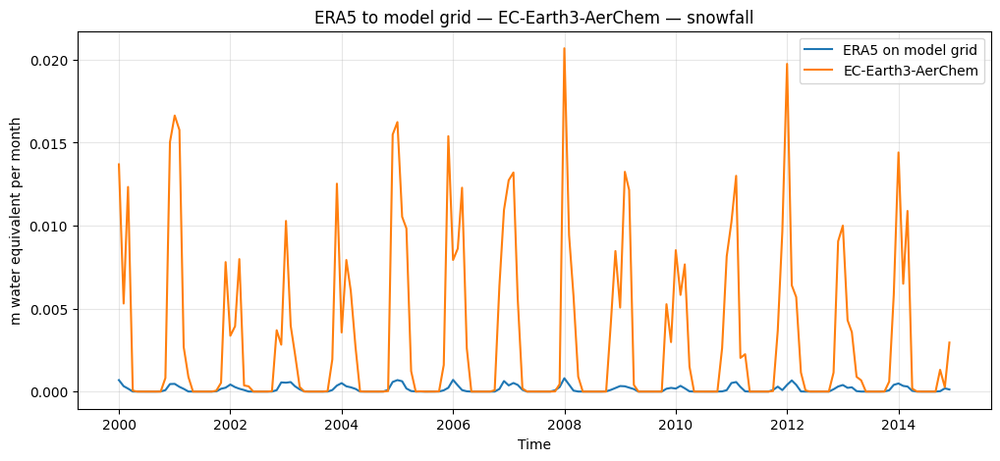

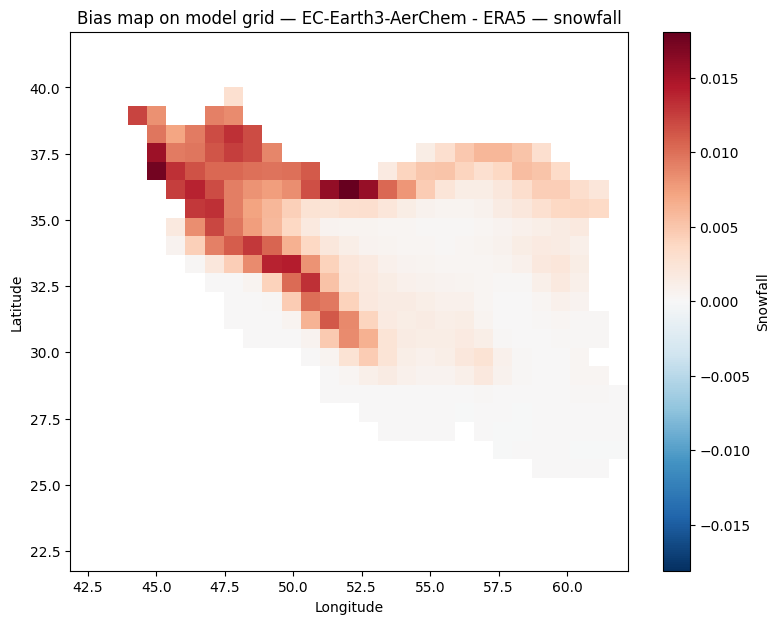

Metrics: {'n': 180, 'bias': 0.0031190171067146796, 'mae': 0.0031220075885706076, 'rmse': 0.005679080628867092, 'corr': 0.7957434854489548, 'pbias': 2259.7506278224287}

METHOD: era5_to_model
MODEL: GFDL-ESM4
VARIABLE TYPE: snow_depth
FILE: data\raw\GFDL-ESM4-Snow_Depth_Historical.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


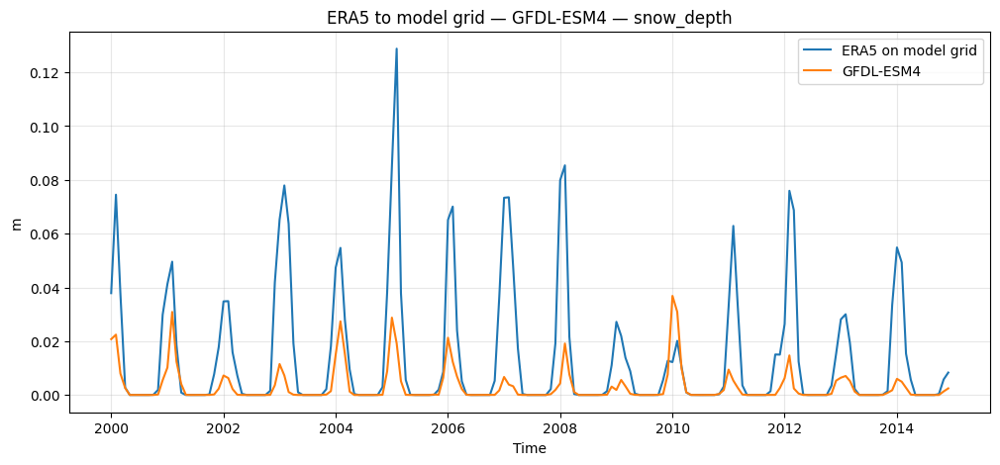

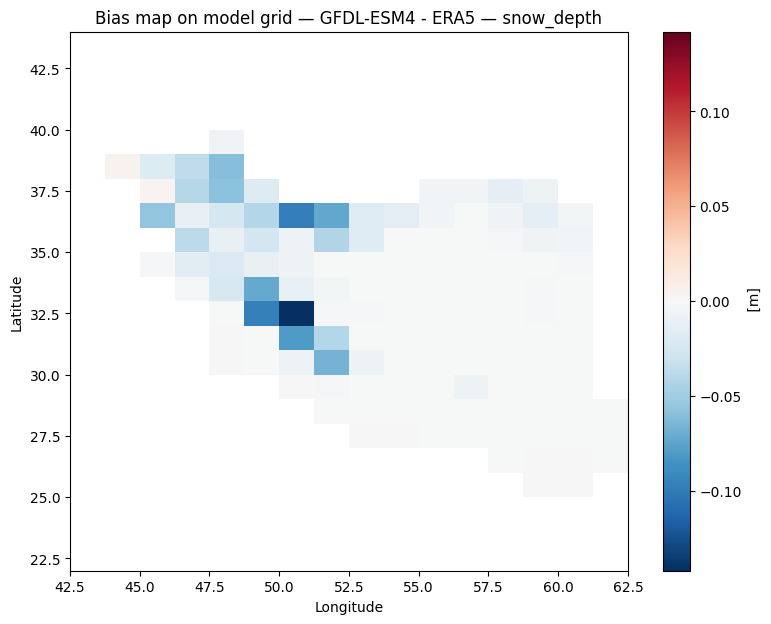

Metrics: {'n': 180, 'bias': -0.010987987714112675, 'mae': 0.011430912973635902, 'rmse': 0.022696651830449385, 'corr': 0.651102127095027, 'pbias': -77.48579720611185}

METHOD: era5_to_model
MODEL: GFDL-ESM4
VARIABLE TYPE: snowfall
FILE: data\raw\GFDL-ESM4-Snowfall_Historical.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


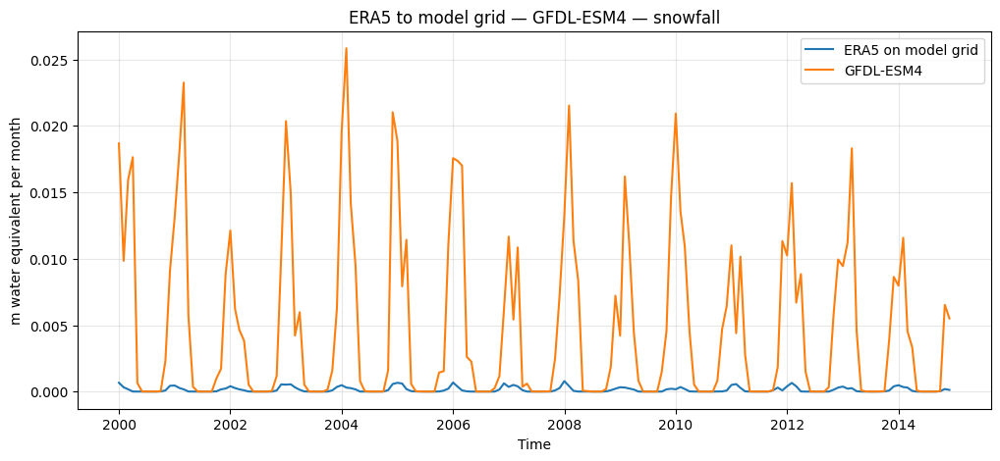

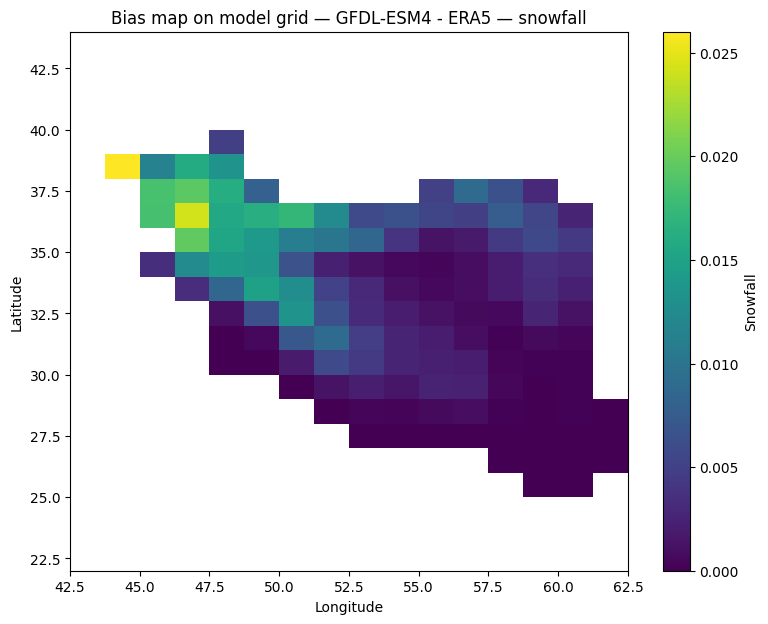

Metrics: {'n': 180, 'bias': 0.004688166028973, 'mae': 0.004688189071254123, 'rmse': 0.007773250343584436, 'corr': 0.7316416469936338, 'pbias': 3473.899157167651}

METHOD: era5_to_model
MODEL: HadGEM3-GC31-MM
VARIABLE TYPE: snowfall
FILE: data\raw\HadGEM3-GC31-MM_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


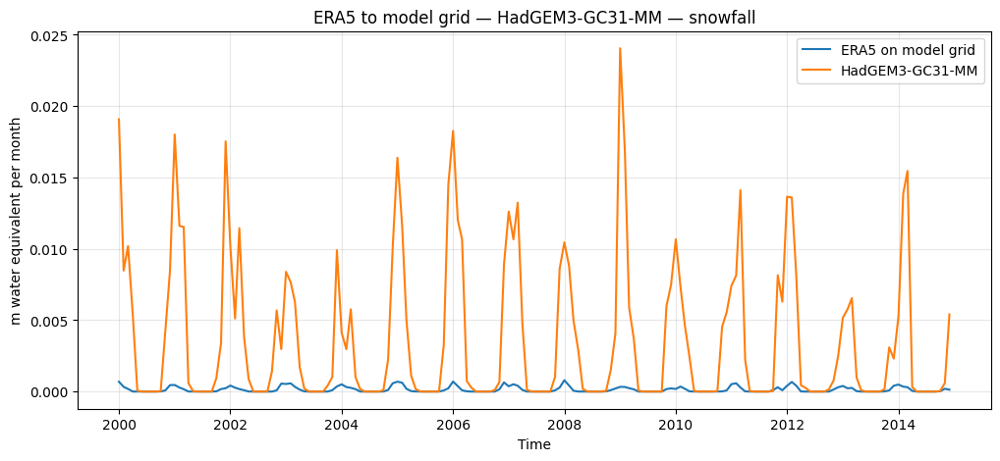

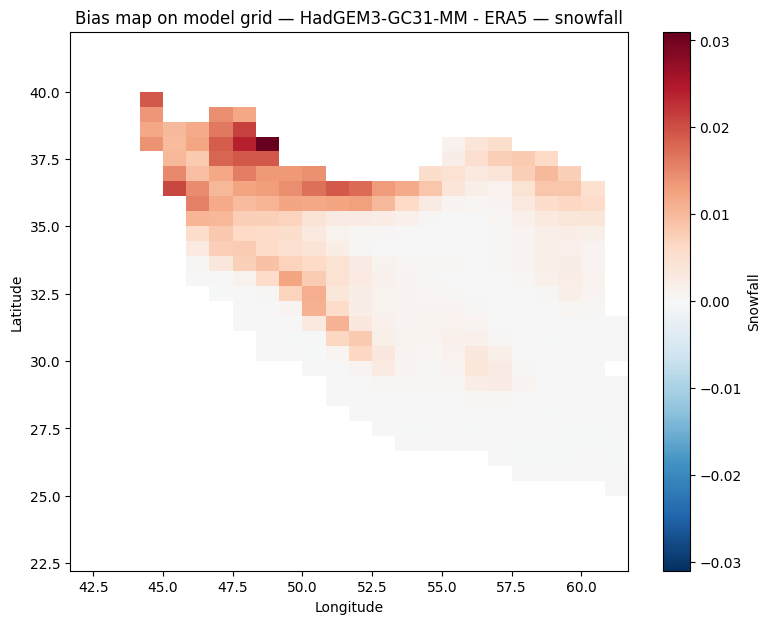

Metrics: {'n': 180, 'bias': 0.0035349483954542345, 'mae': 0.0035358146961935685, 'rmse': 0.006106534871093445, 'corr': 0.7835383991575542, 'pbias': 2534.944431143349}

METHOD: era5_to_model
MODEL: MPI-ESM1-2-HR
VARIABLE TYPE: snowfall
FILE: data\raw\MPI-ESM1-2-HR_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


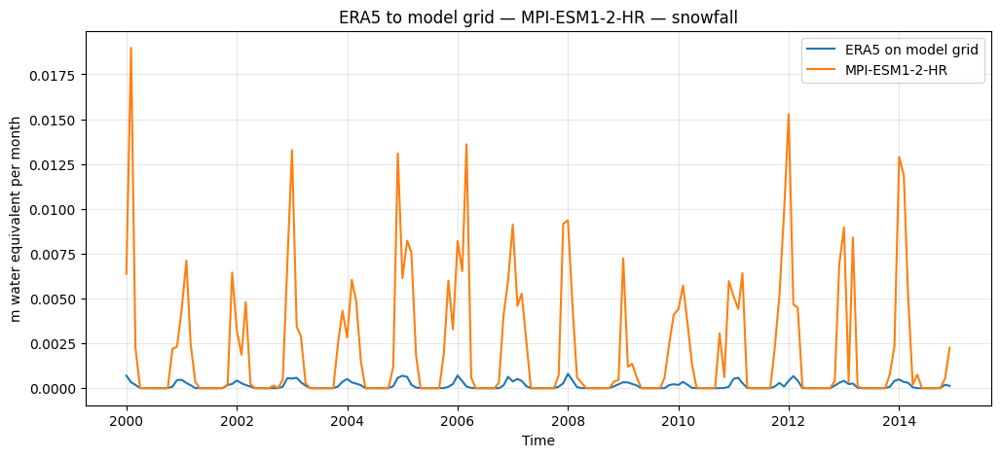

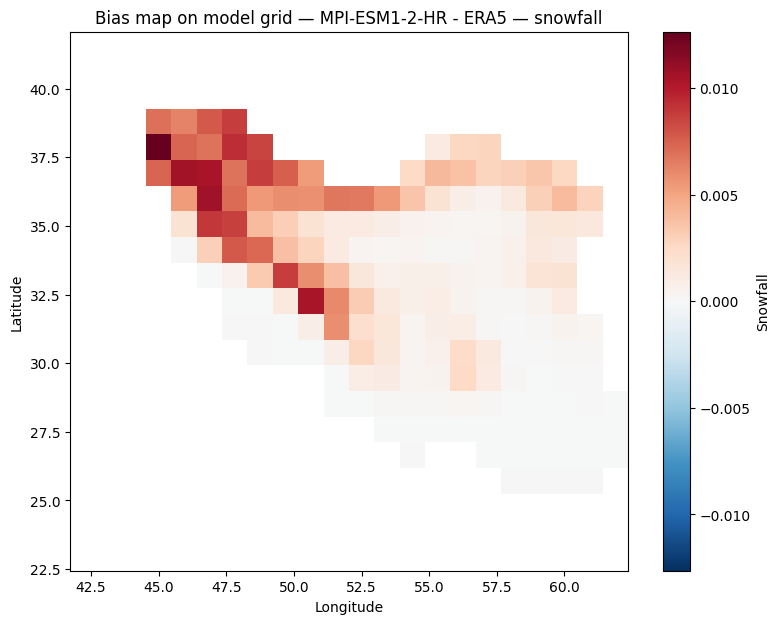

Metrics: {'n': 180, 'bias': 0.002140133411497885, 'mae': 0.0021412825755311627, 'rmse': 0.004029038027491558, 'corr': 0.7174510379712249, 'pbias': 1538.6953242207621}

METHOD: era5_to_model
MODEL: MPI-ESM1-2-HR
VARIABLE TYPE: surface_snow_amount
FILE: data\raw\MPI-ESM1-2-HR_Surface snow amount.nc
Model variable: snw
ERA5 variable: sd
Model original units: kg m-2
ERA5 units: m of water equivalent


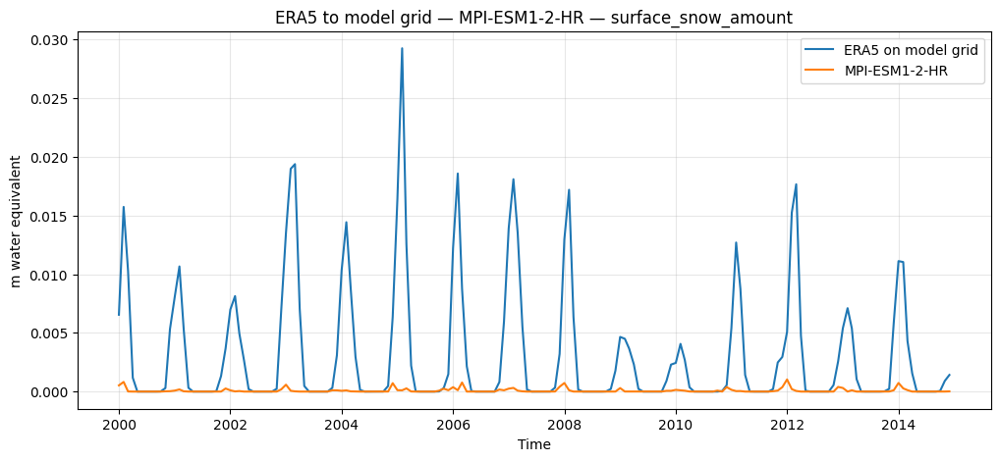

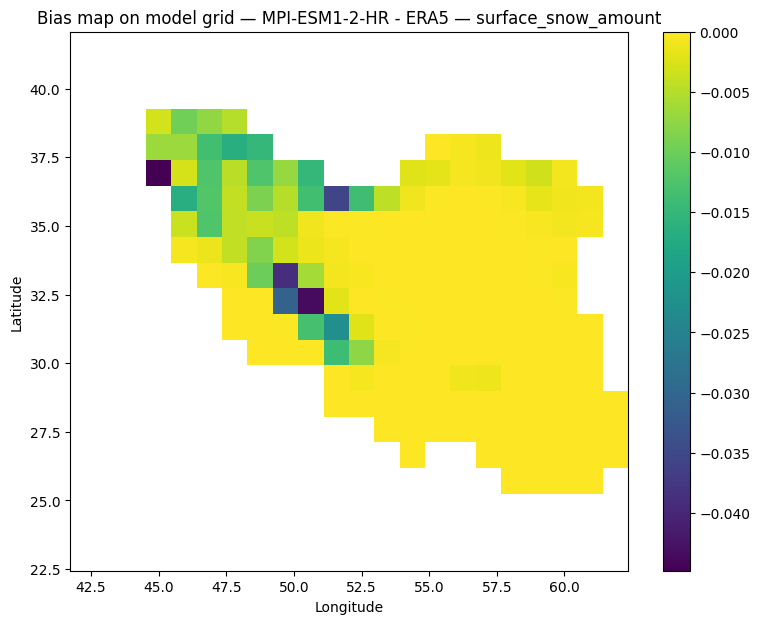

Metrics: {'n': 180, 'bias': -0.003108347569708629, 'mae': 0.00311003594973913, 'rmse': 0.006046647194405421, 'corr': 0.44716543020924715, 'pbias': -97.57170829181544}

METHOD: era5_to_model
MODEL: MRI-ESM2-0
VARIABLE TYPE: snow_depth
FILE: data\raw\MRI-ESM2-0_Snow depth.nc
Model variable: snd
ERA5 variable: sde
Model original units: m
ERA5 units: m


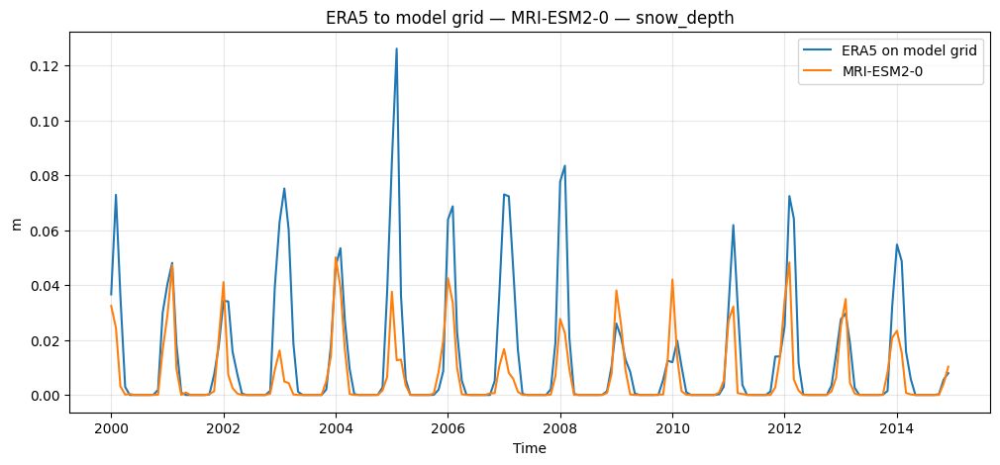

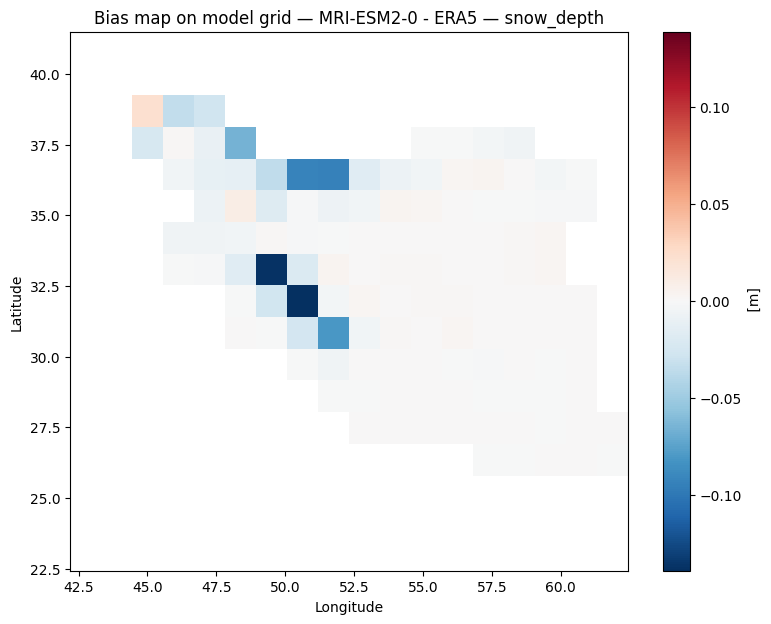

Metrics: {'n': 180, 'bias': -0.007282756881732744, 'mae': 0.00850685177152102, 'rmse': 0.018621658456649322, 'corr': 0.6855136476766938, 'pbias': -52.65847519417026}

METHOD: era5_to_model
MODEL: MRI-ESM2-0
VARIABLE TYPE: snowfall
FILE: data\raw\MRI-ESM2-0_Snowfall flux.nc
Model variable: prsn
ERA5 variable: sf
Model original units: kg m-2 s-1
ERA5 units: m of water equivalent


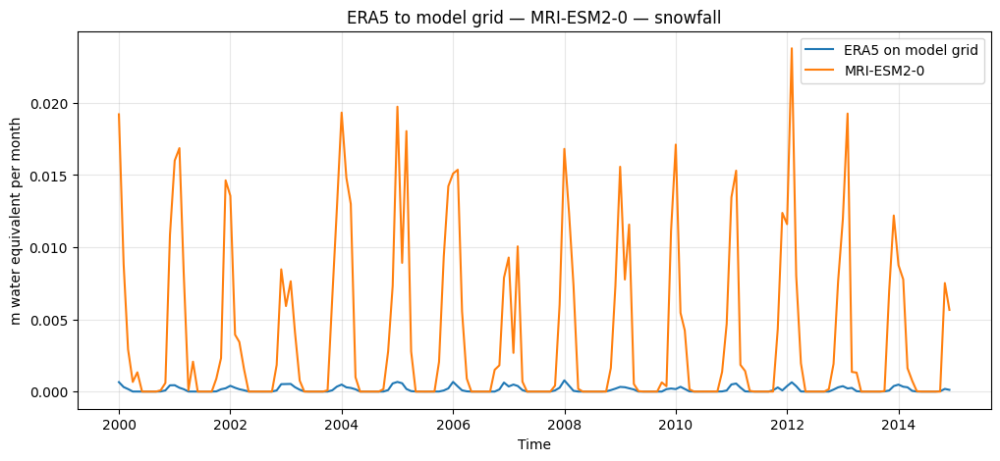

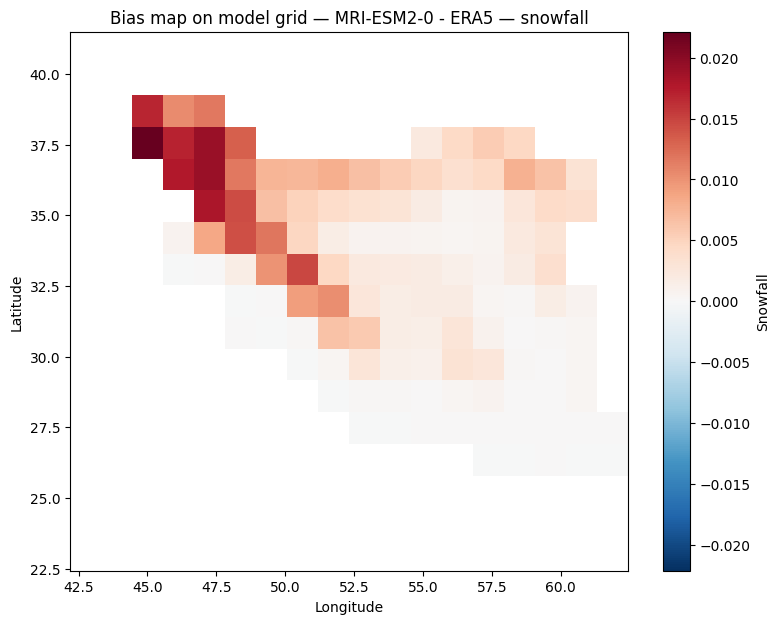

Metrics: {'n': 180, 'bias': 0.00376962119374128, 'mae': 0.003771336344961123, 'rmse': 0.006701047129996739, 'corr': 0.8031875382902949, 'pbias': 2847.847628662802}

METHOD: era5_to_model
MODEL: MRI-ESM2-0
VARIABLE TYPE: surface_snow_amount
FILE: data\raw\MRI-ESM2-0_Surface snow amount.nc
Model variable: snw
ERA5 variable: sd
Model original units: kg m-2
ERA5 units: m of water equivalent


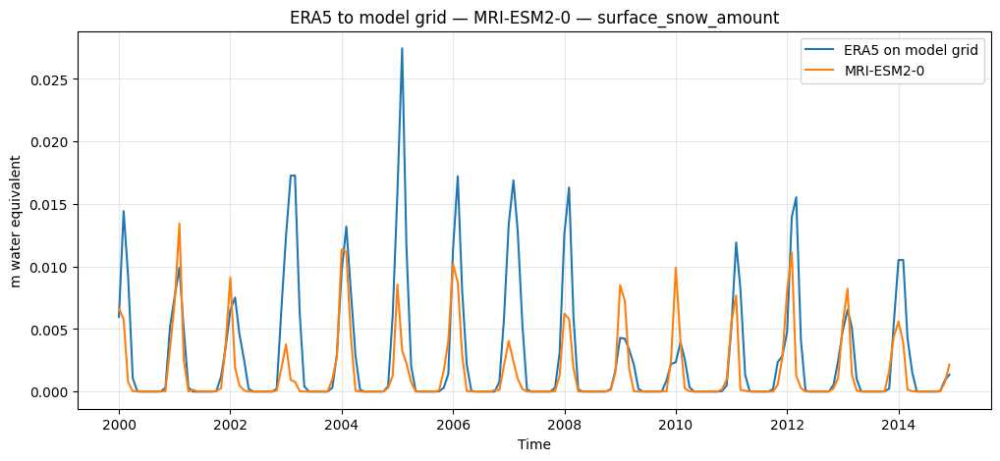

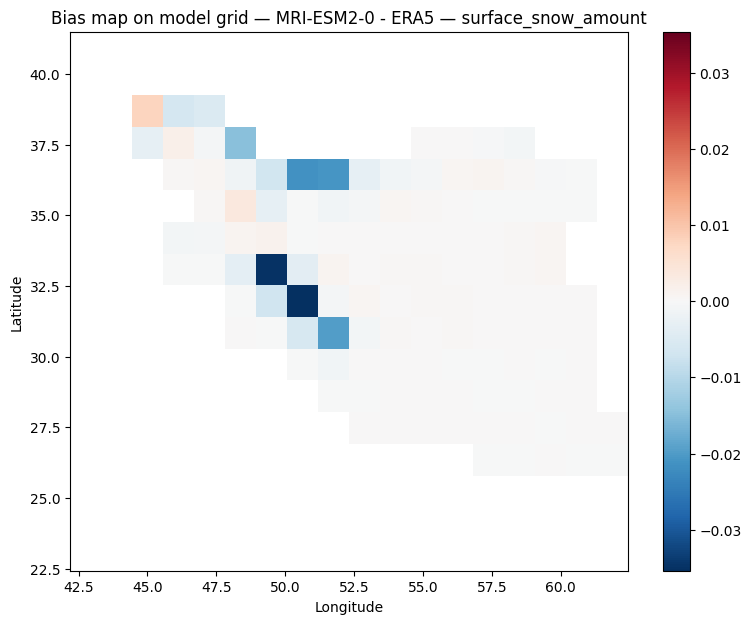

Metrics: {'n': 180, 'bias': -0.0014567000010684567, 'mae': 0.001879225045455858, 'rmse': 0.004069900677619706, 'corr': 0.6316021187631456, 'pbias': -48.952677471061186}

Saved:
data\processed\validation_era5_to_model_grid_2000_2014.csv
data\processed\timeseries_era5_to_model_grid_2000_2014.csv
           method              model        variable_type model_variable  \
0   era5_to_model      CanESM5-CanOE           snow_depth            snd   
1   era5_to_model      CanESM5-CanOE             snowfall           prsn   
2   era5_to_model      CNRM-CM6-1-HR             snowfall           prsn   
3   era5_to_model  EC-Earth3-AerChem           snow_depth            snd   
4   era5_to_model  EC-Earth3-AerChem             snowfall           prsn   
5   era5_to_model          GFDL-ESM4           snow_depth            snd   
6   era5_to_model          GFDL-ESM4             snowfall           prsn   
7   era5_to_model    HadGEM3-GC31-MM             snowfall           prsn   
8   era5_to_model    

In [20]:
# ============================================================
# CODE 2 — ERA5 to each CMIP6 model grid + validation
# Method: era5_to_model
# Uses model grid-cell bounds when possible
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr

# -----------------------------
# Paths
# -----------------------------
BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"
iran_shp = RAW_DIR / "Iran" / "iran layer" / "IRAN.shp"

# -----------------------------
# Model files
# -----------------------------
model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "CNRM-CM6-1-HR": {
        "snowfall": RAW_DIR / "CNRM-CM6-1-HR_Snowfall flux.nc",
    },
    "EC-Earth3-AerChem": {
        "snow_depth": RAW_DIR / "EC-Earth3-AerChem_Snow depth.nc",
        "snowfall": RAW_DIR / "EC-Earth3-AerChem_Snowfall flux.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    },
    "HadGEM3-GC31-MM": {
        "snowfall": RAW_DIR / "HadGEM3-GC31-MM_Snowfall flux.nc",
    },
    "MPI-ESM1-2-HR": {
        "snowfall": RAW_DIR / "MPI-ESM1-2-HR_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MPI-ESM1-2-HR_Surface snow amount.nc",
    },
    "MRI-ESM2-0": {
        "snow_depth": RAW_DIR / "MRI-ESM2-0_Snow depth.nc",
        "snowfall": RAW_DIR / "MRI-ESM2-0_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MRI-ESM2-0_Surface snow amount.nc",
    },
}

model_var_map = {
    "snow_depth": "snd",
    "surface_snow_amount": "snw",
    "snowfall": "prsn",
}

era5_var_map = {
    "snow_depth": "sde",
    "surface_snow_amount": "sd",
    "snowfall": "sf",
}

start_year = 2000
end_year = 2014

use_snow_season_only = False
snow_season_months = [11, 12, 1, 2, 3, 4]

# -----------------------------
# Load ERA5 and Iran
# -----------------------------
ds_era5 = xr.open_dataset(era5_final_file)

iran = gpd.read_file(iran_shp)
if iran.crs is None:
    iran = iran.set_crs("EPSG:4326")
else:
    iran = iran.to_crs("EPSG:4326")


# ============================================================
# Helper functions
# ============================================================

def standardize_model_dataset(ds):
    rename_dict = {}

    if "lat" in ds.coords or "lat" in ds.dims:
        rename_dict["lat"] = "latitude"
    if "lon" in ds.coords or "lon" in ds.dims:
        rename_dict["lon"] = "longitude"
    if "valid_time" in ds.coords or "valid_time" in ds.dims:
        rename_dict["valid_time"] = "time"

    if rename_dict:
        ds = ds.rename(rename_dict)

    if "longitude" in ds.coords and float(ds.longitude.max()) > 180:
        ds = ds.assign_coords(
            longitude=(((ds.longitude + 180) % 360) - 180)
        )

    ds = ds.sortby("latitude")
    ds = ds.sortby("longitude")

    return ds


def select_period(da, start_year=2000, end_year=2014):
    return da.where(
        (da.time.dt.year >= start_year) &
        (da.time.dt.year <= end_year),
        drop=True
    )


def assign_month_index(da):
    years = da.time.dt.year.values
    months = da.time.dt.month.values

    new_time = pd.to_datetime([
        f"{int(y):04d}-{int(m):02d}-01"
        for y, m in zip(years, months)
    ])

    return da.assign_coords(time=new_time)


def convert_model_units(da, variable_type):
    units_original = da.attrs.get("units", "")
    units = units_original.lower().replace(" ", "").replace("^", "**")

    out = da.copy()

    if variable_type == "snow_depth":
        out.attrs["units"] = "m"
        return out

    if variable_type == "surface_snow_amount":
        if units in ["kgm-2", "kg/m2", "kgm**-2"]:
            out = out / 1000.0
        out.attrs["units"] = "m water equivalent"
        return out

    if variable_type == "snowfall":
        if units in ["kgm-2s-1", "kg/m2/s", "kgm**-2s**-1"]:
            seconds_per_month = out.time.dt.days_in_month * 24 * 3600
            out = out * seconds_per_month / 1000.0
        out.attrs["units"] = "m water equivalent per month"
        return out


def create_mask_on_grid(lats, lons, country_gdf):
    lon2d, lat2d = np.meshgrid(lons, lats)

    points = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon2d.ravel(), lat2d.ravel())],
        crs="EPSG:4326"
    )

    country_polygon = country_gdf.geometry.union_all()
    mask_flat = points.within(country_polygon).values
    mask_2d = mask_flat.reshape(lat2d.shape)

    return xr.DataArray(
        mask_2d,
        coords={"latitude": lats, "longitude": lons},
        dims=("latitude", "longitude"),
        name="iran_mask"
    )


def area_weighted_mean(da, mask):
    weights = np.cos(np.deg2rad(da.latitude))
    weights.name = "weights"

    return da.where(mask).weighted(weights).mean(
        dim=("latitude", "longitude"),
        skipna=True
    )


def calculate_metrics(obs, sim):
    df = pd.DataFrame({
        "ERA5": obs.values,
        "Model": sim.values
    }).dropna()

    if len(df) < 3:
        return {
            "n": len(df),
            "bias": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "corr": np.nan,
            "pbias": np.nan
        }

    bias = (df["Model"] - df["ERA5"]).mean()
    mae = mean_absolute_error(df["ERA5"], df["Model"])
    rmse = np.sqrt(mean_squared_error(df["ERA5"], df["Model"]))

    if df["ERA5"].std() == 0 or df["Model"].std() == 0:
        corr = np.nan
    else:
        corr = pearsonr(df["ERA5"], df["Model"])[0]

    if df["ERA5"].sum() != 0:
        pbias = 100 * (df["Model"].sum() - df["ERA5"].sum()) / df["ERA5"].sum()
    else:
        pbias = np.nan

    return {
        "n": len(df),
        "bias": bias,
        "mae": mae,
        "rmse": rmse,
        "corr": corr,
        "pbias": pbias
    }


def get_bounds_from_centers(values):
    values = np.asarray(values)
    values = np.sort(values)

    mid = (values[:-1] + values[1:]) / 2

    first = values[0] - (mid[0] - values[0])
    last = values[-1] + (values[-1] - mid[-1])

    bounds = np.zeros((len(values), 2))
    bounds[0, 0] = first
    bounds[0, 1] = mid[0]

    for i in range(1, len(values) - 1):
        bounds[i, 0] = mid[i - 1]
        bounds[i, 1] = mid[i]

    bounds[-1, 0] = mid[-1]
    bounds[-1, 1] = last

    return bounds


def get_model_bounds(ds_model):
    """
    Handles:
    lat_bnds(lat,bnds)
    lat_bnds(time,lat,bnds)
    lon_bnds(lon,bnds)
    lon_bnds(time,lon,bnds)
    """

    if "lat_bnds" in ds_model:
        lat_bnds = ds_model["lat_bnds"]
        if "time" in lat_bnds.dims:
            lat_bnds = lat_bnds.isel(time=0)
        lat_bnds = lat_bnds.values
    else:
        lat_bnds = get_bounds_from_centers(ds_model.latitude.values)

    if "lon_bnds" in ds_model:
        lon_bnds = ds_model["lon_bnds"]
        if "time" in lon_bnds.dims:
            lon_bnds = lon_bnds.isel(time=0)
        lon_bnds = lon_bnds.values
    else:
        lon_bnds = get_bounds_from_centers(ds_model.longitude.values)

    return lat_bnds, lon_bnds


def aggregate_era5_to_model_grid(era_da, ds_model):
    """
    Area-weighted aggregation of ERA5 to model grid using model cell bounds.
    """

    model_lats = ds_model.latitude.values
    model_lons = ds_model.longitude.values

    lat_bnds, lon_bnds = get_model_bounds(ds_model)

    out = np.full(
        (era_da.sizes["time"], len(model_lats), len(model_lons)),
        np.nan,
        dtype=np.float32
    )

    for i in range(len(model_lats)):

        lat_min = np.nanmin(lat_bnds[i])
        lat_max = np.nanmax(lat_bnds[i])

        lat_mask = (era_da.latitude >= lat_min) & (era_da.latitude <= lat_max)

        for j in range(len(model_lons)):

            lon_min = np.nanmin(lon_bnds[j])
            lon_max = np.nanmax(lon_bnds[j])

            lon_mask = (era_da.longitude >= lon_min) & (era_da.longitude <= lon_max)

            subset = era_da.where(lat_mask & lon_mask, drop=True)

            if subset.sizes.get("latitude", 0) == 0 or subset.sizes.get("longitude", 0) == 0:
                continue

            weights = np.cos(np.deg2rad(subset.latitude))
            weights.name = "weights"

            cell_mean = subset.weighted(weights).mean(
                dim=("latitude", "longitude"),
                skipna=True
            )

            out[:, i, j] = cell_mean.values.astype(np.float32)

    out_da = xr.DataArray(
        out,
        coords={
            "time": era_da.time,
            "latitude": model_lats,
            "longitude": model_lons
        },
        dims=("time", "latitude", "longitude"),
        name=era_da.name
    )

    out_da.attrs.update(era_da.attrs)
    out_da.attrs["regridding_method"] = "ERA5 aggregated to model grid using model cell bounds"

    return out_da


# ============================================================
# Main loop
# ============================================================

results = []
timeseries_rows = []

for model_name, files in model_files.items():

    for variable_type, model_path in files.items():

        print("\n" + "=" * 100)
        print("METHOD: era5_to_model")
        print("MODEL:", model_name)
        print("VARIABLE TYPE:", variable_type)
        print("FILE:", model_path)

        ds_model = xr.open_dataset(model_path, decode_times=True)
        ds_model = standardize_model_dataset(ds_model)

        model_var = model_var_map[variable_type]
        era5_var = era5_var_map[variable_type]

        model_da = ds_model[model_var]
        era_da = ds_era5[era5_var]

        print("Model variable:", model_var)
        print("ERA5 variable:", era5_var)
        print("Model original units:", model_da.attrs.get("units", ""))
        print("ERA5 units:", era_da.attrs.get("units", ""))

        # Select period
        model_da = select_period(model_da, start_year, end_year)
        era_da = select_period(era_da, start_year, end_year)

        # Convert model units
        model_da = convert_model_units(model_da, variable_type)

        # Standard monthly time
        model_da = assign_month_index(model_da)
        era_da = assign_month_index(era_da)

        common_time = np.intersect1d(era_da.time.values, model_da.time.values)
        era_da = era_da.sel(time=common_time)
        model_da = model_da.sel(time=common_time)

        if use_snow_season_only:
            era_da = era_da.where(era_da.time.dt.month.isin(snow_season_months), drop=True)
            model_da = model_da.where(model_da.time.dt.month.isin(snow_season_months), drop=True)

        # ERA5 to model grid by aggregation
        era_on_model = aggregate_era5_to_model_grid(era_da, ds_model)
        era_on_model.name = f"{era5_var}_on_{model_name}_grid"

        era_regrid_file = OUT_DIR / f"ERA5_{variable_type}_on_{model_name}_grid_2000_2014.nc"
        era_on_model.to_netcdf(
            era_regrid_file,
            encoding={era_on_model.name: {"zlib": True, "complevel": 4, "dtype": "float32"}}
        )

        # Iran mask on model grid
        iran_mask_model = create_mask_on_grid(
            model_da.latitude.values,
            model_da.longitude.values,
            iran
        )

        mask_file = OUT_DIR / f"iran_mask_on_{model_name}_grid.nc"
        iran_mask_model.to_netcdf(mask_file)

        valid_space_mask = iran_mask_model & era_on_model.notnull().any(dim="time") & model_da.notnull().any(dim="time")

        era_ts = area_weighted_mean(era_on_model, valid_space_mask)
        model_ts = area_weighted_mean(model_da, valid_space_mask)

        metrics = calculate_metrics(era_ts, model_ts)

        results.append({
            "method": "era5_to_model",
            "model": model_name,
            "variable_type": variable_type,
            "model_variable": model_var,
            "era5_variable": era5_var,
            "model_units_final": model_da.attrs.get("units", ""),
            "era5_units": era_da.attrs.get("units", ""),
            "n_valid_grid_cells": int(valid_space_mask.sum().values),
            **metrics
        })

        df_ts = pd.DataFrame({
            "time": pd.to_datetime(era_ts.time.values),
            "ERA5": era_ts.values,
            "Model": model_ts.values,
            "model": model_name,
            "variable_type": variable_type,
            "method": "era5_to_model"
        })
        timeseries_rows.append(df_ts)

        # Plot time series
        fig, ax = plt.subplots(figsize=(12, 5))
        ax.plot(era_ts.time, era_ts, label="ERA5 on model grid")
        ax.plot(model_ts.time, model_ts, label=model_name)
        ax.set_title(f"ERA5 to model grid — {model_name} — {variable_type}")
        ax.set_xlabel("Time")
        ax.set_ylabel(model_da.attrs.get("units", ""))
        ax.grid(True, alpha=0.3)
        ax.legend()

        fig_path = FIG_DIR / f"era5_to_model_timeseries_{model_name}_{variable_type}.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        # Bias map on model grid
        bias_map = (model_da - era_on_model).where(valid_space_mask).mean(dim="time", skipna=True)

        fig, ax = plt.subplots(figsize=(9, 7))
        bias_map.plot(ax=ax)
        ax.set_title(f"Bias map on model grid — {model_name} - ERA5 — {variable_type}")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

        fig_path = FIG_DIR / f"era5_to_model_bias_map_{model_name}_{variable_type}.png"
        plt.savefig(fig_path, dpi=300, bbox_inches="tight")
        plt.show()

        print("Metrics:", metrics)

# -----------------------------
# Save outputs
# -----------------------------
results_df = pd.DataFrame(results)
results_csv = OUT_DIR / "validation_era5_to_model_grid_2000_2014.csv"
results_df.to_csv(results_csv, index=False)

ts_df = pd.concat(timeseries_rows, ignore_index=True)
ts_csv = OUT_DIR / "timeseries_era5_to_model_grid_2000_2014.csv"
ts_df.to_csv(ts_csv, index=False)

print("\nSaved:")
print(results_csv)
print(ts_csv)

print(results_df)

All results:
           method              model        variable_type model_variable  \
0   model_to_era5      CanESM5-CanOE           snow_depth            snd   
1   model_to_era5      CanESM5-CanOE             snowfall           prsn   
2   model_to_era5      CNRM-CM6-1-HR             snowfall           prsn   
3   model_to_era5  EC-Earth3-AerChem           snow_depth            snd   
4   model_to_era5  EC-Earth3-AerChem             snowfall           prsn   
5   model_to_era5          GFDL-ESM4           snow_depth            snd   
6   model_to_era5          GFDL-ESM4             snowfall           prsn   
7   model_to_era5    HadGEM3-GC31-MM             snowfall           prsn   
8   model_to_era5      MPI-ESM1-2-HR             snowfall           prsn   
9   model_to_era5      MPI-ESM1-2-HR  surface_snow_amount            snw   
10  model_to_era5         MRI-ESM2-0           snow_depth            snd   
11  model_to_era5         MRI-ESM2-0             snowfall           prsn   

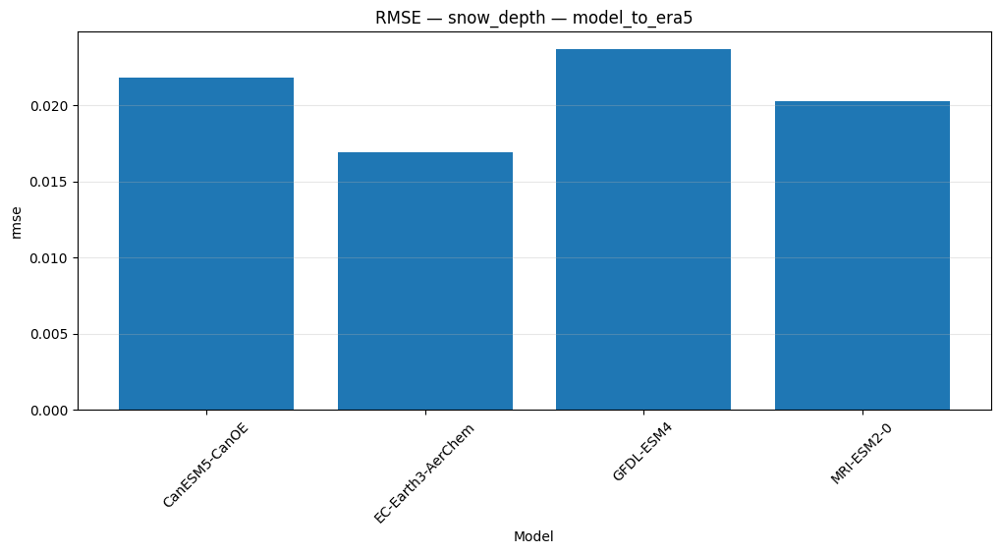

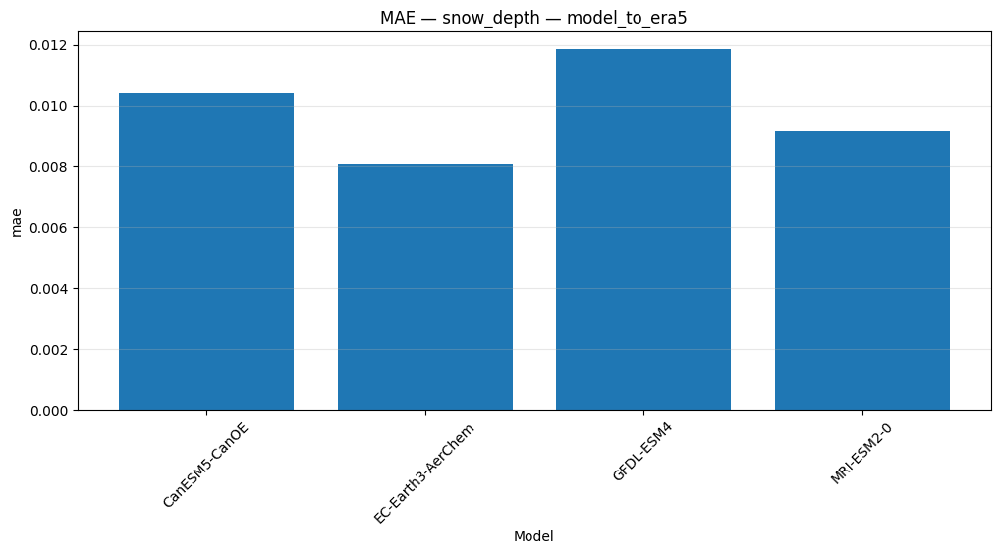

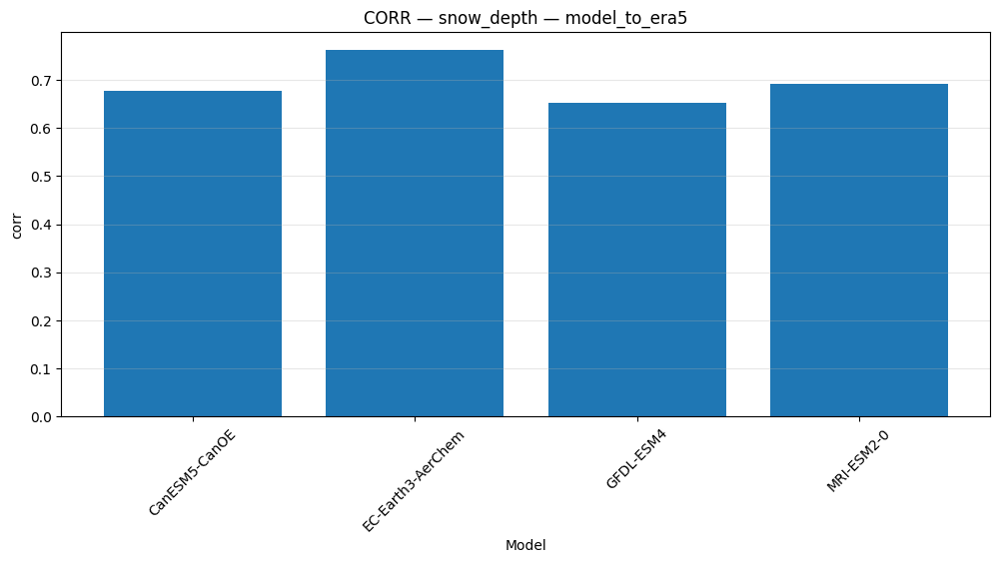

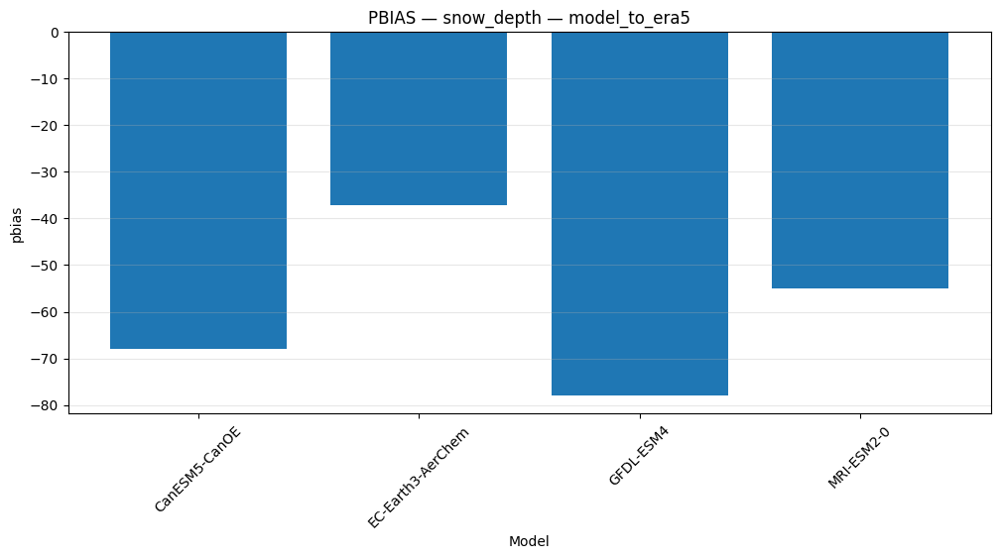

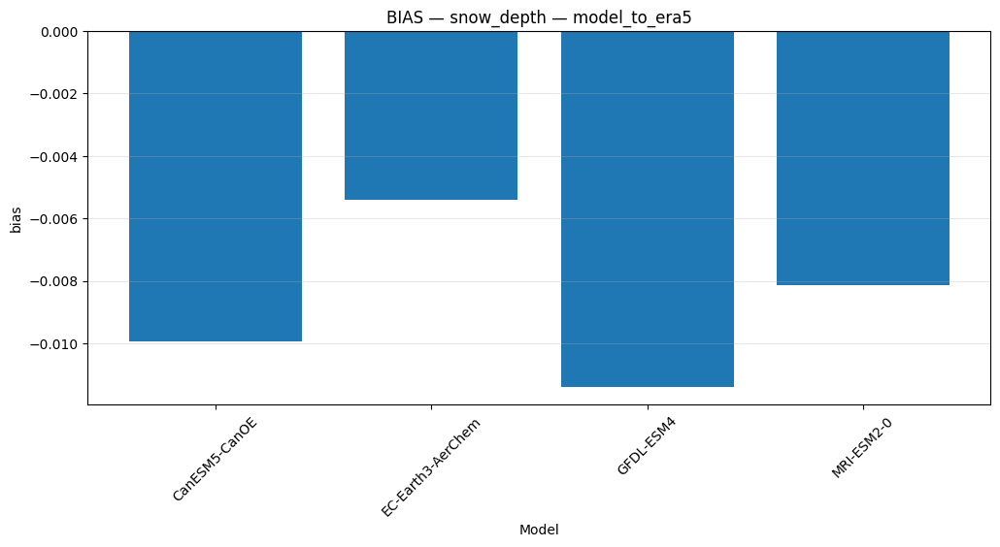

...

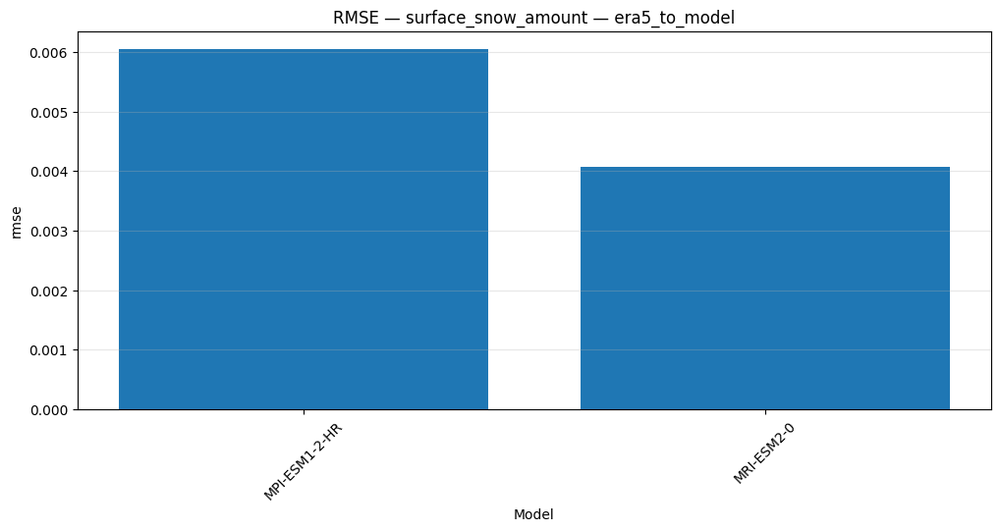

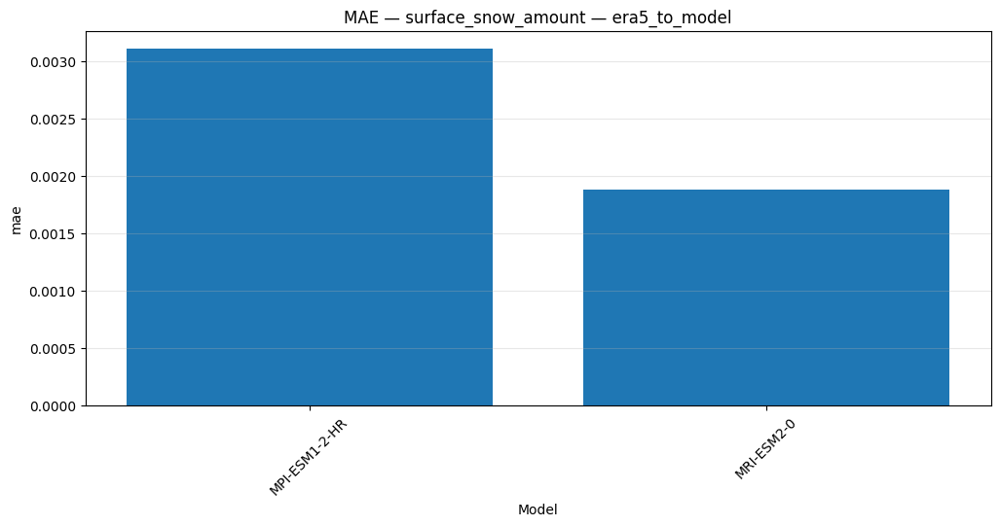

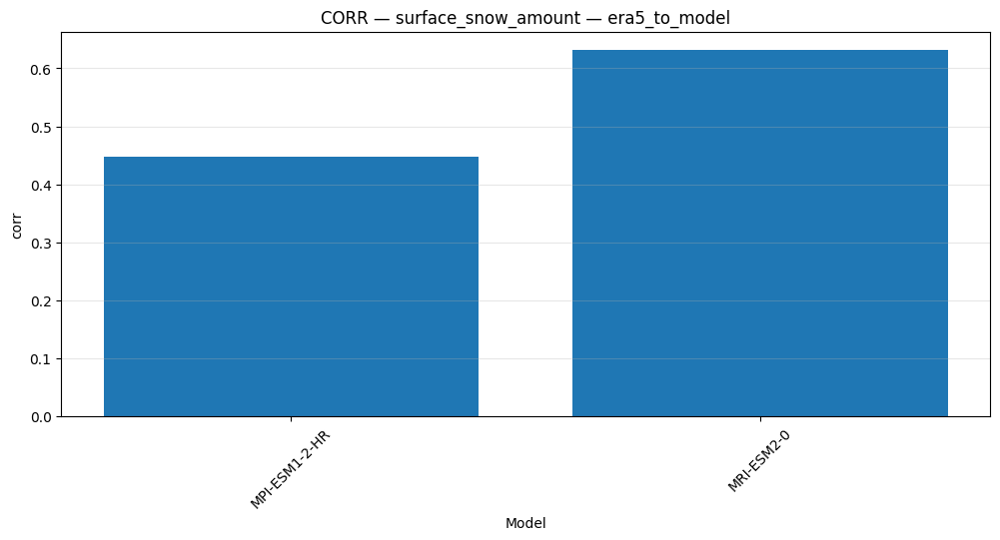

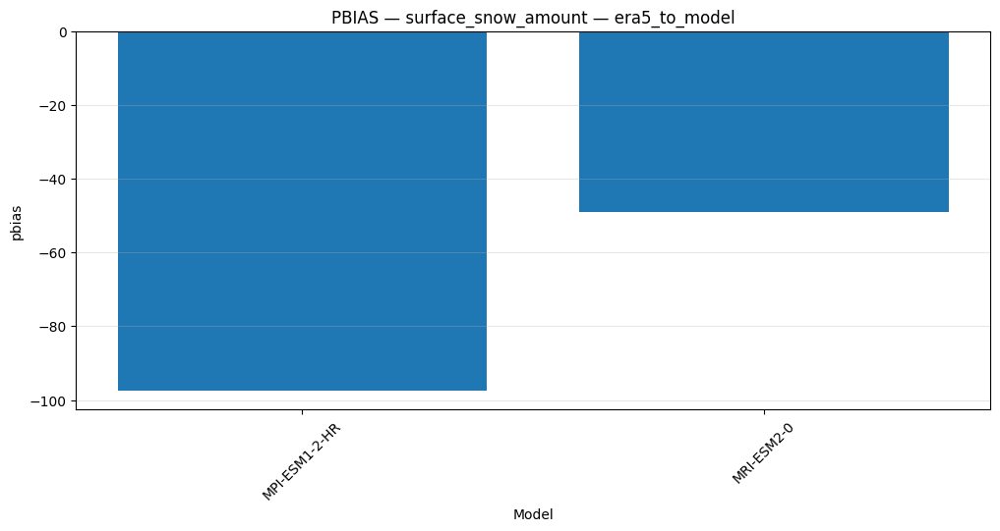

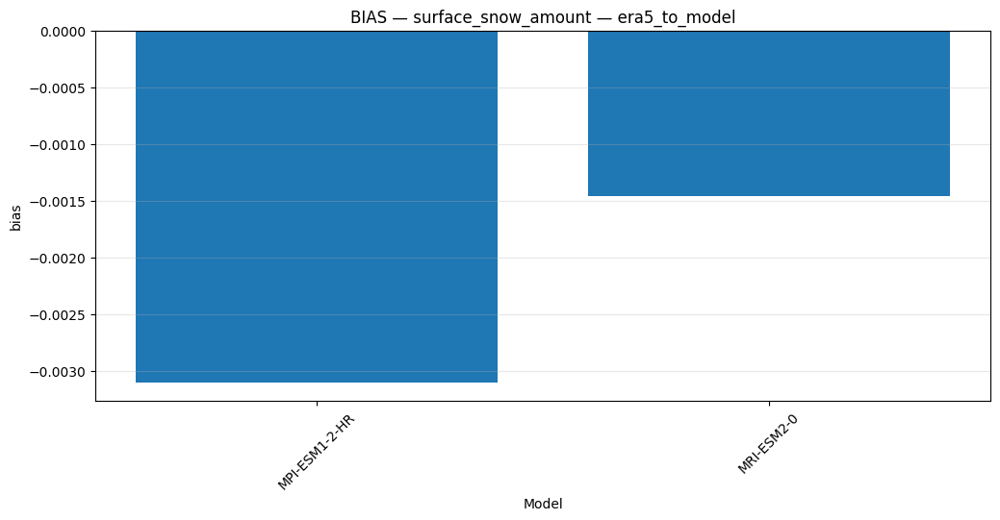

Comparison plots saved.


In [21]:
# ============================================================
# Compare and rank all models from both methods
# ============================================================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

OUT_DIR = Path("data") / "processed"
FIG_DIR = Path("outputs") / "figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)

file_model_to_era5 = OUT_DIR / "validation_model_to_era5_grid_2000_2014.csv"
file_era5_to_model = OUT_DIR / "validation_era5_to_model_grid_2000_2014.csv"

df1 = pd.read_csv(file_model_to_era5)
df2 = pd.read_csv(file_era5_to_model)

df_all = pd.concat([df1, df2], ignore_index=True)

compare_csv = OUT_DIR / "comparison_all_models_all_methods_2000_2014.csv"
df_all.to_csv(compare_csv, index=False)

print("All results:")
print(df_all)

# Ranking: lower RMSE and MAE better, higher corr better, abs pbias lower better
df_all["abs_pbias"] = df_all["pbias"].abs()
df_all["abs_bias"] = df_all["bias"].abs()

ranked = df_all.sort_values(
    by=["variable_type", "method", "rmse", "mae", "abs_pbias", "corr"],
    ascending=[True, True, True, True, True, False]
)

ranked_csv = OUT_DIR / "ranked_models_all_methods_2000_2014.csv"
ranked.to_csv(ranked_csv, index=False)

print("\nRanked results:")
print(ranked)

print("\nSaved:")
print(compare_csv)
print(ranked_csv)

# -----------------------------
# Bar plots for each variable and metric
# -----------------------------
metrics = ["rmse", "mae", "corr", "pbias", "bias"]

for method in df_all["method"].unique():

    df_method = df_all[df_all["method"] == method].copy()

    for variable_type in df_method["variable_type"].unique():

        df_var = df_method[df_method["variable_type"] == variable_type].copy()

        for metric in metrics:

            fig, ax = plt.subplots(figsize=(12, 5))
            ax.bar(df_var["model"], df_var[metric])

            ax.set_title(f"{metric.upper()} — {variable_type} — {method}")
            ax.set_xlabel("Model")
            ax.set_ylabel(metric)
            ax.grid(axis="y", alpha=0.3)
            ax.tick_params(axis="x", rotation=45)

            fig_path = FIG_DIR / f"compare_{method}_{variable_type}_{metric}.png"
            plt.savefig(fig_path, dpi=300, bbox_inches="tight")
            plt.show()

print("Comparison plots saved.")


Method: model_to_era5
File: data\processed\timeseries_model_to_era5_grid_2000_2014.csv


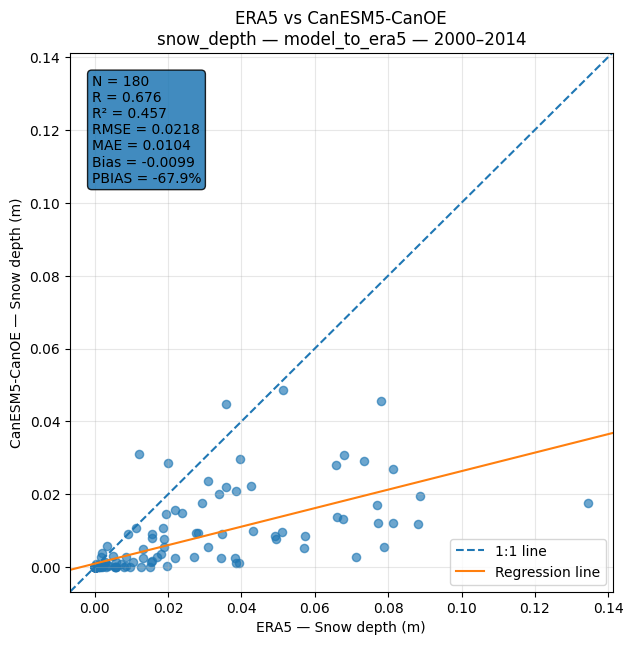

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CanESM5_CanOE_snow_depth_model_to_era5.png


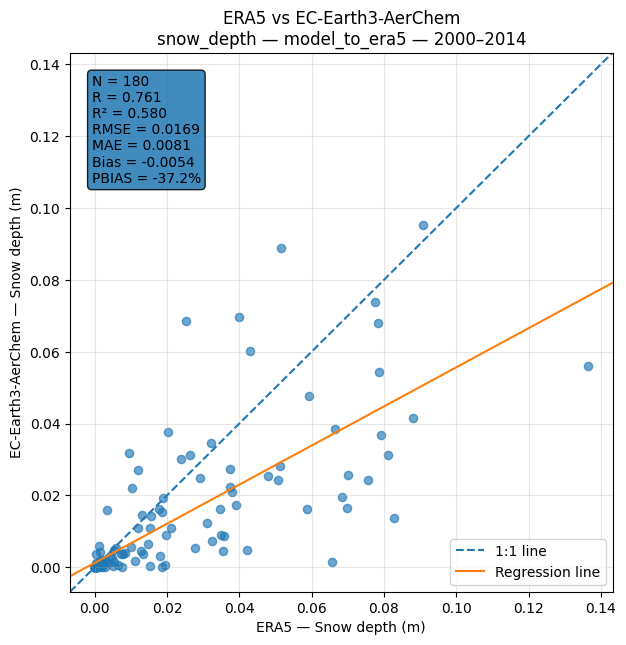

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_EC_Earth3_AerChem_snow_depth_model_to_era5.png


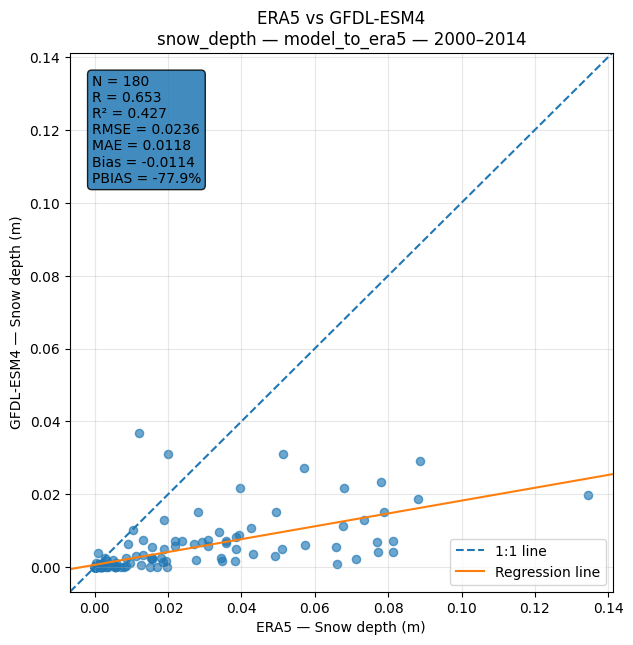

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_GFDL_ESM4_snow_depth_model_to_era5.png


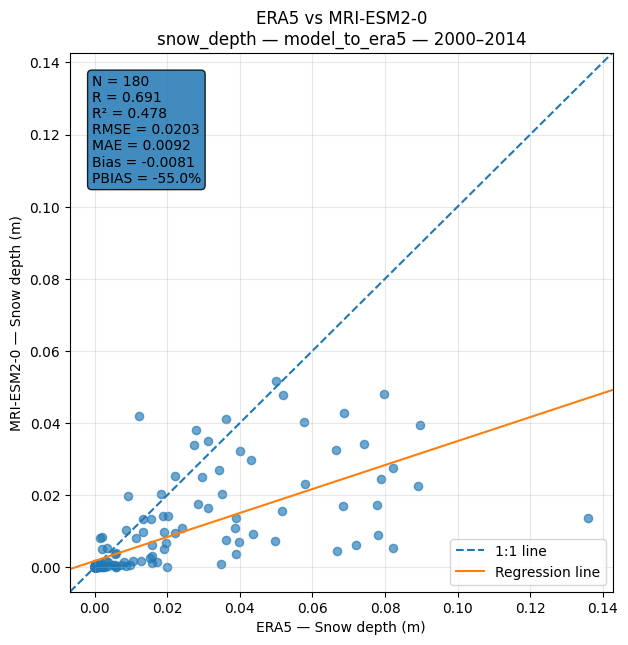

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_snow_depth_model_to_era5.png


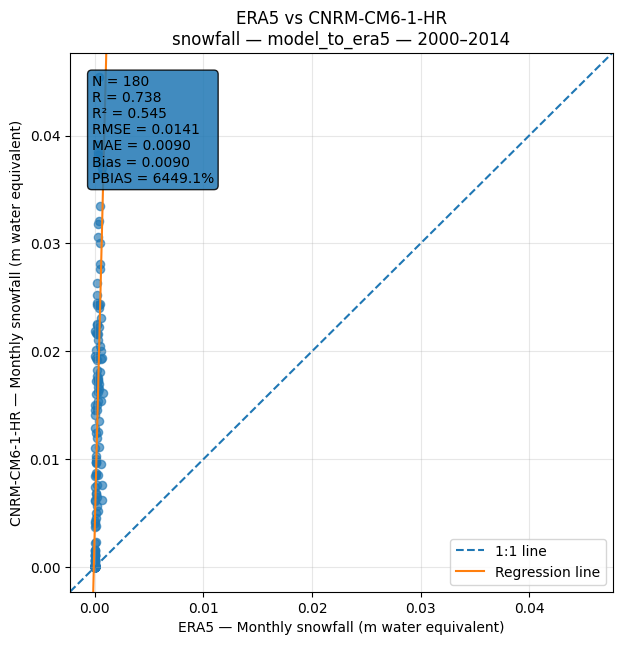

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CNRM_CM6_1_HR_snowfall_model_to_era5.png


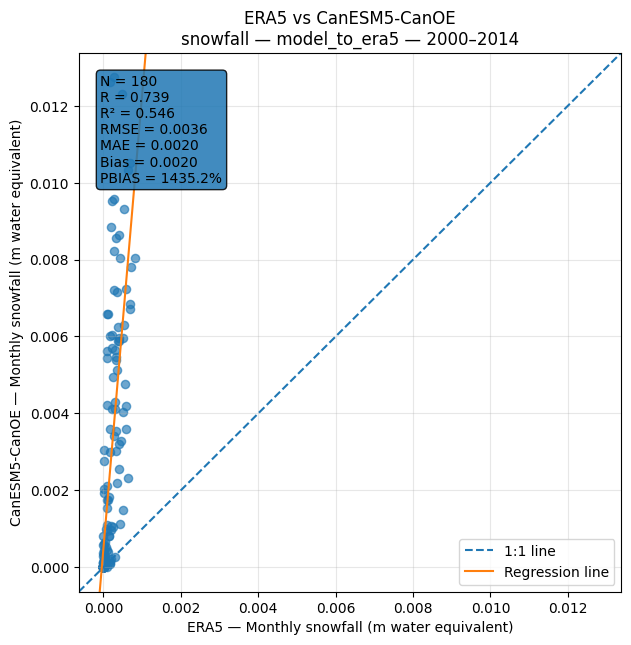

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CanESM5_CanOE_snowfall_model_to_era5.png


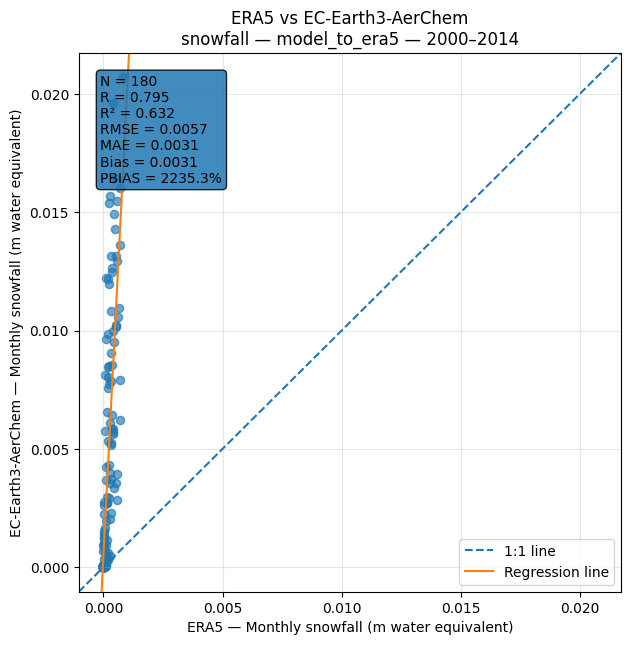

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_EC_Earth3_AerChem_snowfall_model_to_era5.png


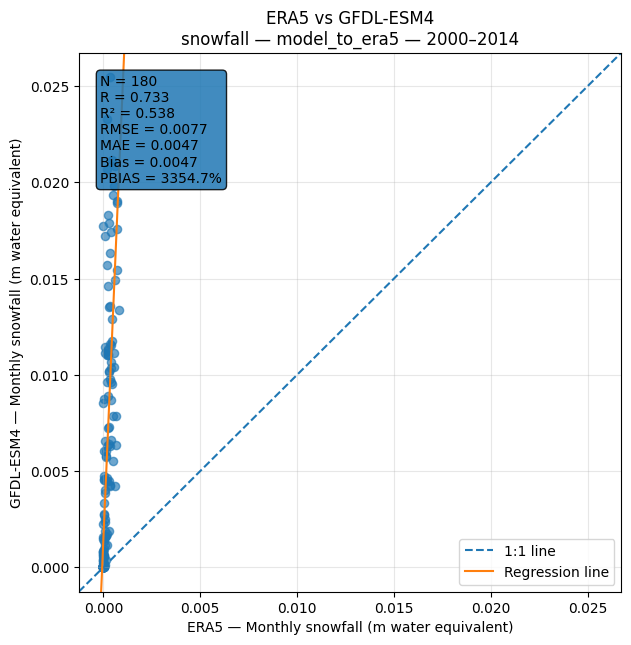

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_GFDL_ESM4_snowfall_model_to_era5.png


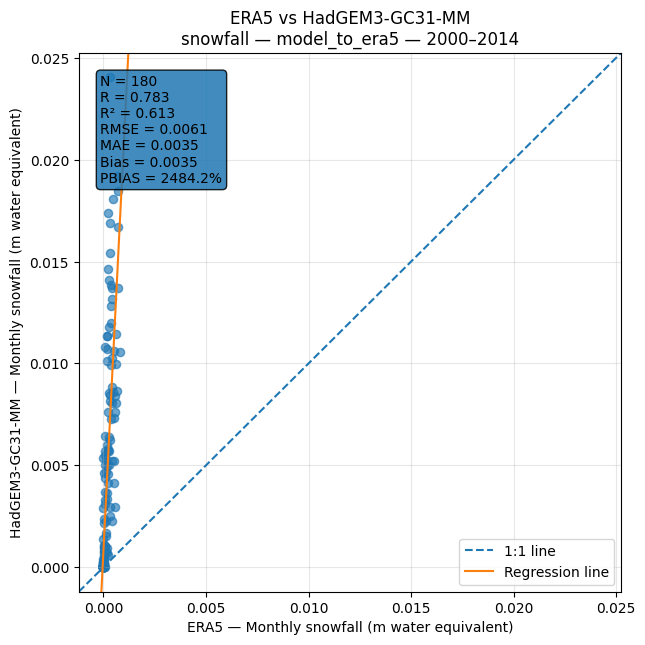

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_HadGEM3_GC31_MM_snowfall_model_to_era5.png


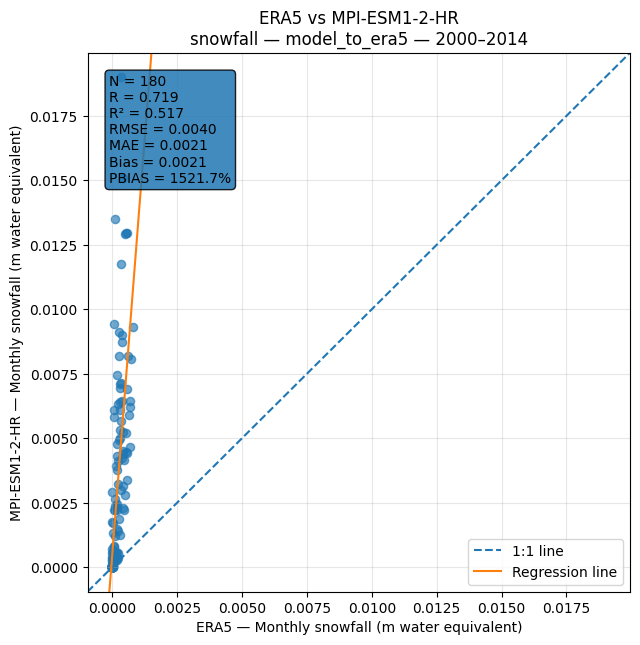

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MPI_ESM1_2_HR_snowfall_model_to_era5.png


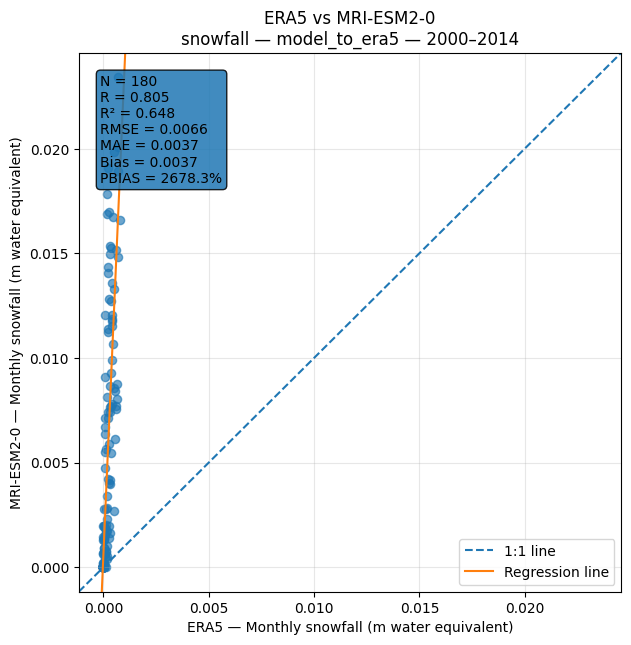

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_snowfall_model_to_era5.png


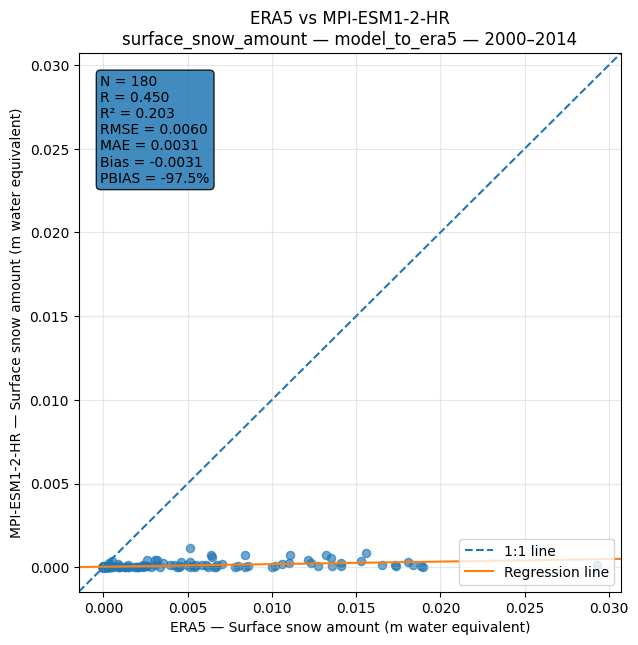

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MPI_ESM1_2_HR_surface_snow_amount_model_to_era5.png


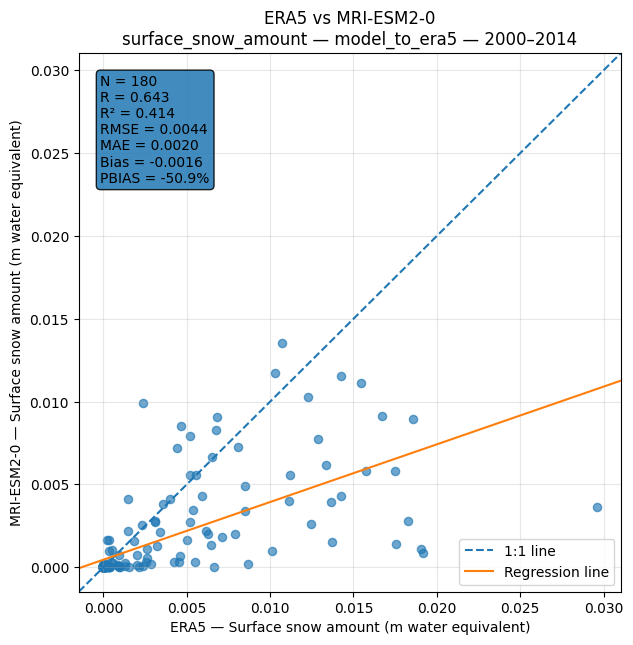

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_surface_snow_amount_model_to_era5.png

Method: era5_to_model
File: data\processed\timeseries_era5_to_model_grid_2000_2014.csv


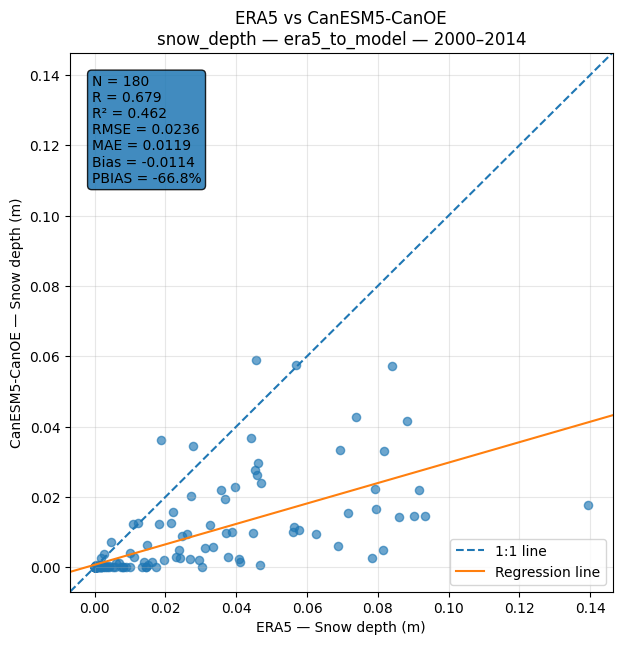

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CanESM5_CanOE_snow_depth_era5_to_model.png


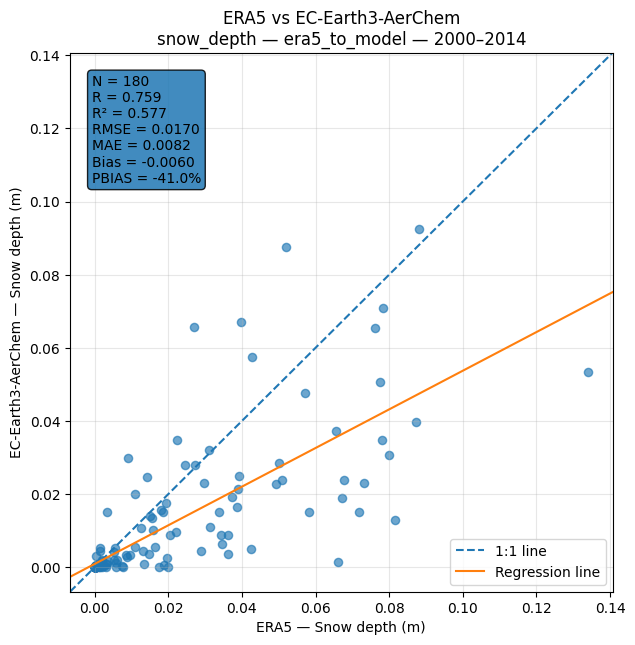

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_EC_Earth3_AerChem_snow_depth_era5_to_model.png


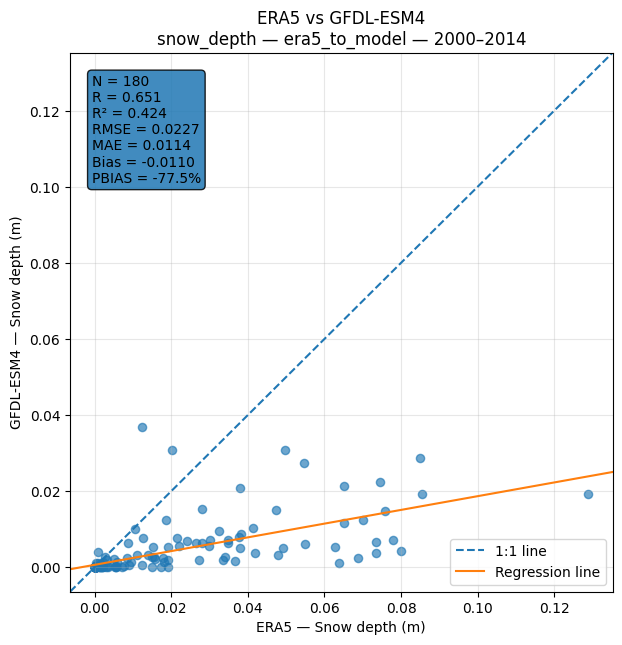

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_GFDL_ESM4_snow_depth_era5_to_model.png


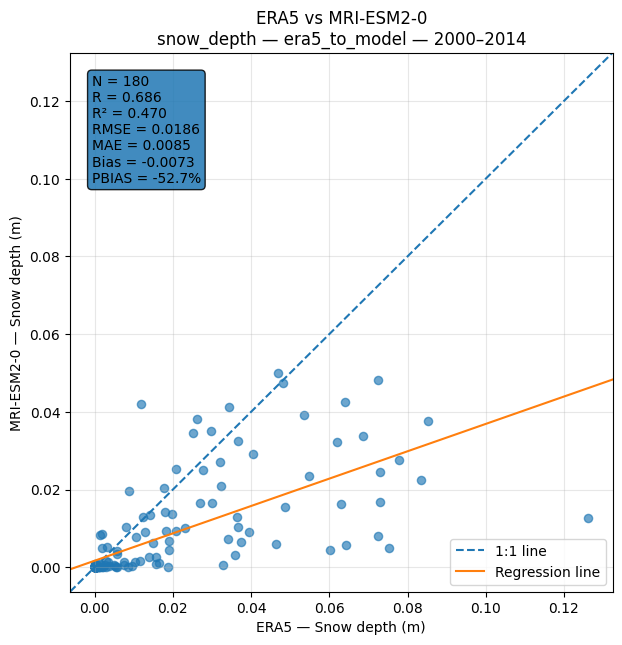

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_snow_depth_era5_to_model.png


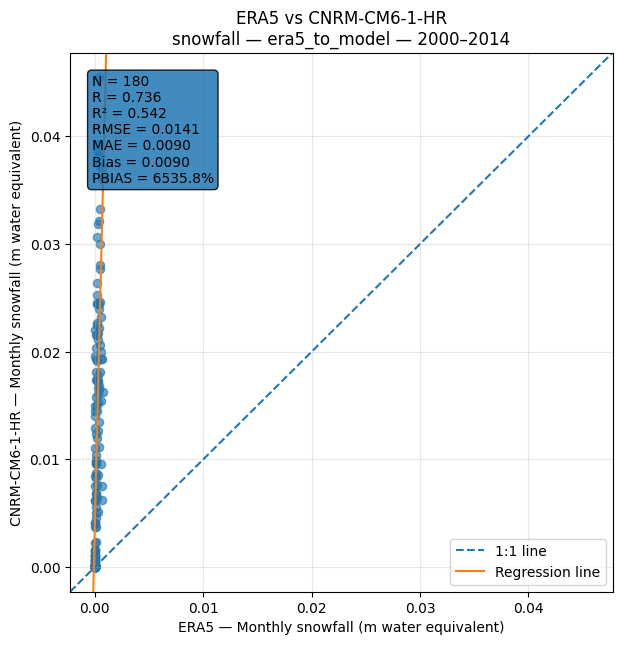

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CNRM_CM6_1_HR_snowfall_era5_to_model.png


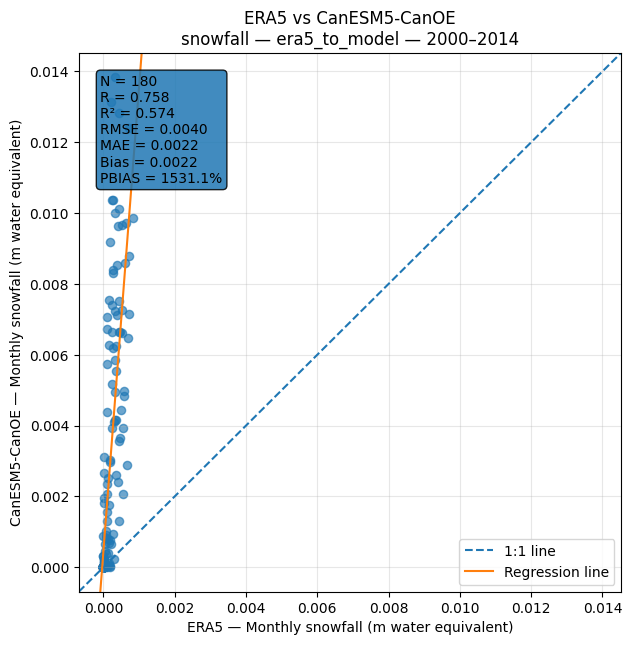

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_CanESM5_CanOE_snowfall_era5_to_model.png


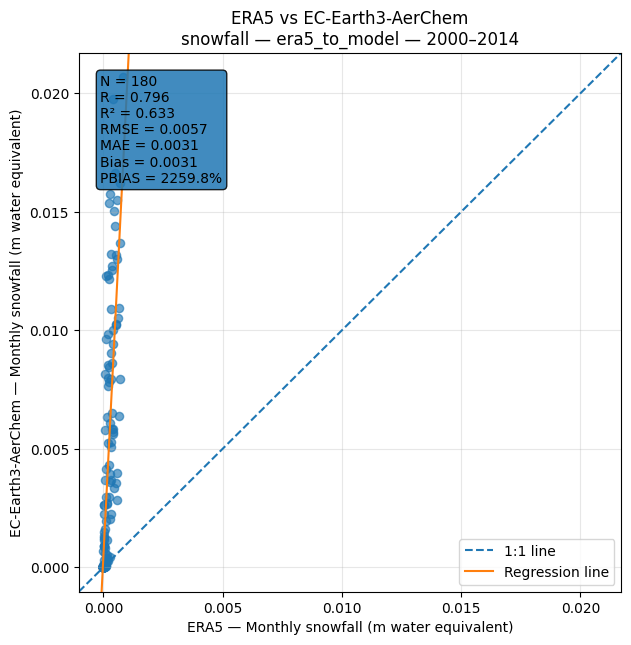

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_EC_Earth3_AerChem_snowfall_era5_to_model.png


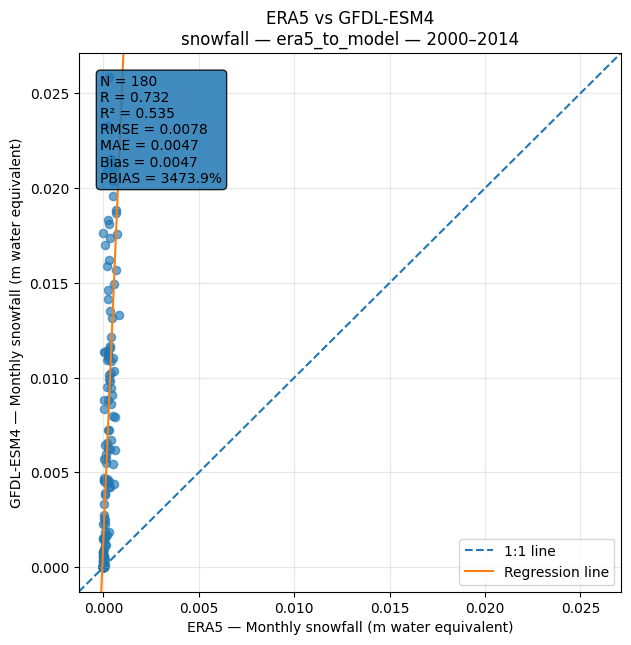

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_GFDL_ESM4_snowfall_era5_to_model.png


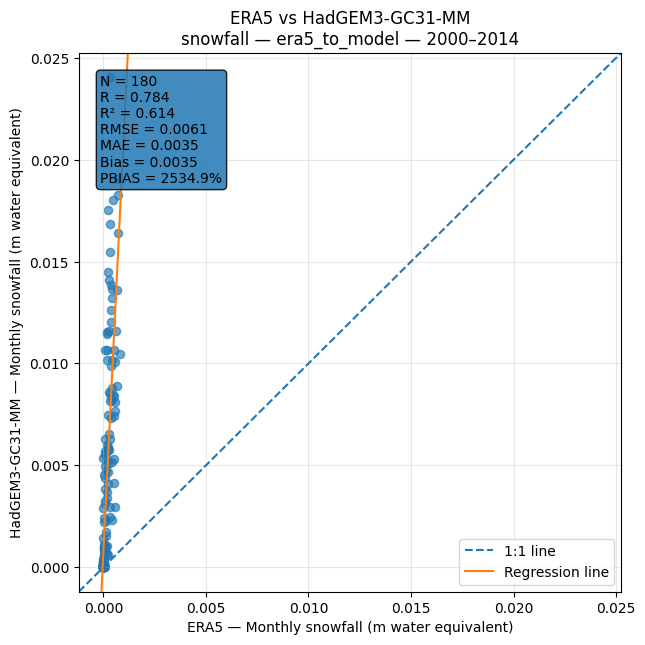

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_HadGEM3_GC31_MM_snowfall_era5_to_model.png


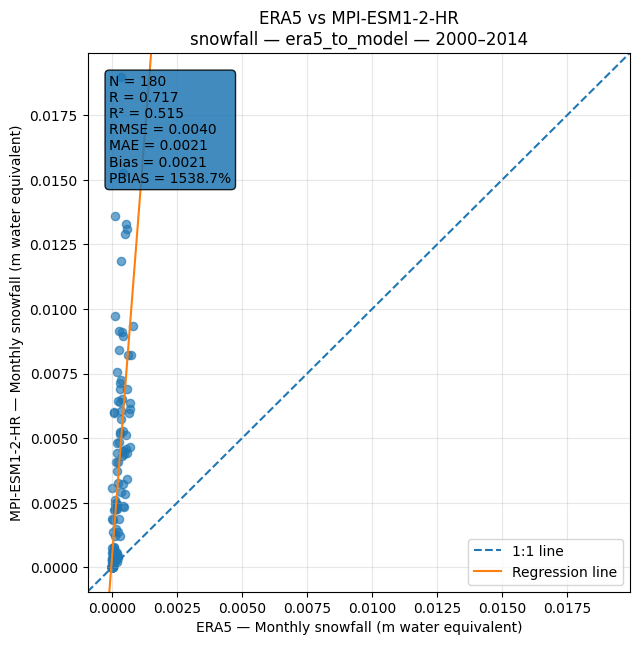

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MPI_ESM1_2_HR_snowfall_era5_to_model.png


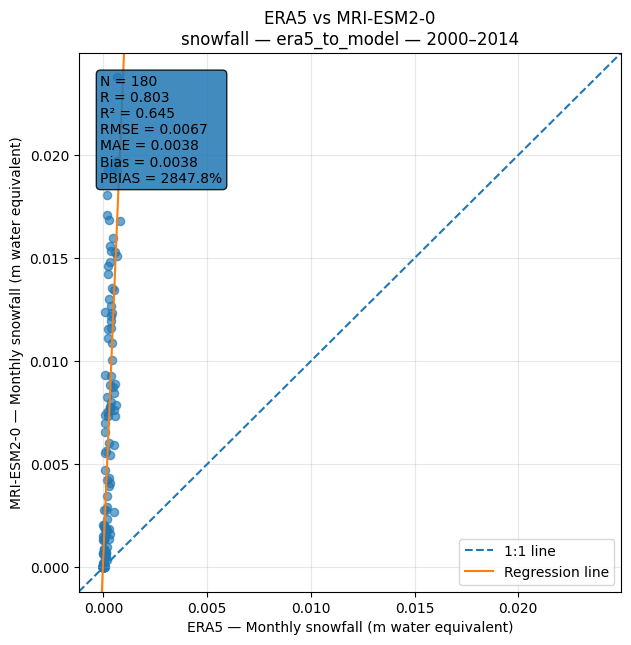

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_snowfall_era5_to_model.png


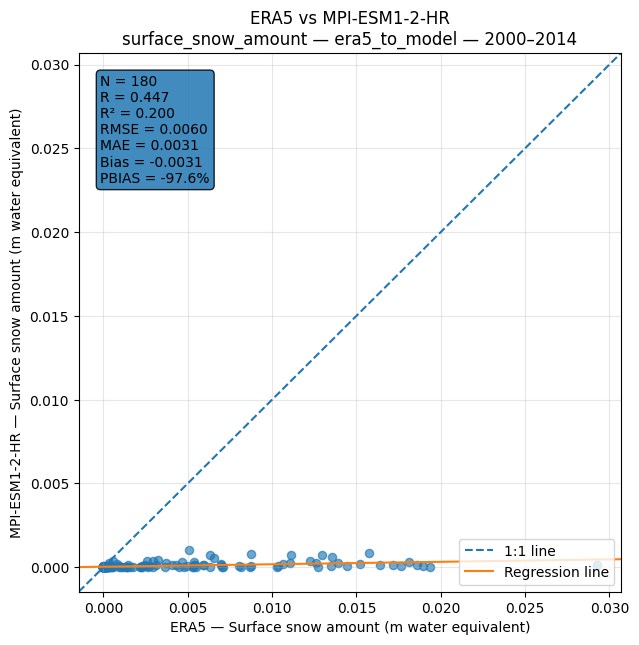

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MPI_ESM1_2_HR_surface_snow_amount_era5_to_model.png


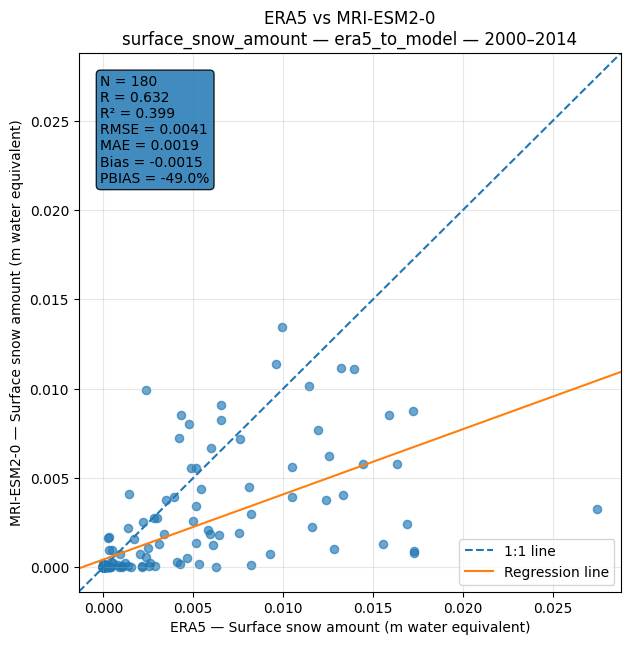

Saved: outputs\figures\scatter_era5_vs_models\scatter_ERA5_vs_MRI_ESM2_0_surface_snow_amount_era5_to_model.png

Saved scatter statistics:
data\processed\scatter_ERA5_vs_models_statistics_2000_2014.csv
           method              model        variable_type    n      bias  \
0   model_to_era5      CanESM5-CanOE           snow_depth  180 -0.009936   
1   model_to_era5  EC-Earth3-AerChem           snow_depth  180 -0.005414   
2   model_to_era5          GFDL-ESM4           snow_depth  180 -0.011398   
3   model_to_era5         MRI-ESM2-0           snow_depth  180 -0.008132   
4   model_to_era5      CNRM-CM6-1-HR             snowfall  180  0.008966   
5   model_to_era5      CanESM5-CanOE             snowfall  180  0.002001   
6   model_to_era5  EC-Earth3-AerChem             snowfall  180  0.003117   
7   model_to_era5          GFDL-ESM4             snowfall  180  0.004678   
8   model_to_era5    HadGEM3-GC31-MM             snowfall  180  0.003527   
9   model_to_era5      MPI-ESM1-2-HR   

In [22]:
# ============================================================
# Scatter plots: ERA5 vs CMIP6 models
# For each method, model, and variable
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr, linregress

# -----------------------------
# Paths
# -----------------------------
OUT_DIR = Path("data") / "processed"
FIG_DIR = Path("outputs") / "figures" / "scatter_era5_vs_models"
FIG_DIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# Input time-series files
# -----------------------------
timeseries_files = {
    "model_to_era5": OUT_DIR / "timeseries_model_to_era5_grid_2000_2014.csv",
    "era5_to_model": OUT_DIR / "timeseries_era5_to_model_grid_2000_2014.csv",
}

# -----------------------------
# Helper functions
# -----------------------------
def safe_name(text):
    return (
        str(text)
        .replace(" ", "_")
        .replace("/", "_")
        .replace("\\", "_")
        .replace(":", "_")
        .replace("-", "_")
    )


def calculate_scatter_stats(x, y):
    df = pd.DataFrame({"ERA5": x, "Model": y}).dropna()

    if len(df) < 3:
        return {
            "n": len(df),
            "bias": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "corr": np.nan,
            "r2": np.nan,
            "pbias": np.nan,
            "slope": np.nan,
            "intercept": np.nan
        }

    x = df["ERA5"].values
    y = df["Model"].values

    bias = np.mean(y - x)
    mae = mean_absolute_error(x, y)
    rmse = np.sqrt(mean_squared_error(x, y))

    if np.std(x) == 0 or np.std(y) == 0:
        corr = np.nan
        r2 = np.nan
        slope = np.nan
        intercept = np.nan
    else:
        corr = pearsonr(x, y)[0]
        r2 = corr ** 2
        reg = linregress(x, y)
        slope = reg.slope
        intercept = reg.intercept

    if np.sum(x) != 0:
        pbias = 100 * (np.sum(y) - np.sum(x)) / np.sum(x)
    else:
        pbias = np.nan

    return {
        "n": len(df),
        "bias": bias,
        "mae": mae,
        "rmse": rmse,
        "corr": corr,
        "r2": r2,
        "pbias": pbias,
        "slope": slope,
        "intercept": intercept
    }


def get_axis_label(variable_type):
    if variable_type == "snow_depth":
        return "Snow depth (m)"
    elif variable_type == "surface_snow_amount":
        return "Surface snow amount (m water equivalent)"
    elif variable_type == "snowfall":
        return "Monthly snowfall (m water equivalent)"
    else:
        return variable_type


# -----------------------------
# Main loop
# -----------------------------
all_stats = []

for method_name, csv_file in timeseries_files.items():

    print("\n" + "=" * 100)
    print("Method:", method_name)
    print("File:", csv_file)

    if not csv_file.exists():
        print("File not found. Skipping:", csv_file)
        continue

    df = pd.read_csv(csv_file)
    df["time"] = pd.to_datetime(df["time"])

    # Check required columns
    required_cols = ["time", "ERA5", "Model", "model", "variable_type"]
    missing_cols = [c for c in required_cols if c not in df.columns]

    if missing_cols:
        raise ValueError(f"Missing columns in {csv_file}: {missing_cols}")

    for variable_type in sorted(df["variable_type"].unique()):

        df_var = df[df["variable_type"] == variable_type].copy()

        for model_name in sorted(df_var["model"].unique()):

            df_plot = df_var[df_var["model"] == model_name].copy()
            df_plot = df_plot[["time", "ERA5", "Model"]].dropna()

            if len(df_plot) < 3:
                print("Not enough data:", method_name, model_name, variable_type)
                continue

            x = df_plot["ERA5"].values
            y = df_plot["Model"].values

            stats = calculate_scatter_stats(x, y)

            all_stats.append({
                "method": method_name,
                "model": model_name,
                "variable_type": variable_type,
                **stats
            })

            # -----------------------------
            # Plot
            # -----------------------------
            fig, ax = plt.subplots(figsize=(7, 7))

            ax.scatter(x, y, alpha=0.65, s=35)

            # Axis limits
            xy_min = np.nanmin([np.nanmin(x), np.nanmin(y)])
            xy_max = np.nanmax([np.nanmax(x), np.nanmax(y)])

            if xy_min == xy_max:
                xy_min = xy_min - 1
                xy_max = xy_max + 1

            padding = 0.05 * (xy_max - xy_min)
            axis_min = xy_min - padding
            axis_max = xy_max + padding

            ax.set_xlim(axis_min, axis_max)
            ax.set_ylim(axis_min, axis_max)

            # 1:1 line
            ax.plot(
                [axis_min, axis_max],
                [axis_min, axis_max],
                linestyle="--",
                linewidth=1.5,
                label="1:1 line"
            )

            # Regression line
            if not np.isnan(stats["slope"]):
                x_line = np.linspace(axis_min, axis_max, 100)
                y_line = stats["slope"] * x_line + stats["intercept"]
                ax.plot(
                    x_line,
                    y_line,
                    linewidth=1.5,
                    label="Regression line"
                )

            # Labels
            unit_label = get_axis_label(variable_type)

            ax.set_xlabel(f"ERA5 — {unit_label}")
            ax.set_ylabel(f"{model_name} — {unit_label}")

            ax.set_title(
                f"ERA5 vs {model_name}\n"
                f"{variable_type} — {method_name} — 2000–2014"
            )

            ax.grid(True, alpha=0.3)
            ax.legend(loc="lower right")

            # Statistics text box
            stats_text = (
                f"N = {stats['n']}\n"
                f"R = {stats['corr']:.3f}\n"
                f"R² = {stats['r2']:.3f}\n"
                f"RMSE = {stats['rmse']:.4f}\n"
                f"MAE = {stats['mae']:.4f}\n"
                f"Bias = {stats['bias']:.4f}\n"
                f"PBIAS = {stats['pbias']:.1f}%"
            )

            ax.text(
                0.04,
                0.96,
                stats_text,
                transform=ax.transAxes,
                va="top",
                ha="left",
                bbox=dict(boxstyle="round", alpha=0.85)
            )

            # Save
            fig_name = (
                f"scatter_ERA5_vs_{safe_name(model_name)}_"
                f"{safe_name(variable_type)}_{safe_name(method_name)}.png"
            )

            fig_path = FIG_DIR / fig_name
            plt.savefig(fig_path, dpi=300, bbox_inches="tight")
            plt.show()

            print("Saved:", fig_path)

# -----------------------------
# Save statistics table
# -----------------------------
scatter_stats_df = pd.DataFrame(all_stats)

scatter_stats_csv = OUT_DIR / "scatter_ERA5_vs_models_statistics_2000_2014.csv"
scatter_stats_df.to_csv(scatter_stats_csv, index=False)

print("\nSaved scatter statistics:")
print(scatter_stats_csv)

print(scatter_stats_df)

ERA5 loaded:
<xarray.Dataset> Size: 1GB
Dimensions:    (time: 912, latitude: 201, longitude: 231)
Coordinates:
  * time       (time) datetime64[ns] 7kB 1950-01-01 1950-02-01 ... 2025-12-01
  * latitude   (latitude) float32 804B 42.0 41.9 41.8 41.7 ... 22.2 22.1 22.0
  * longitude  (longitude) float32 924B 42.0 42.1 42.2 42.3 ... 64.8 64.9 65.0
Data variables:
    asn        (time, latitude, longitude) float32 169MB ...
    rsn        (time, latitude, longitude) float32 169MB ...
    sd         (time, latitude, longitude) float32 169MB ...
    sde        (time, latitude, longitude) float32 169MB ...
    sf         (time, latitude, longitude) float32 169MB ...
    smlt       (time, latitude, longitude) float32 169MB ...
    snowc      (time, latitude, longitude) float32 169MB ...
    tsn        (time, latitude, longitude) float32 169MB ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-06-13 09:43:49 GMT by grib_to_netcdf-2.24.0: /opt/ecmw...

###############################

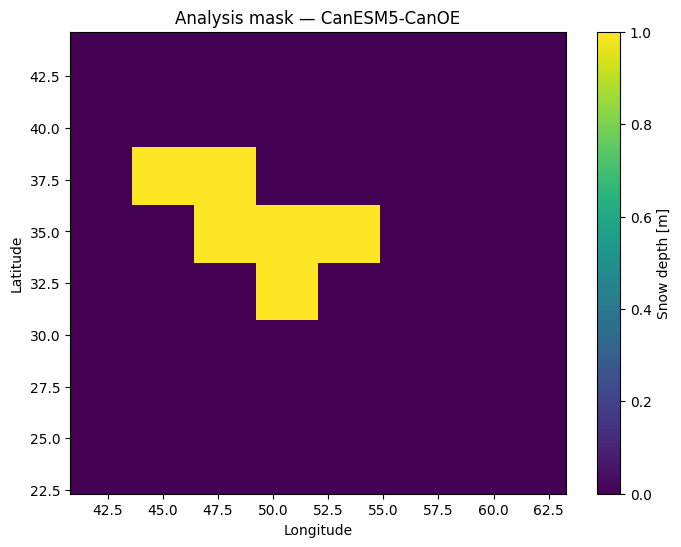


MODEL: CanESM5-CanOE
VARIABLE: snow_depth
FILE: data\raw\CanESM5-CanOE _Snow_Depth_Historical.nc


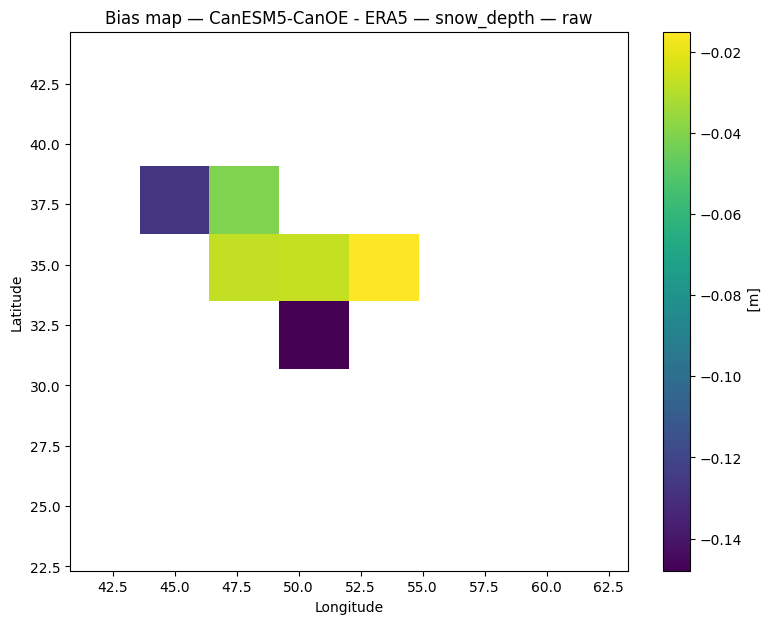

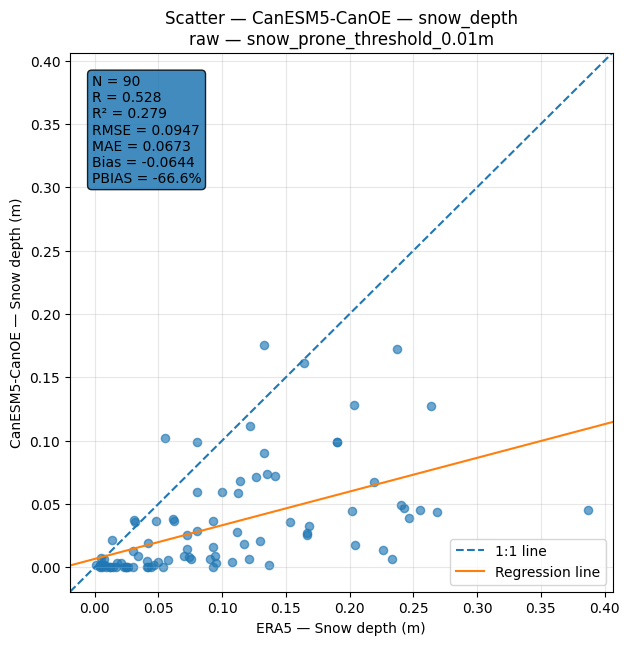

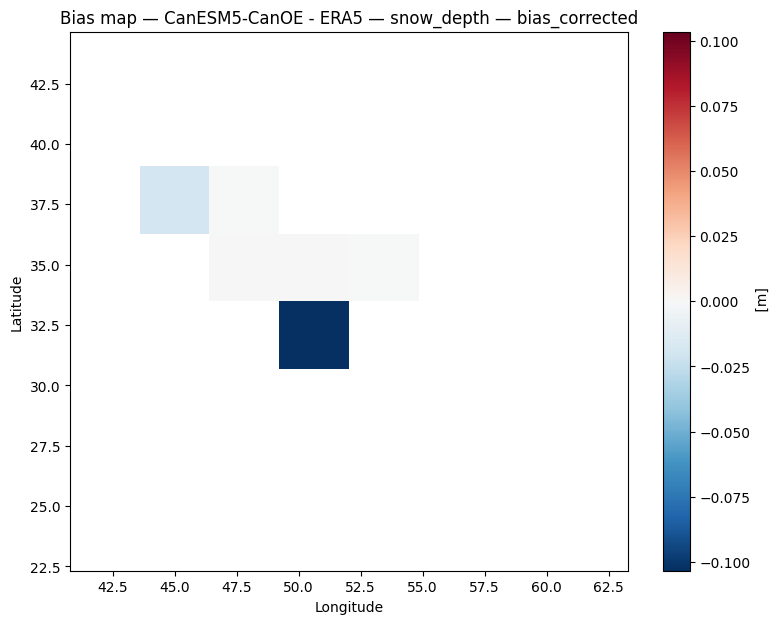

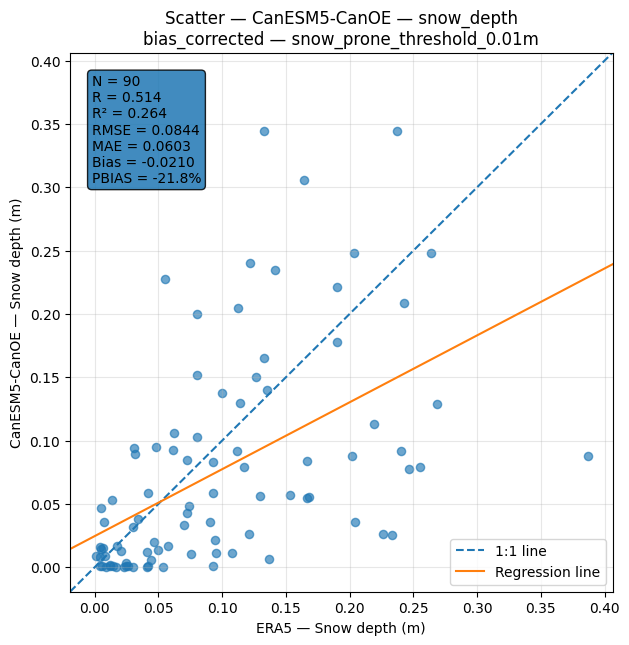

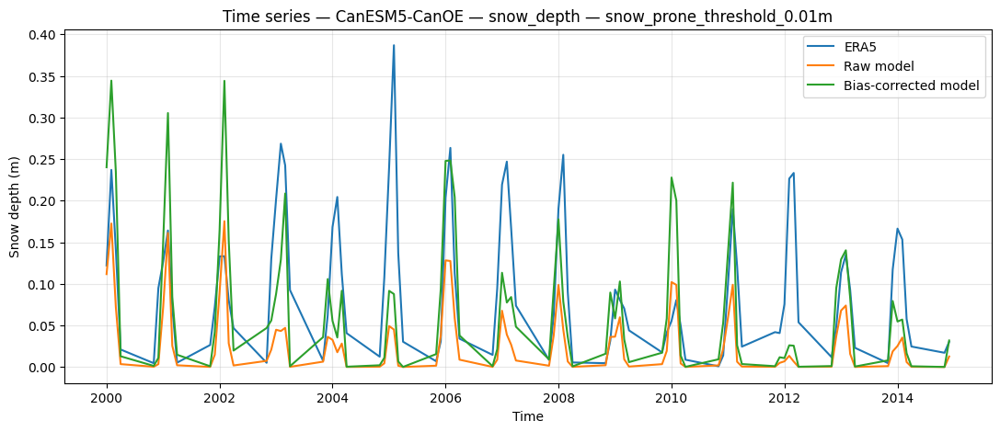

Finished: CanESM5-CanOE snow_depth

MODEL: CanESM5-CanOE
VARIABLE: snowfall
FILE: data\raw\CanESM5-CanOE _Snowfall_Historical.nc


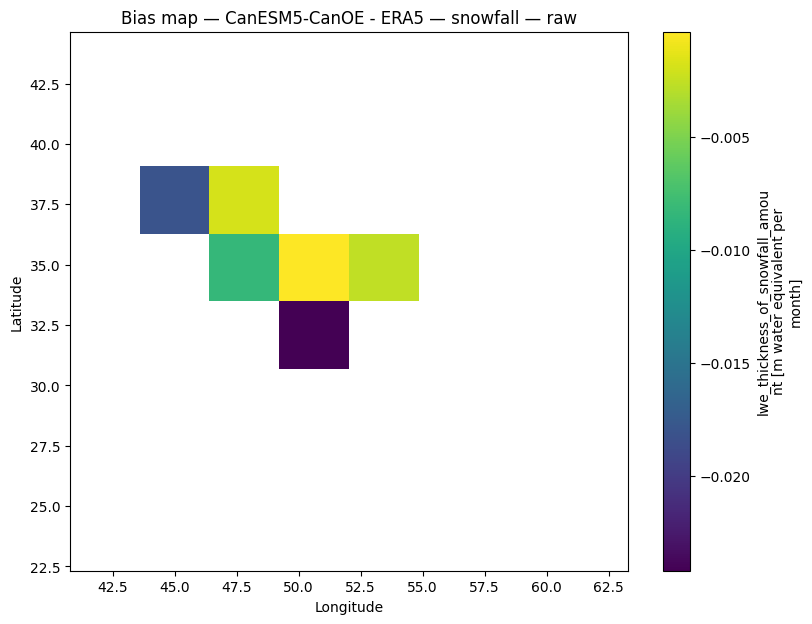

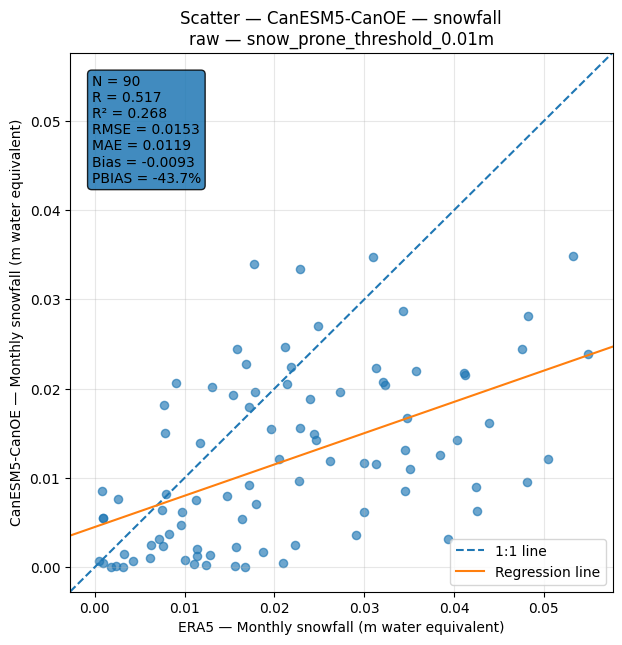

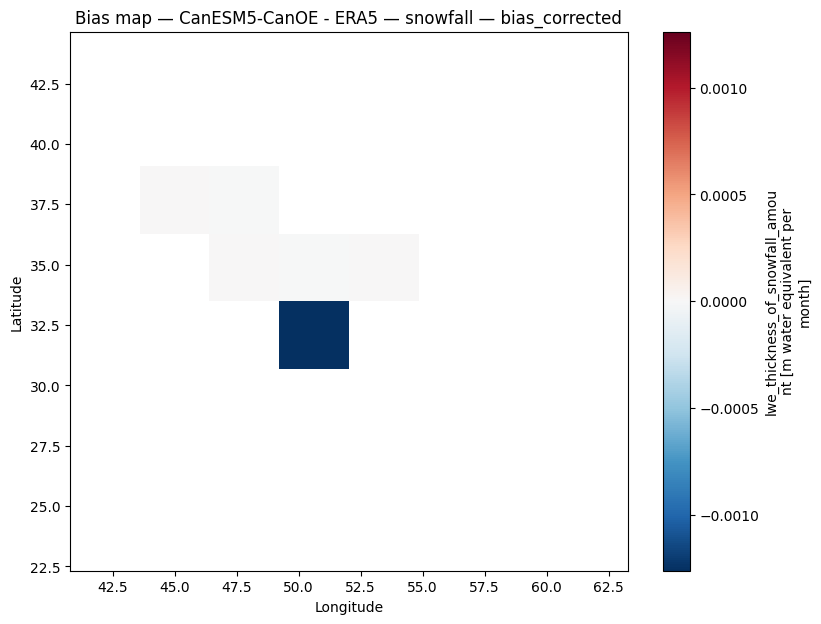

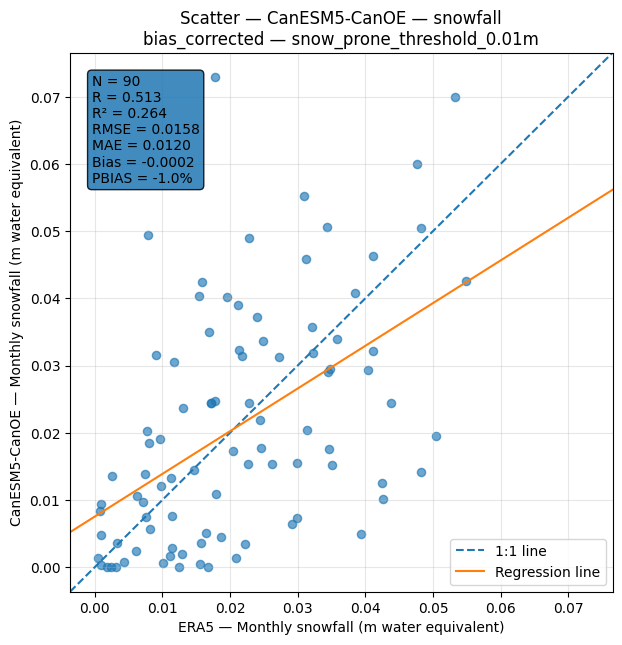

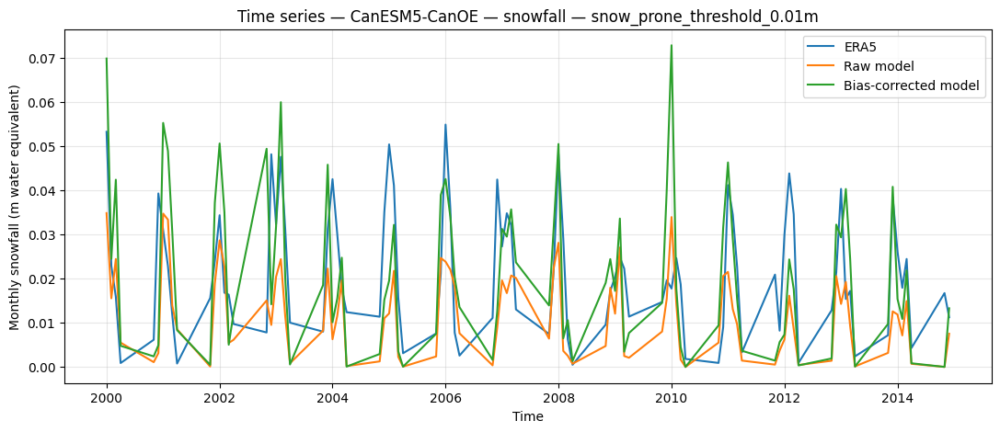

Finished: CanESM5-CanOE snowfall

########################################################################################################################
MODEL: CNRM-CM6-1-HR
########################################################################################################################
Iran grid cells: 616
Snow-prone grid cells: 199


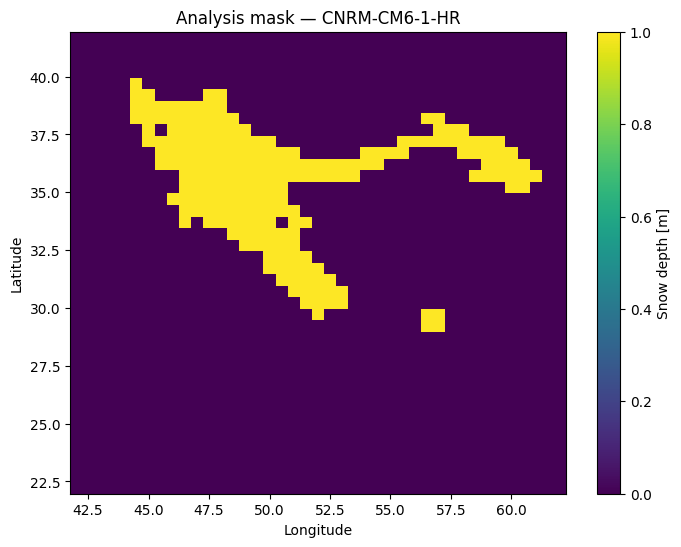


MODEL: CNRM-CM6-1-HR
VARIABLE: snowfall
FILE: data\raw\CNRM-CM6-1-HR_Snowfall flux.nc


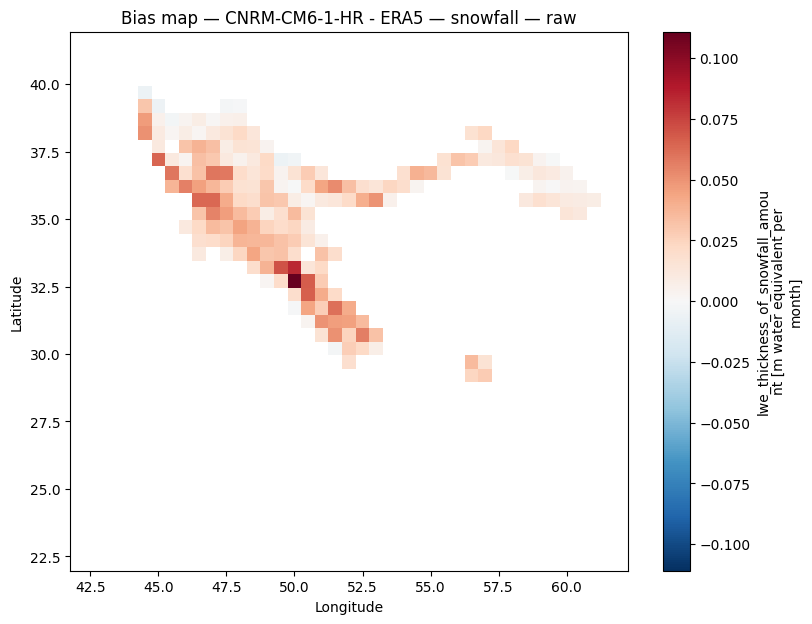

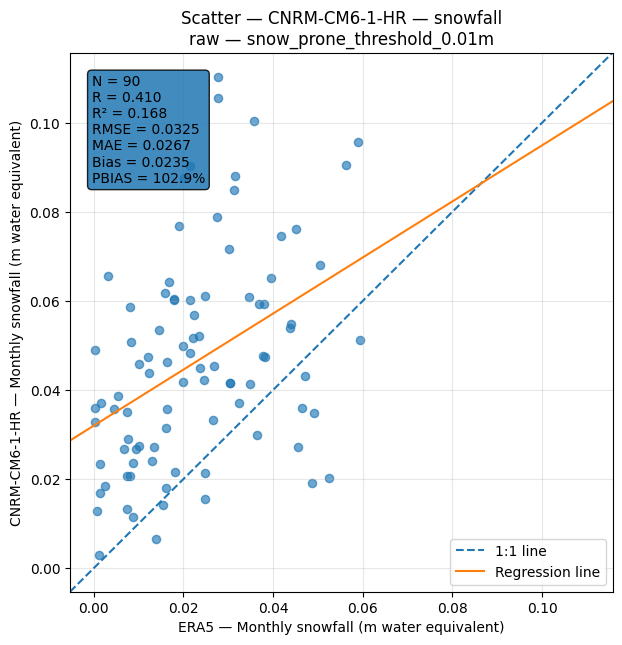

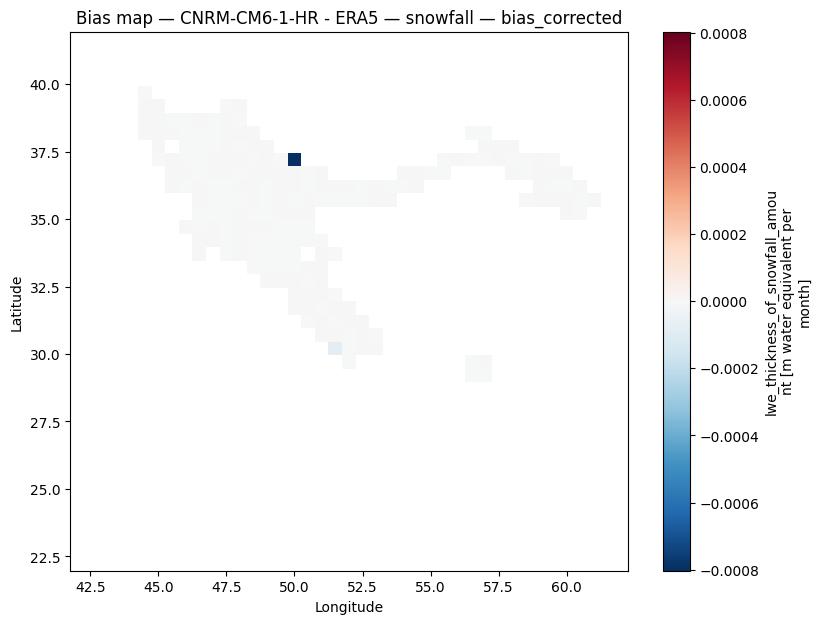

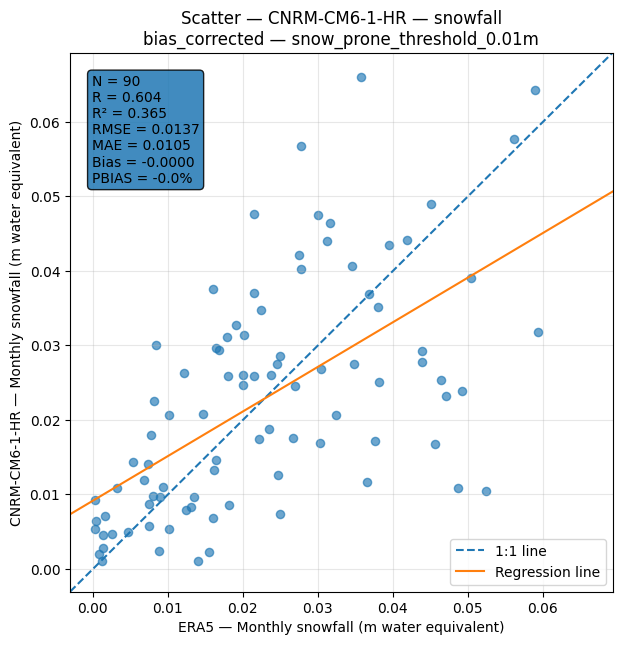

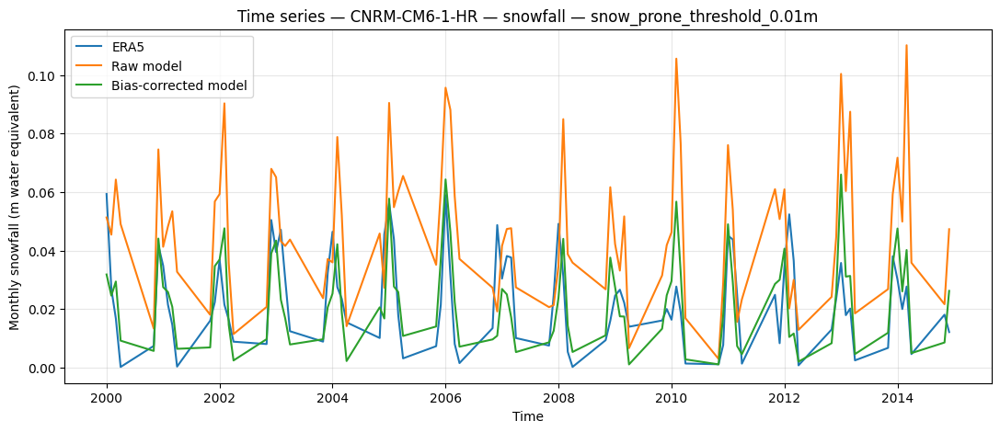

Finished: CNRM-CM6-1-HR snowfall

########################################################################################################################
MODEL: EC-Earth3-AerChem
########################################################################################################################
Iran grid cells: 315
Snow-prone grid cells: 102


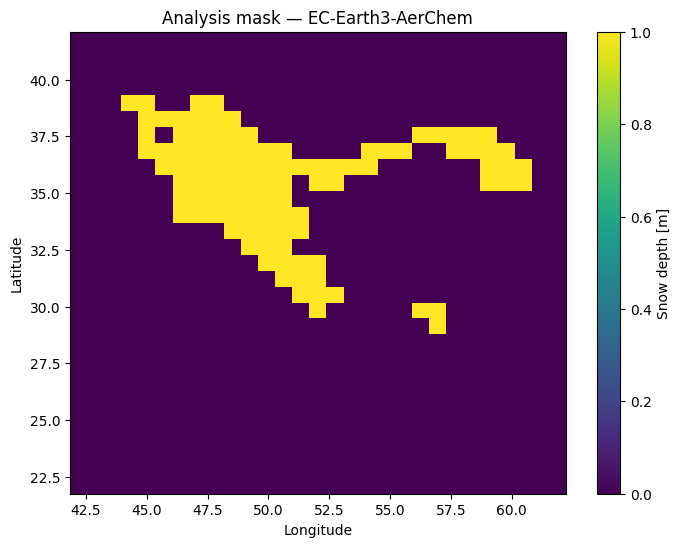


MODEL: EC-Earth3-AerChem
VARIABLE: snow_depth
FILE: data\raw\EC-Earth3-AerChem_Snow depth.nc


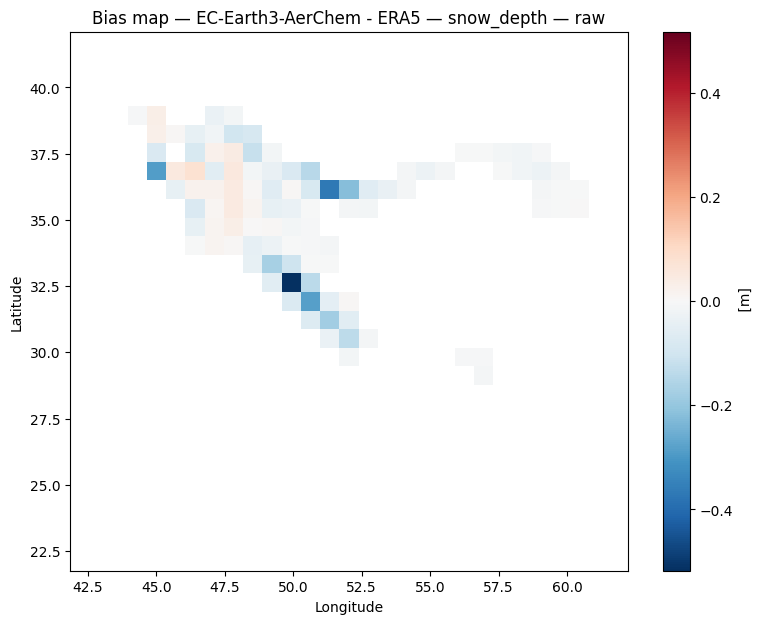

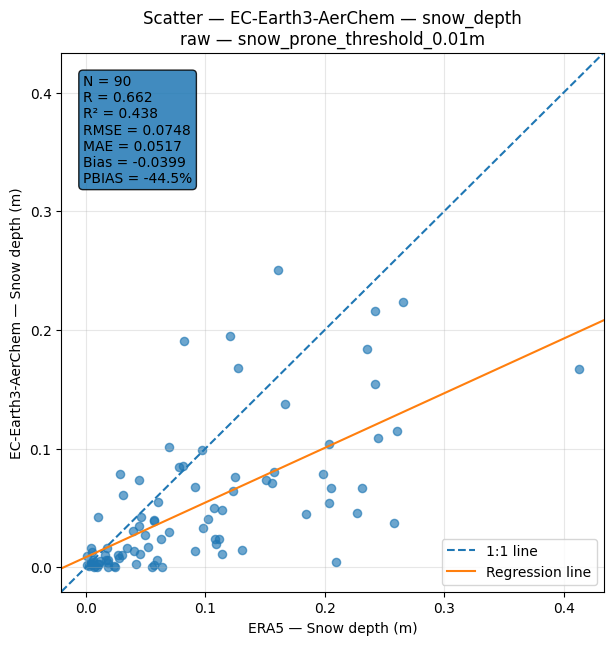

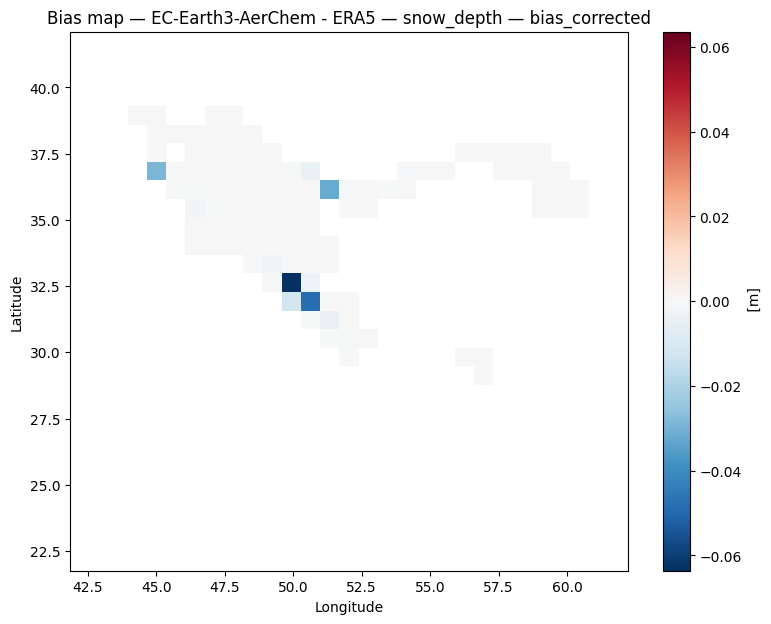

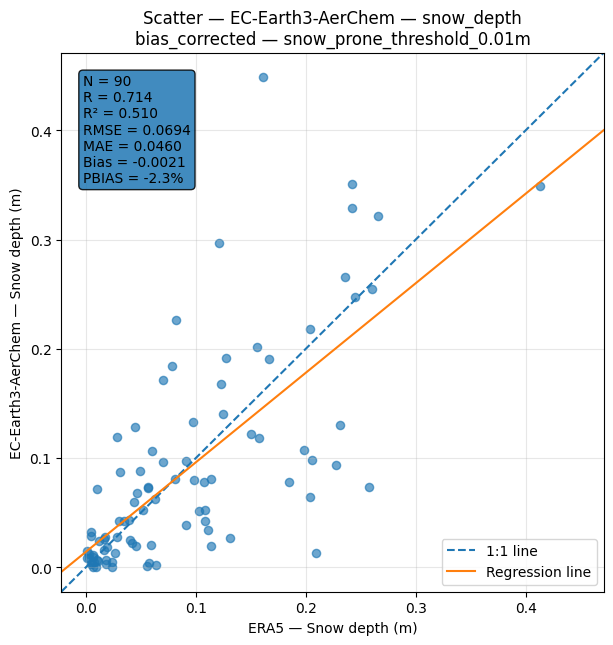

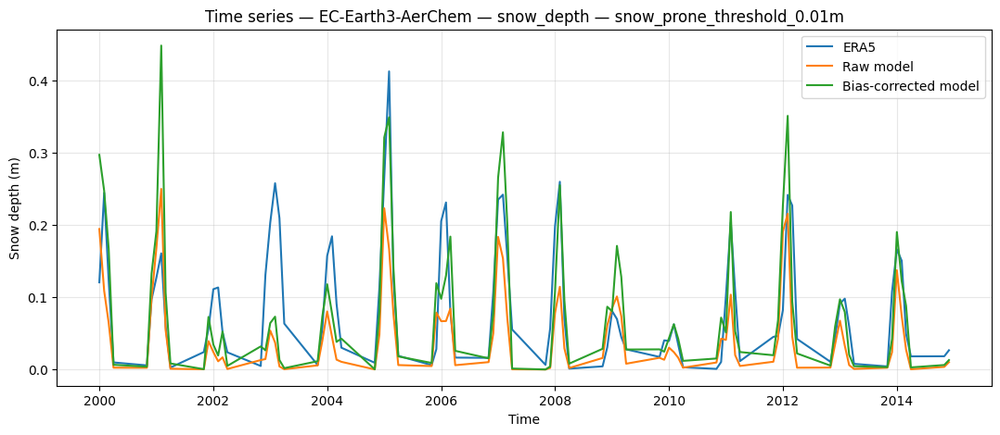

Finished: EC-Earth3-AerChem snow_depth

MODEL: EC-Earth3-AerChem
VARIABLE: snowfall
FILE: data\raw\EC-Earth3-AerChem_Snowfall flux.nc


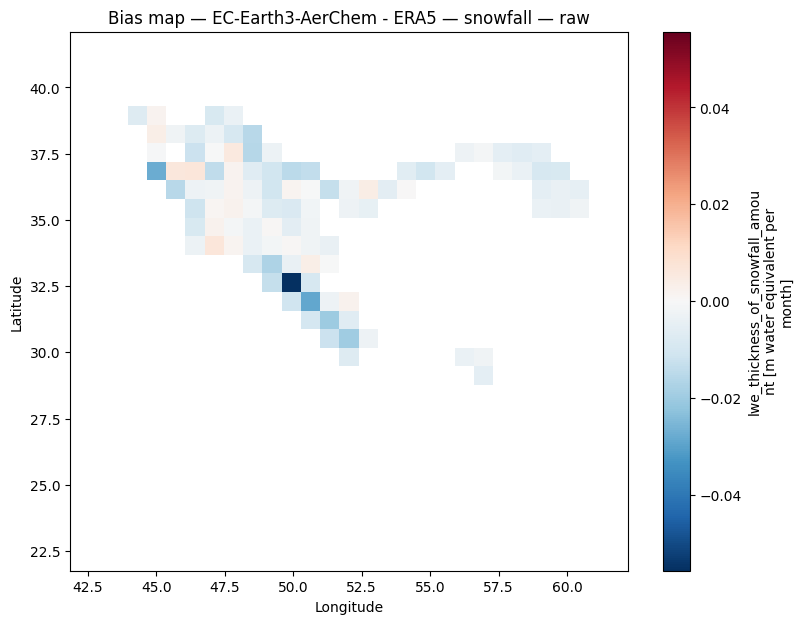

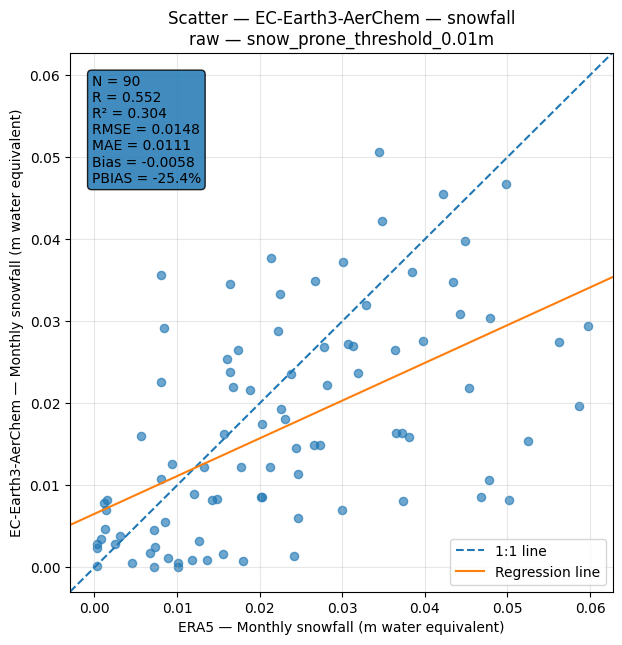

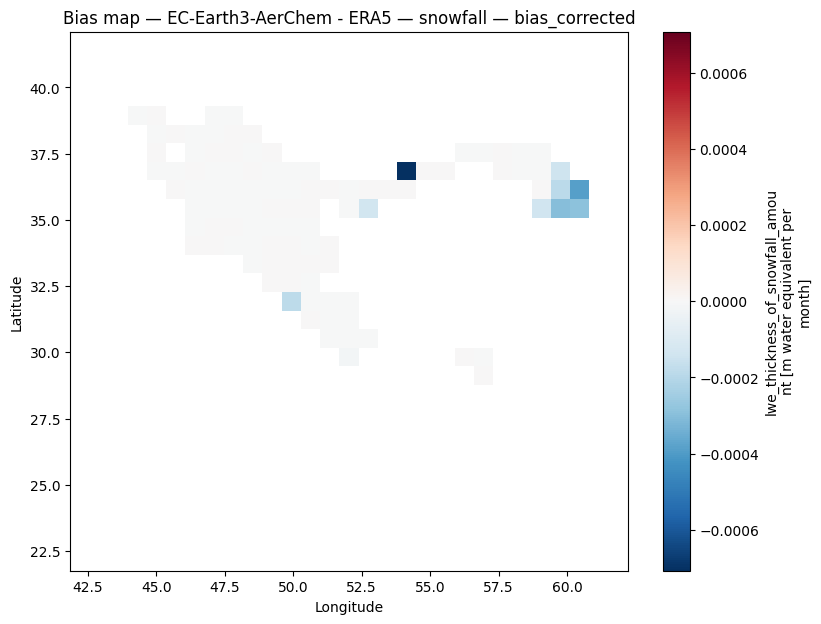

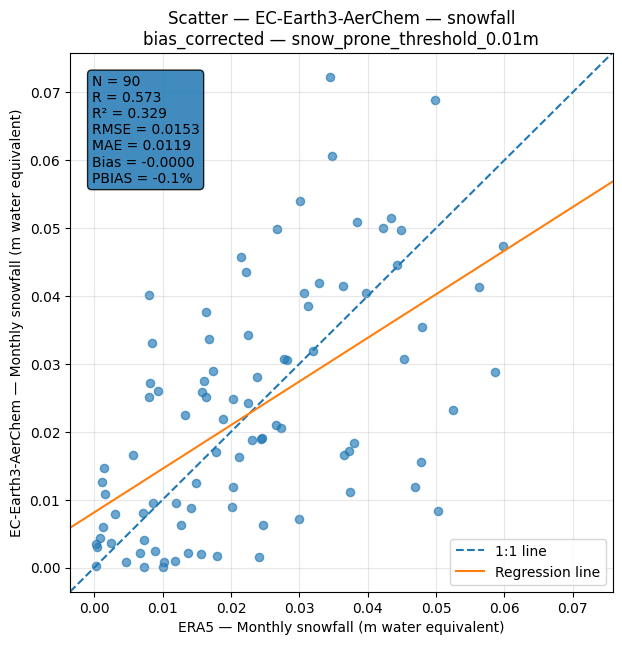

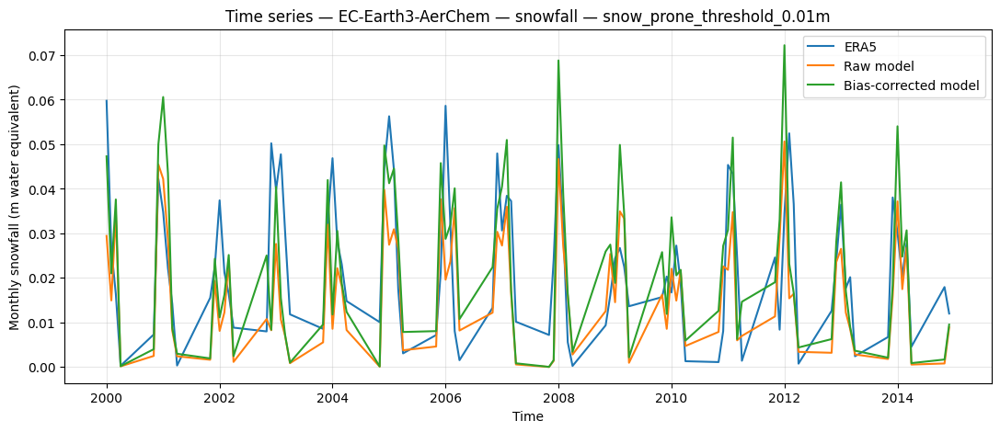

Finished: EC-Earth3-AerChem snowfall

########################################################################################################################
MODEL: GFDL-ESM4
########################################################################################################################
Iran grid cells: 128
Snow-prone grid cells: 47


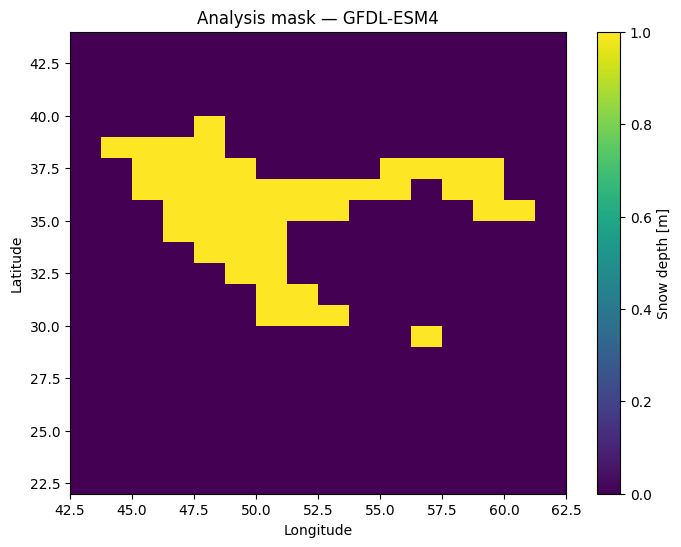


MODEL: GFDL-ESM4
VARIABLE: snow_depth
FILE: data\raw\GFDL-ESM4-Snow_Depth_Historical.nc


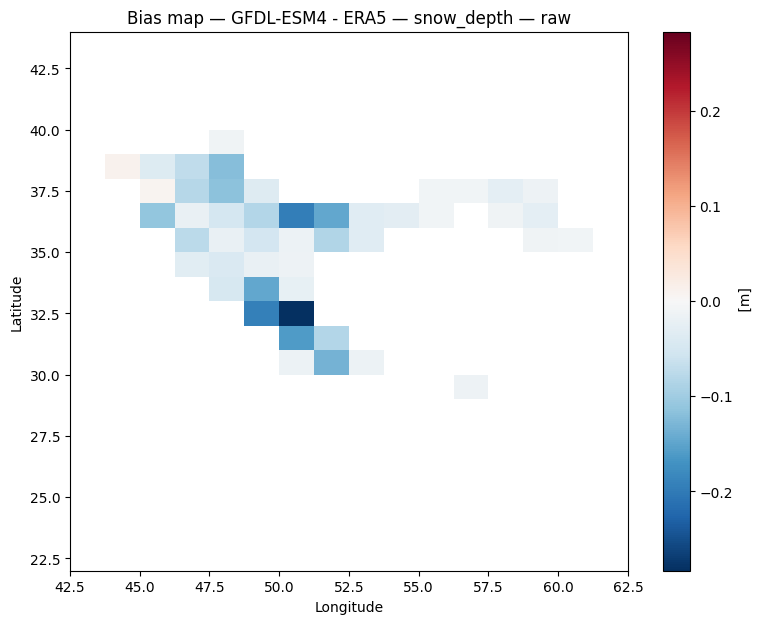

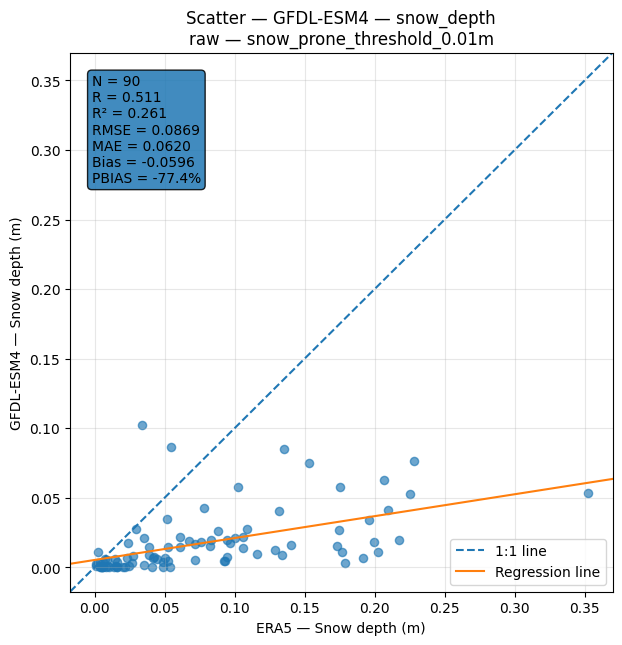

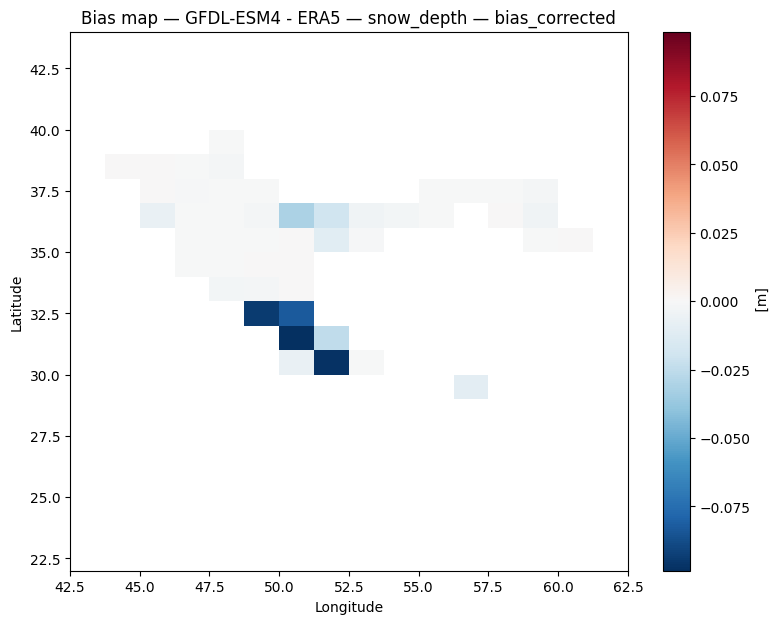

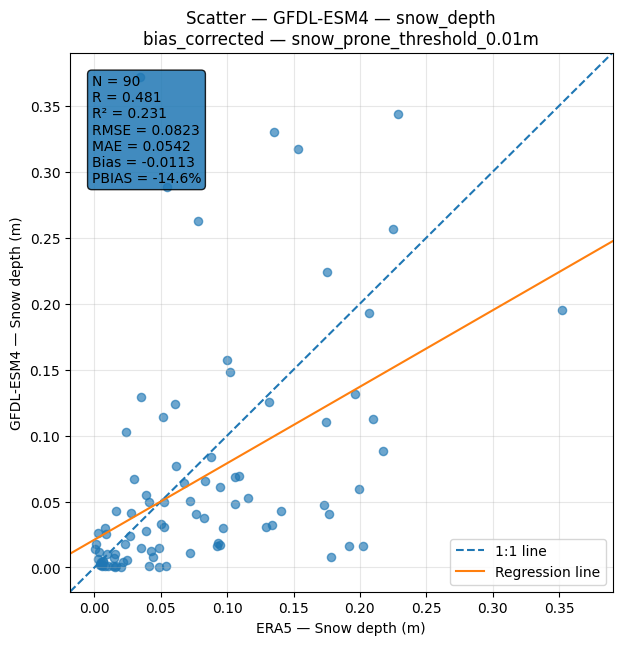

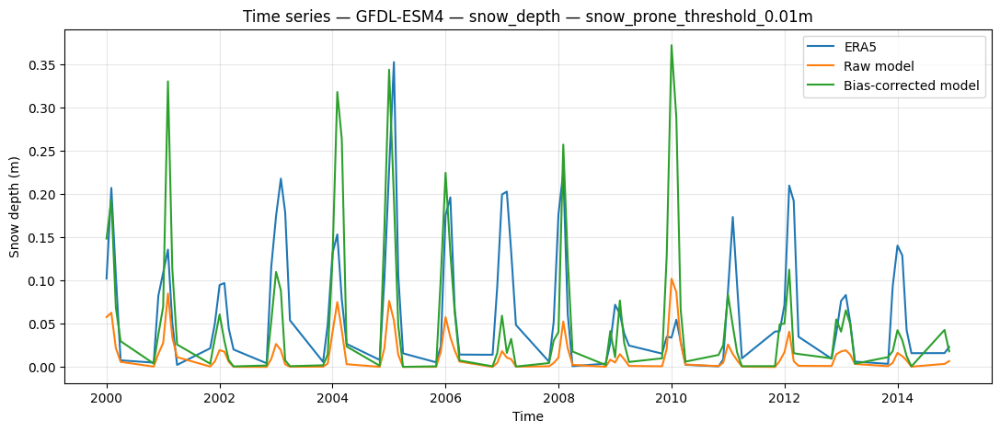

Finished: GFDL-ESM4 snow_depth

MODEL: GFDL-ESM4
VARIABLE: snowfall
FILE: data\raw\GFDL-ESM4-Snowfall_Historical.nc


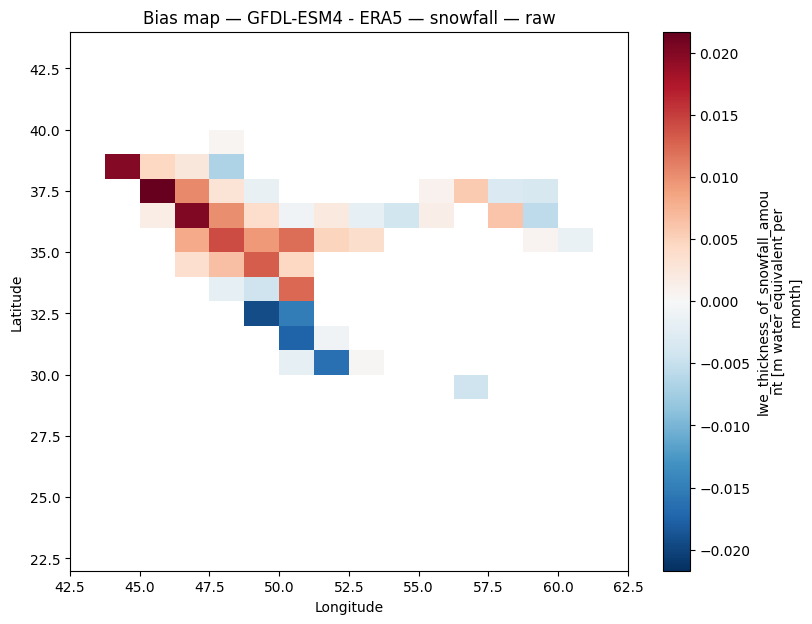

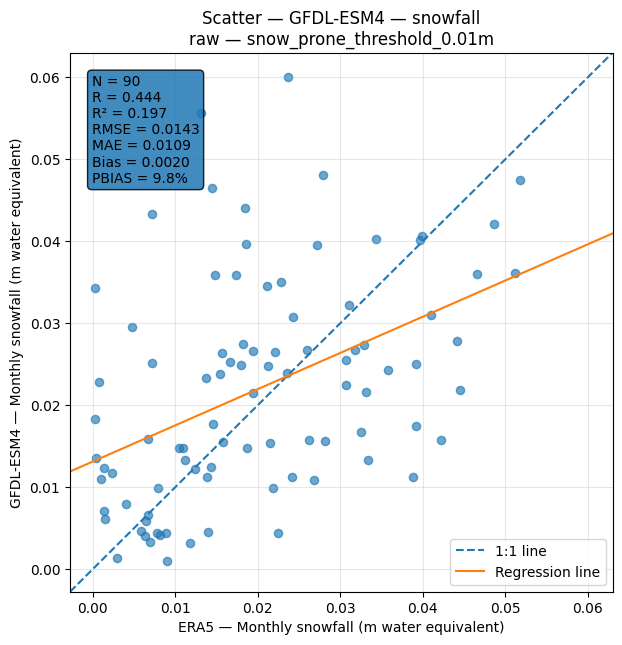

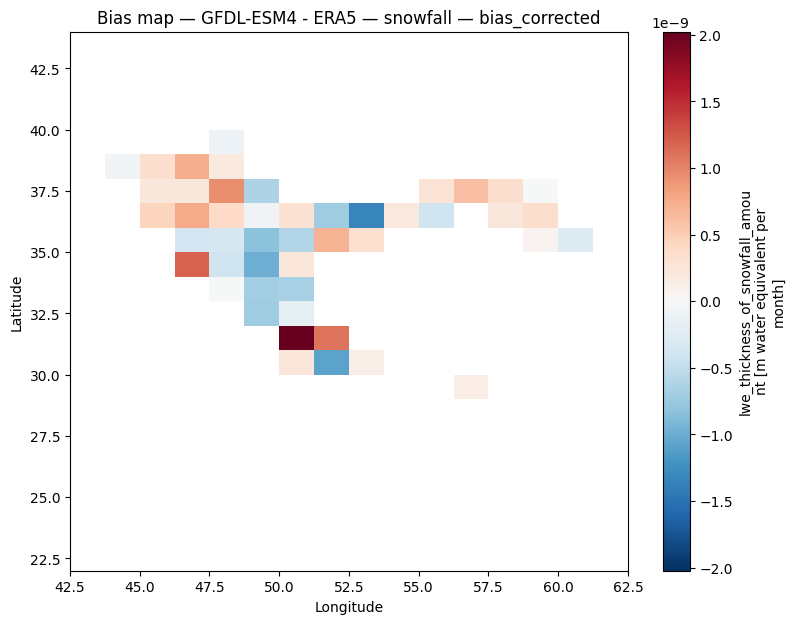

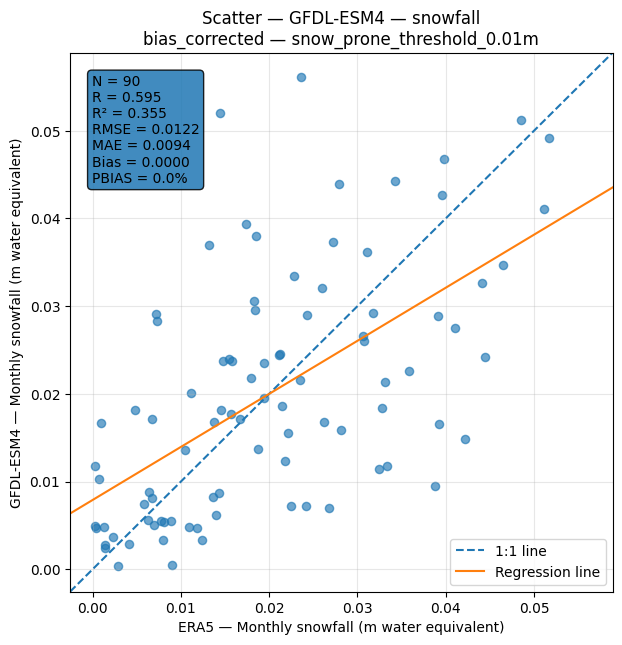

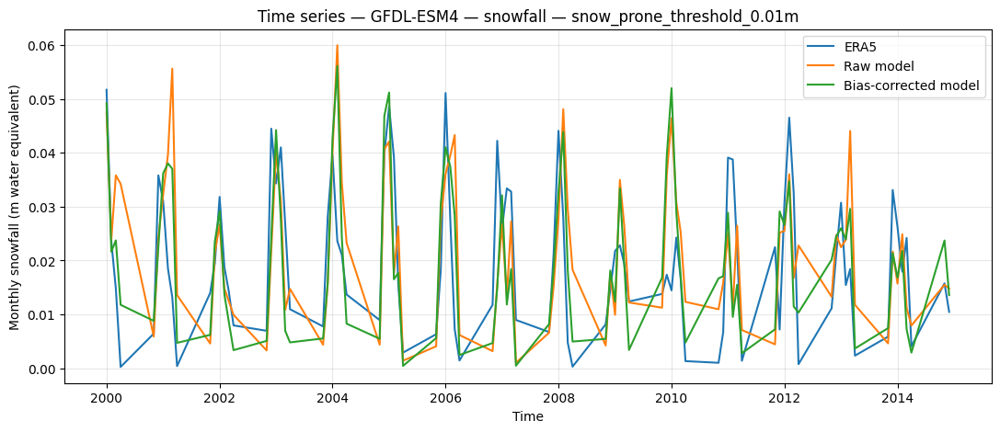

Finished: GFDL-ESM4 snowfall

########################################################################################################################
MODEL: HadGEM3-GC31-MM
########################################################################################################################
Iran grid cells: 335
Snow-prone grid cells: 113


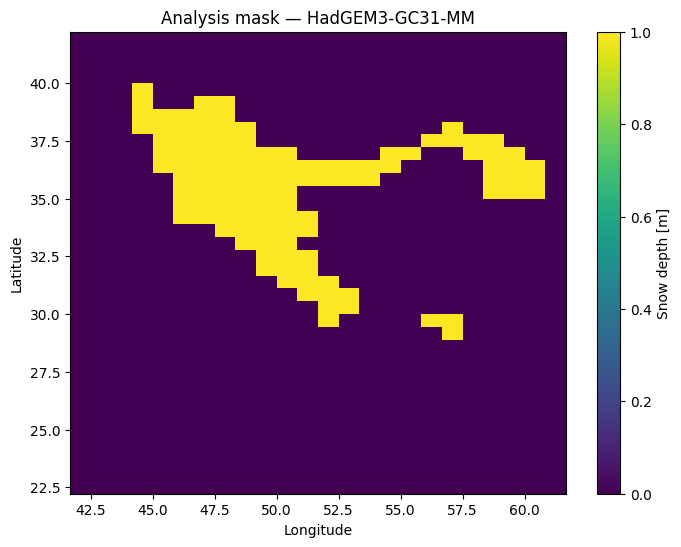


MODEL: HadGEM3-GC31-MM
VARIABLE: snowfall
FILE: data\raw\HadGEM3-GC31-MM_Snowfall flux.nc


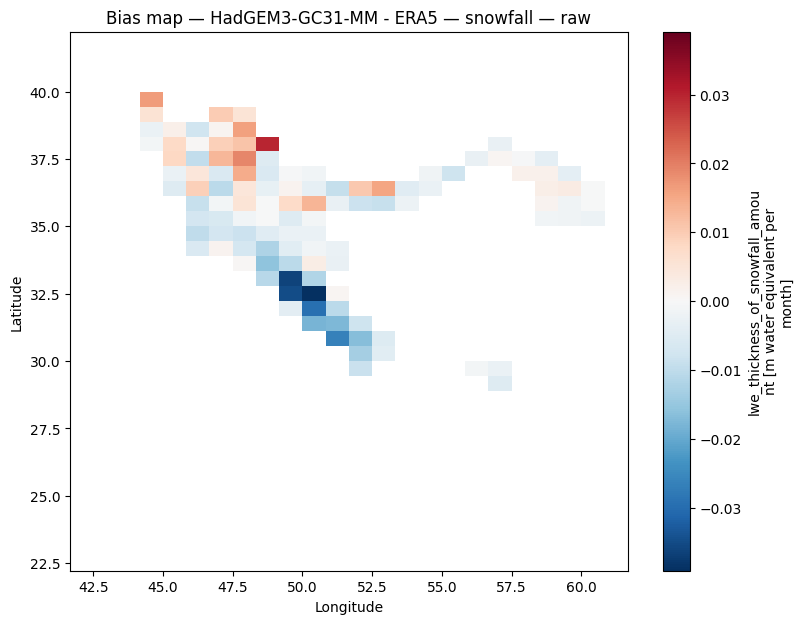

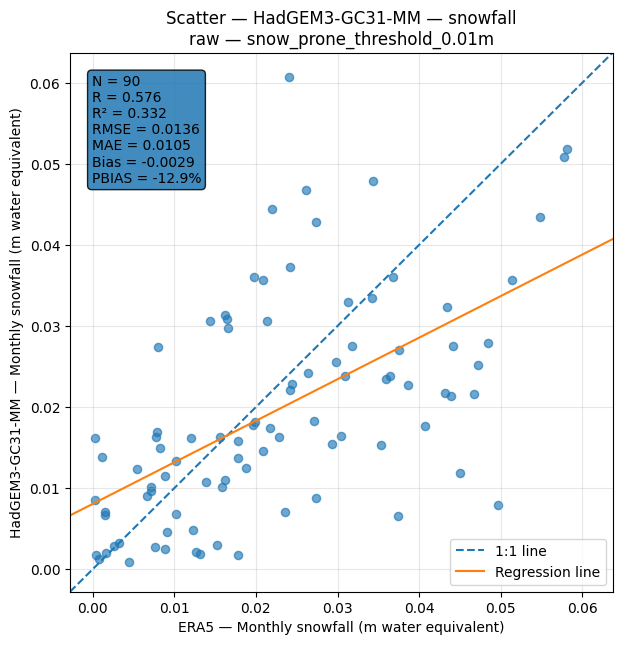

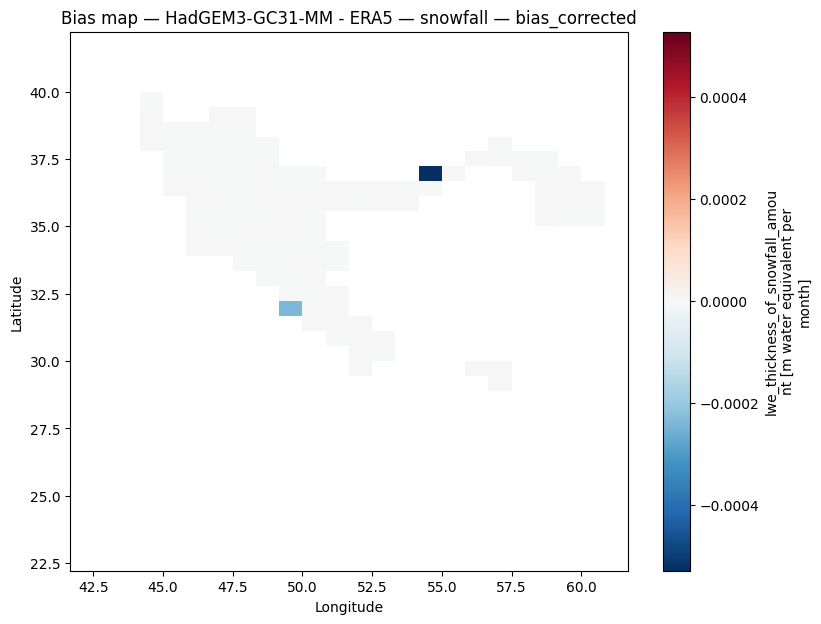

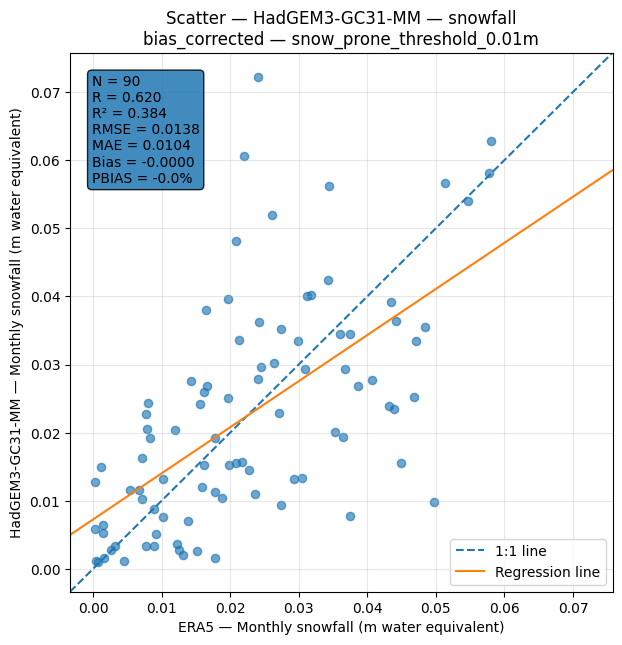

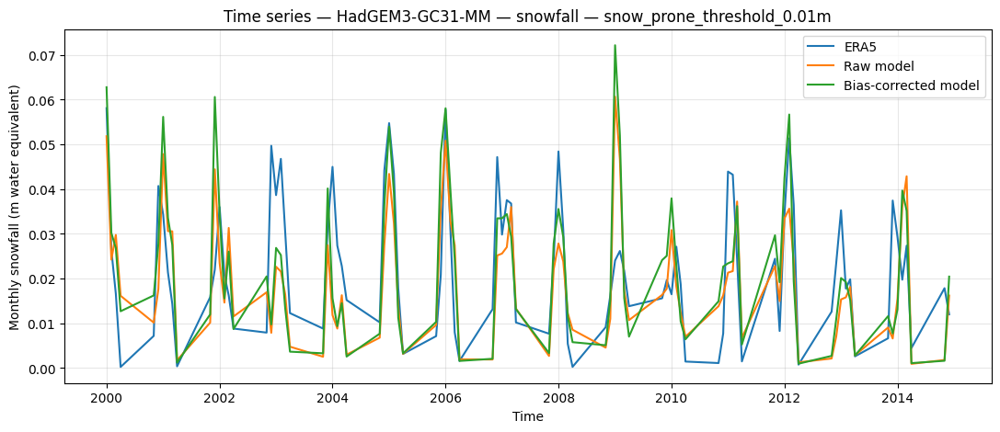

Finished: HadGEM3-GC31-MM snowfall

########################################################################################################################
MODEL: MPI-ESM1-2-HR
########################################################################################################################
Iran grid cells: 178
Snow-prone grid cells: 62


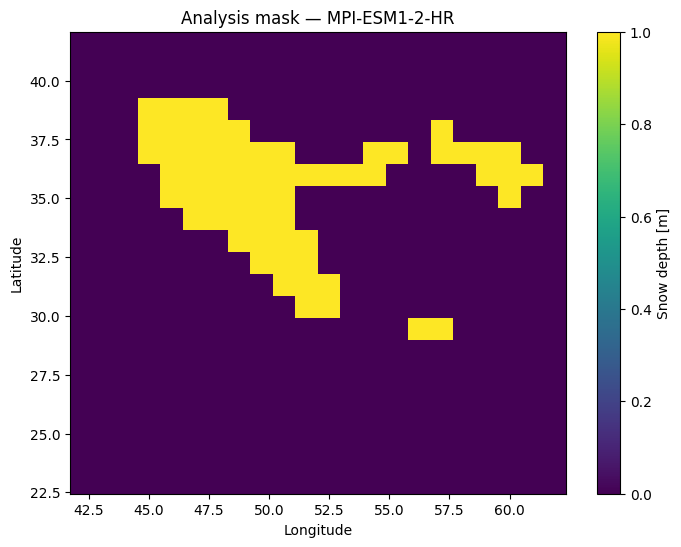


MODEL: MPI-ESM1-2-HR
VARIABLE: snowfall
FILE: data\raw\MPI-ESM1-2-HR_Snowfall flux.nc


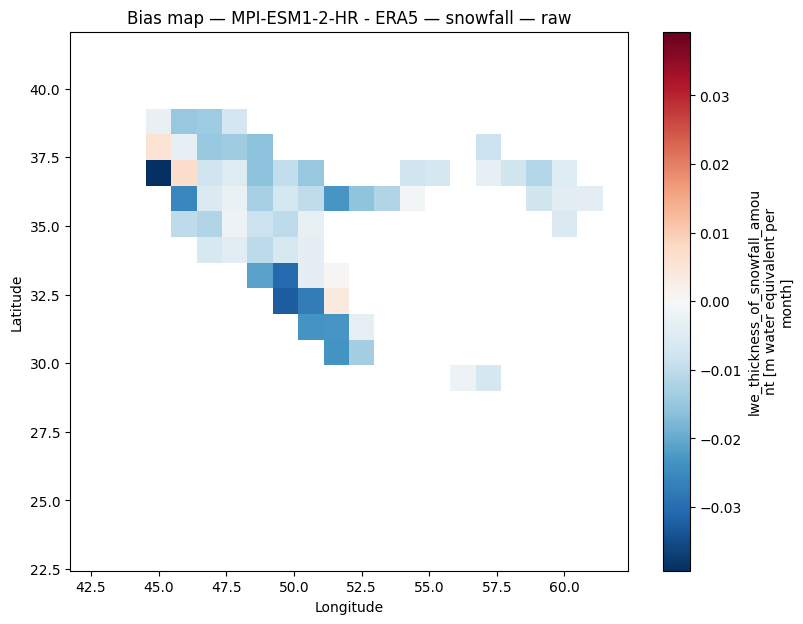

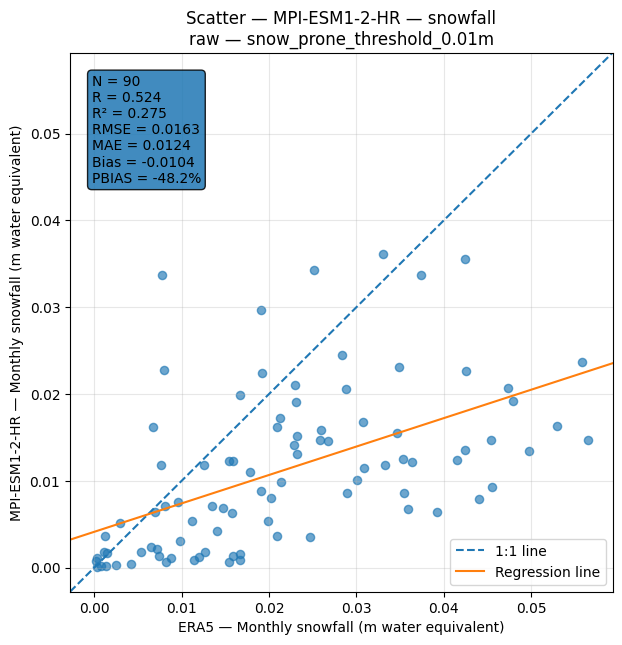

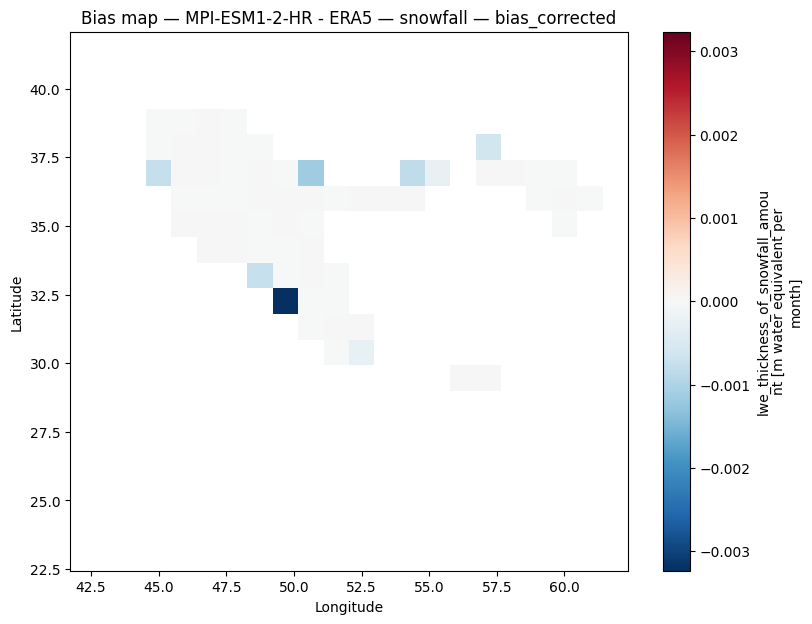

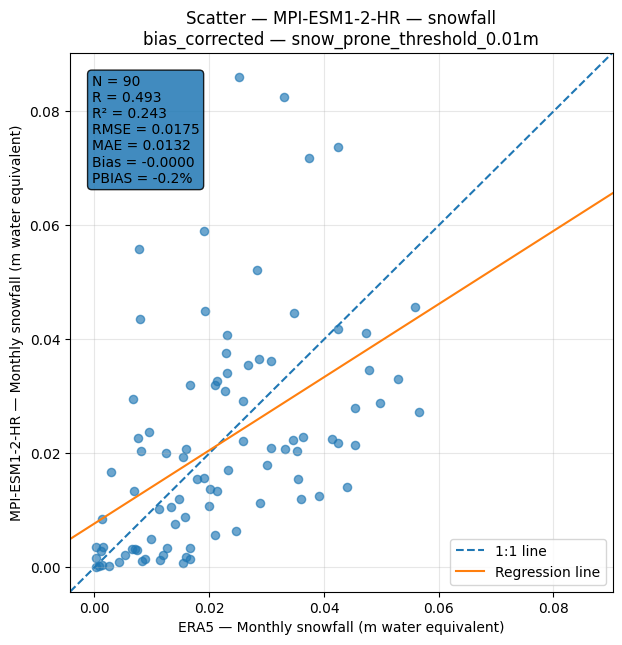

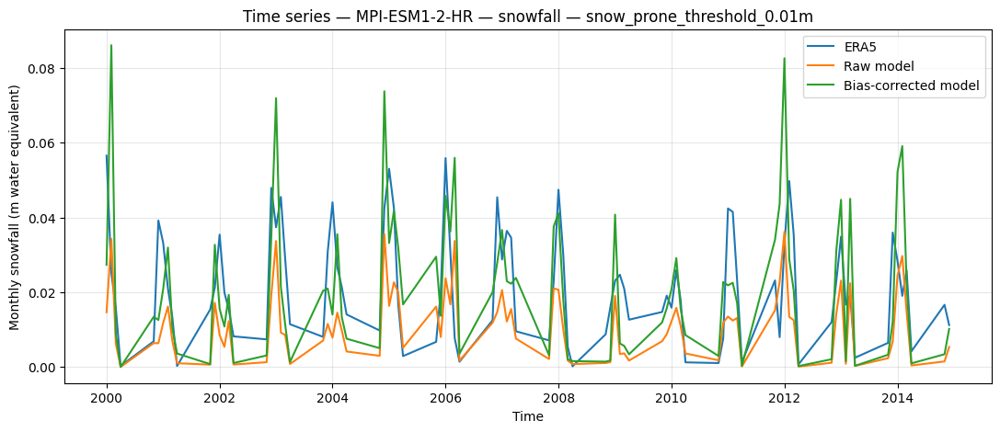

Finished: MPI-ESM1-2-HR snowfall

MODEL: MPI-ESM1-2-HR
VARIABLE: surface_snow_amount
FILE: data\raw\MPI-ESM1-2-HR_Surface snow amount.nc


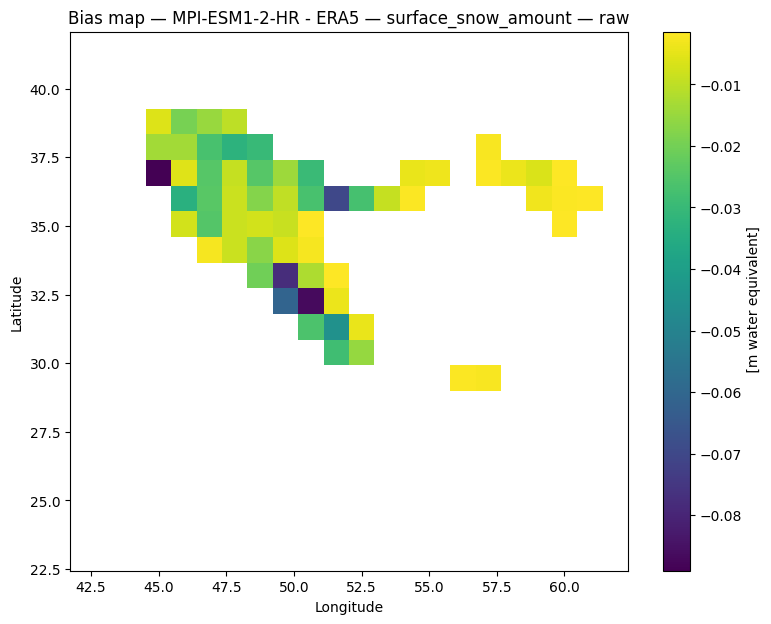

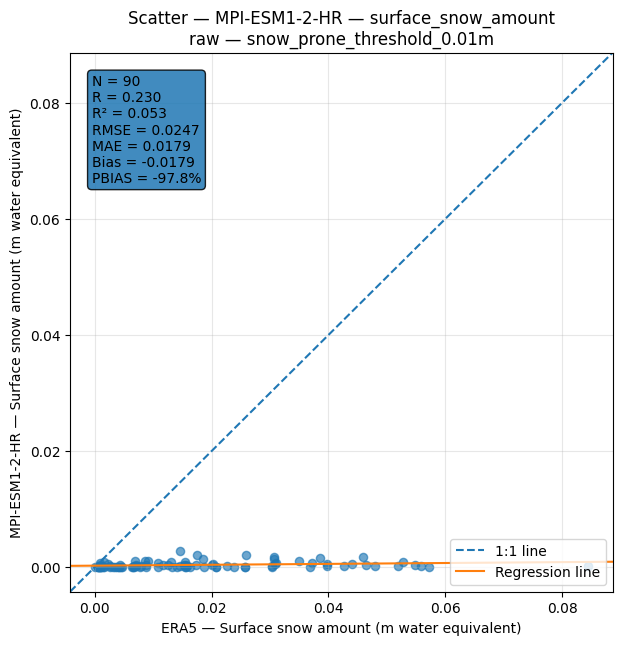

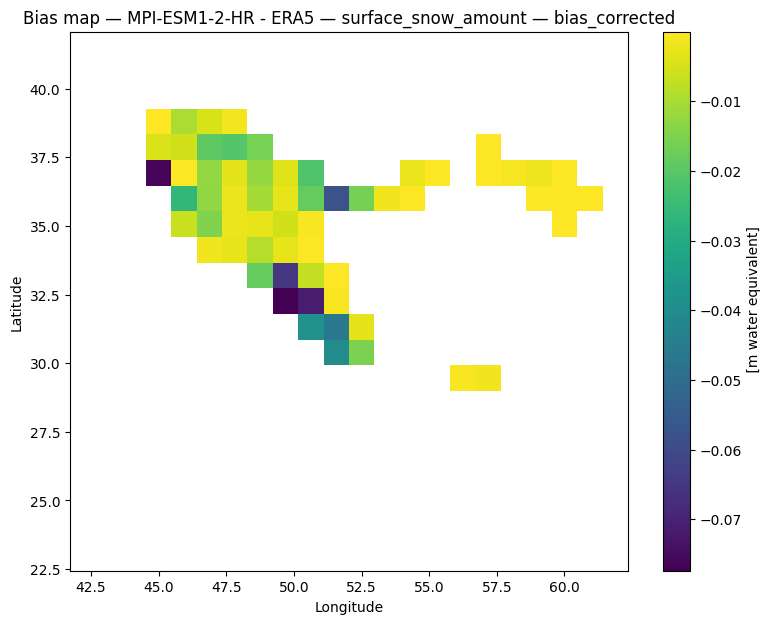

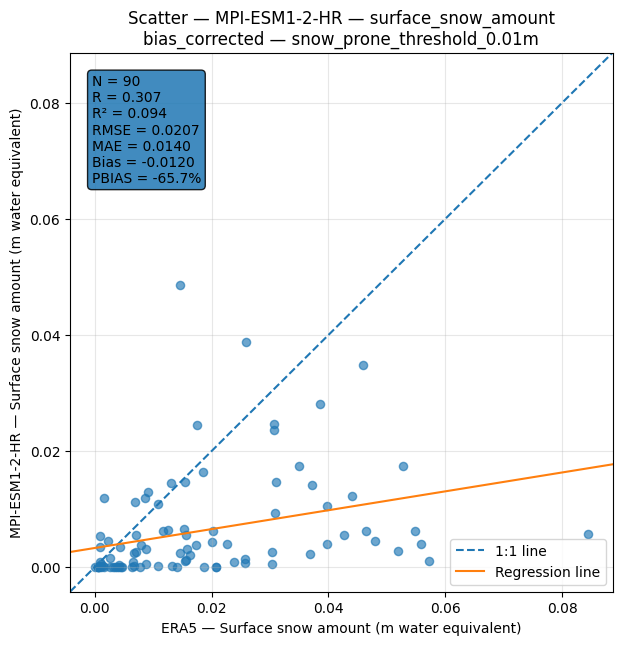

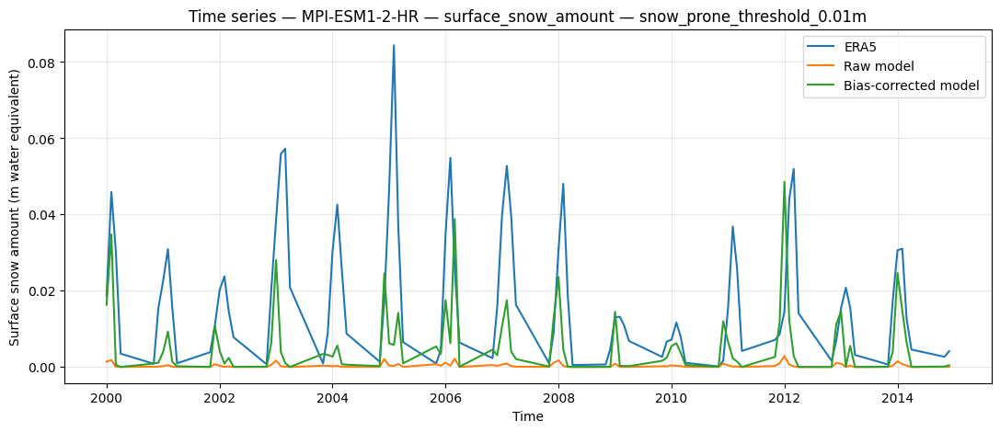

Finished: MPI-ESM1-2-HR surface_snow_amount

########################################################################################################################
MODEL: MRI-ESM2-0
########################################################################################################################
Iran grid cells: 121
Snow-prone grid cells: 44


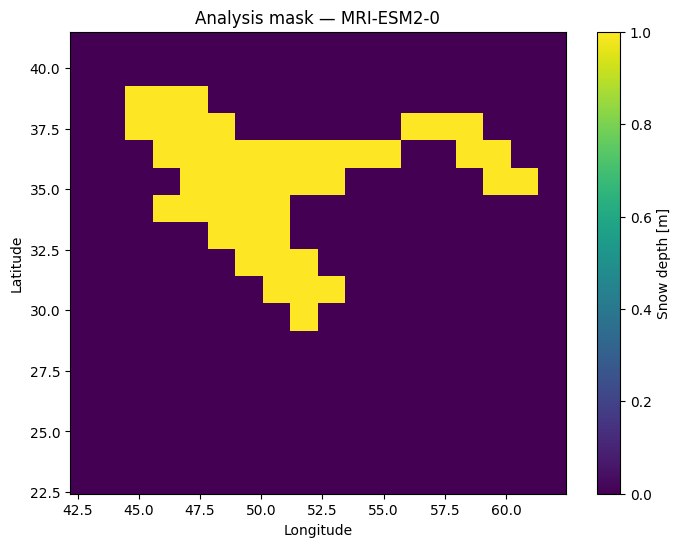


MODEL: MRI-ESM2-0
VARIABLE: snow_depth
FILE: data\raw\MRI-ESM2-0_Snow depth.nc


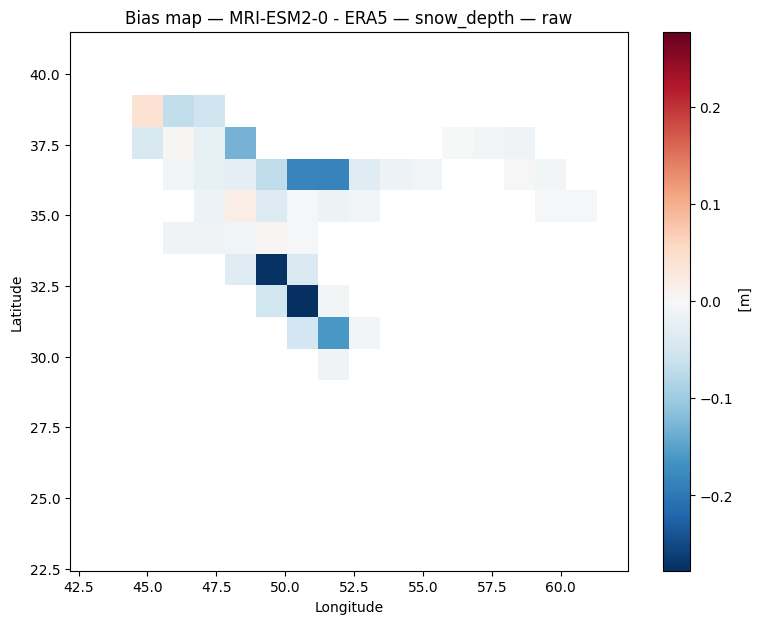

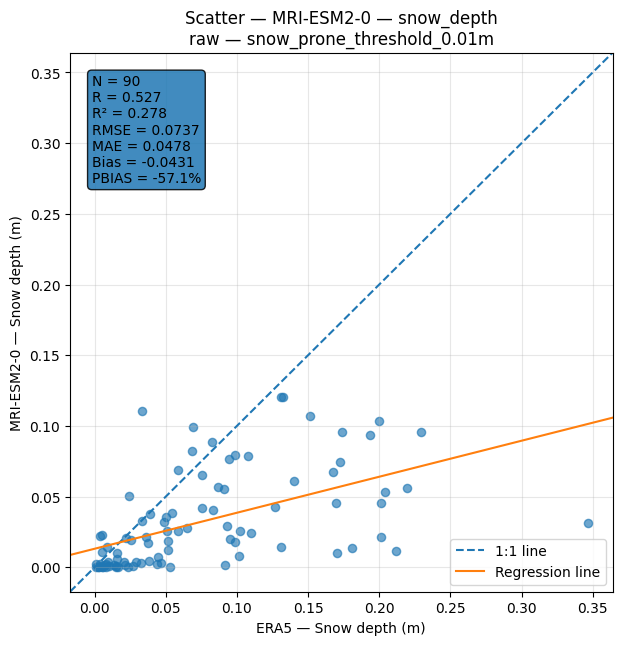

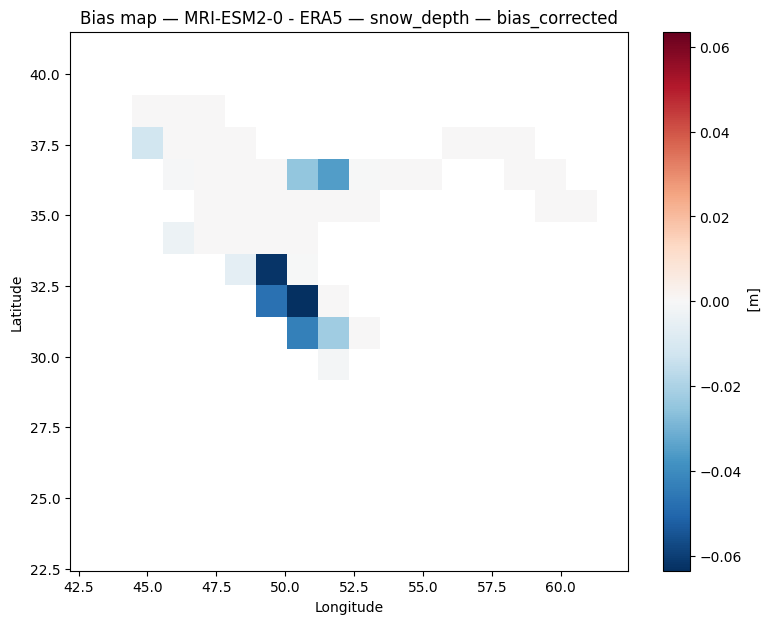

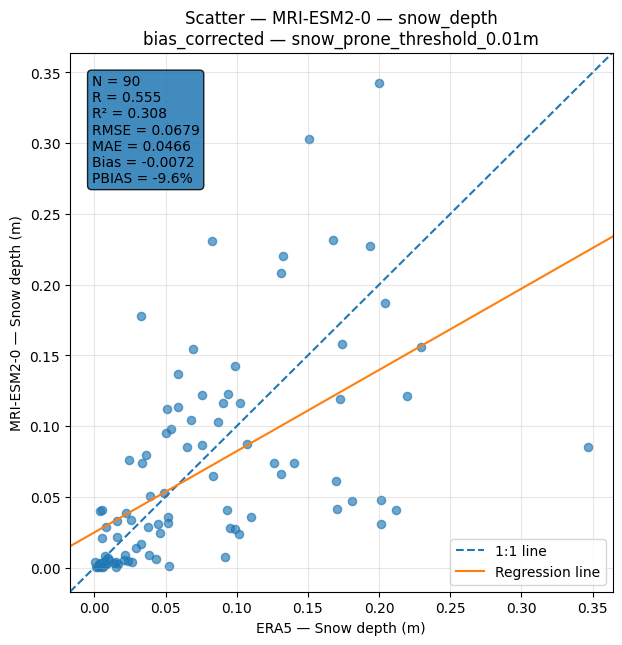

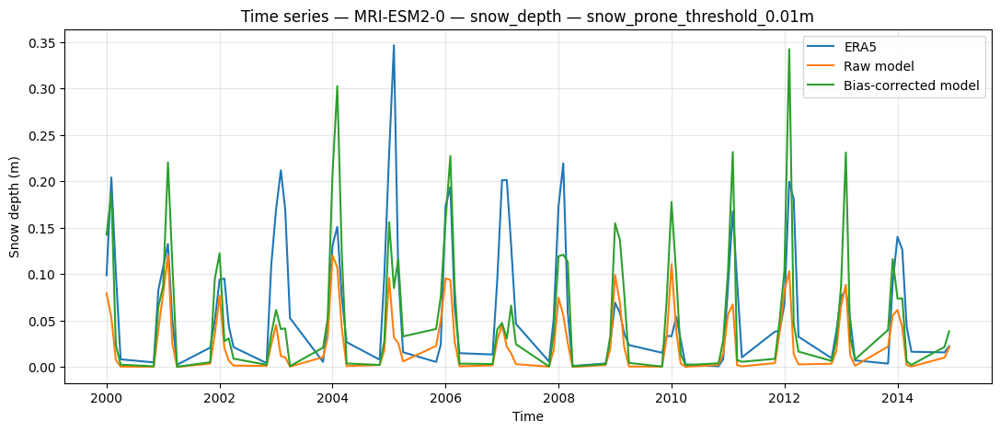

Finished: MRI-ESM2-0 snow_depth

MODEL: MRI-ESM2-0
VARIABLE: snowfall
FILE: data\raw\MRI-ESM2-0_Snowfall flux.nc


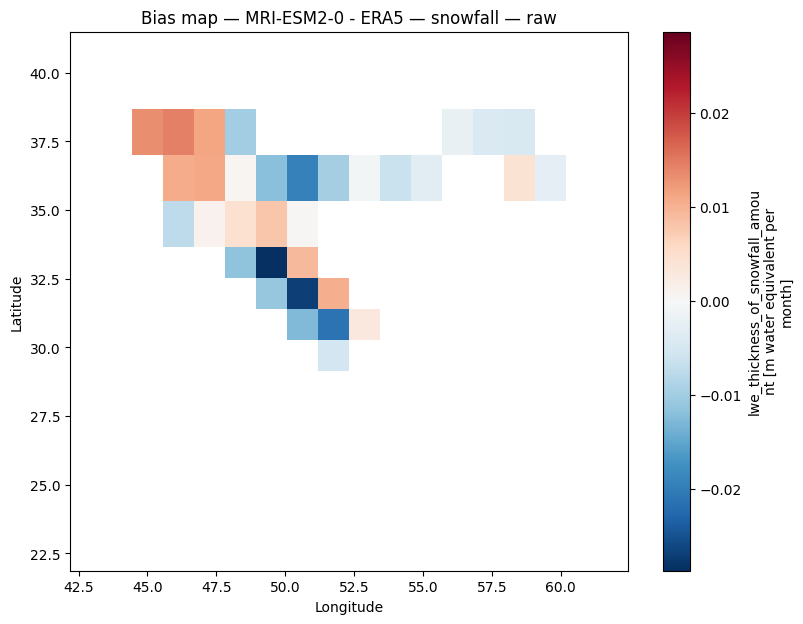

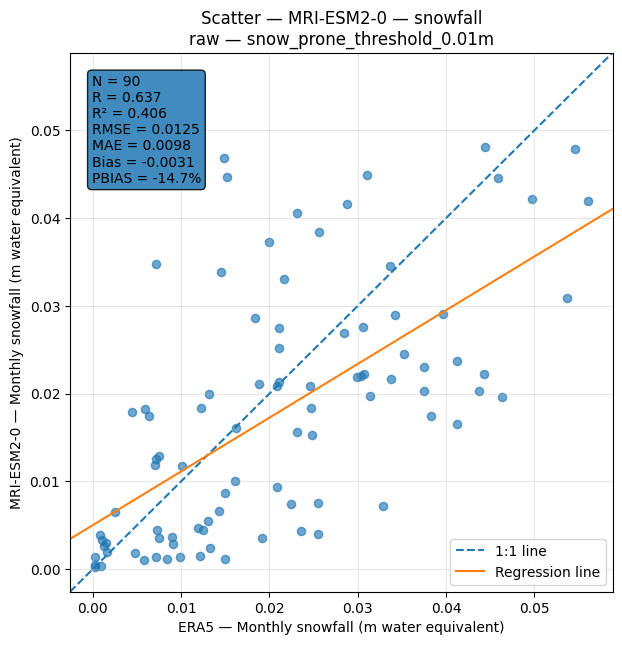

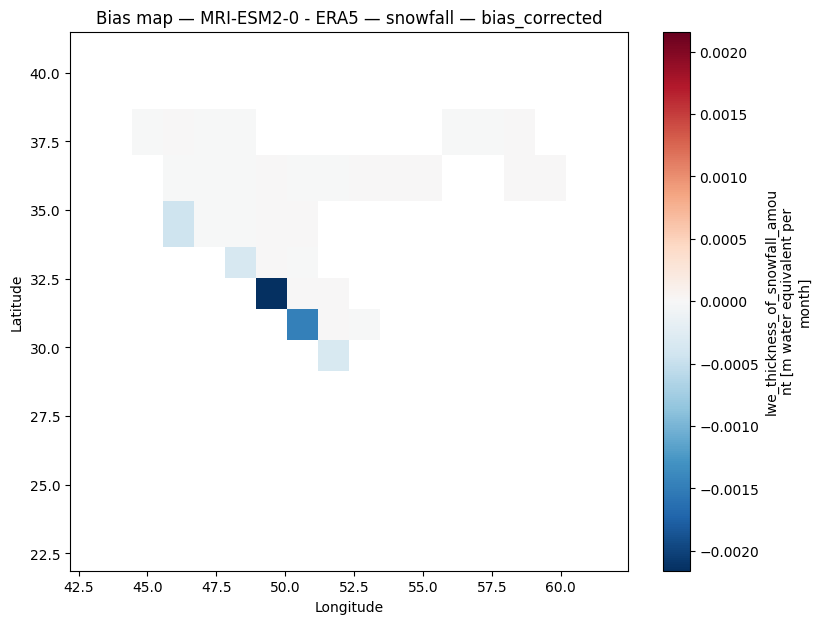

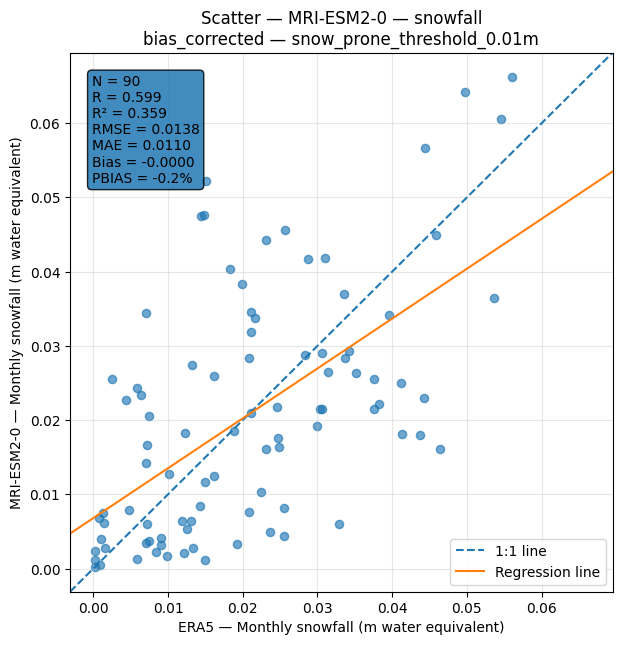

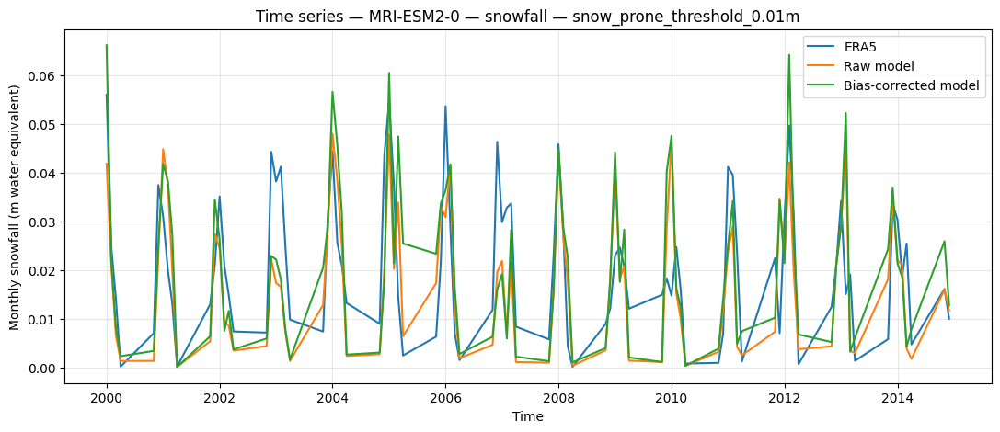

Finished: MRI-ESM2-0 snowfall

MODEL: MRI-ESM2-0
VARIABLE: surface_snow_amount
FILE: data\raw\MRI-ESM2-0_Surface snow amount.nc


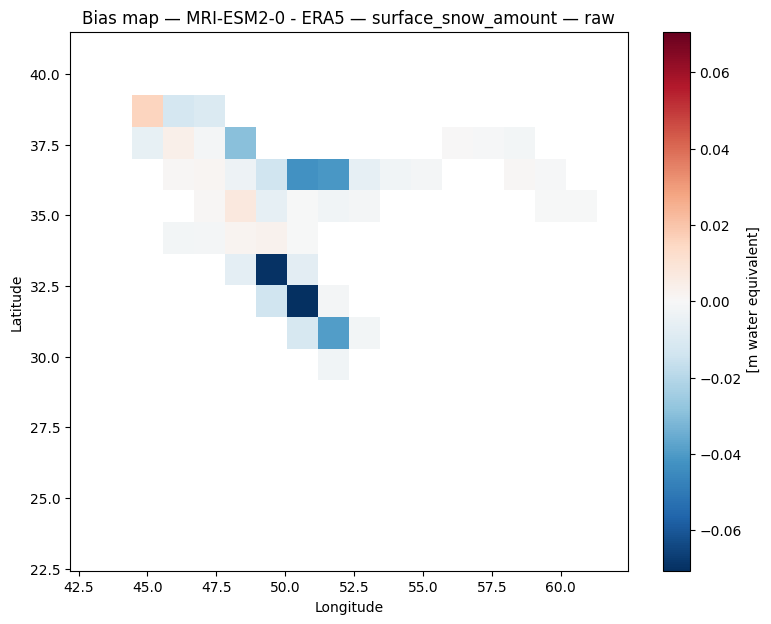

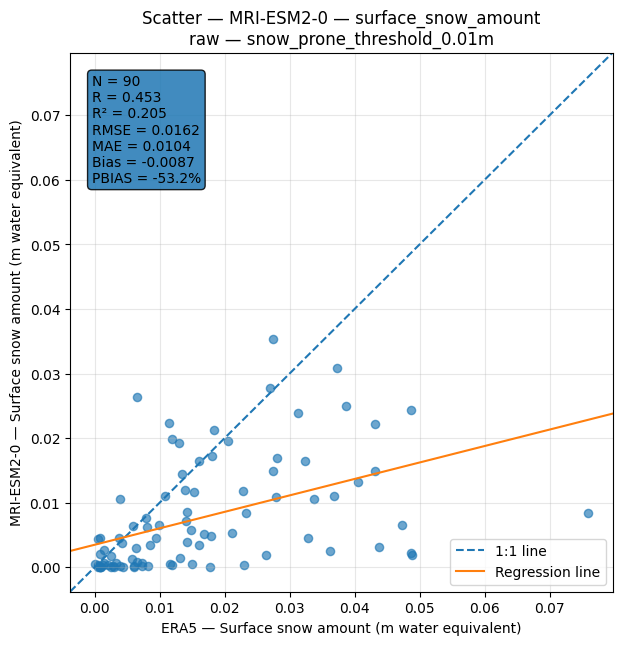

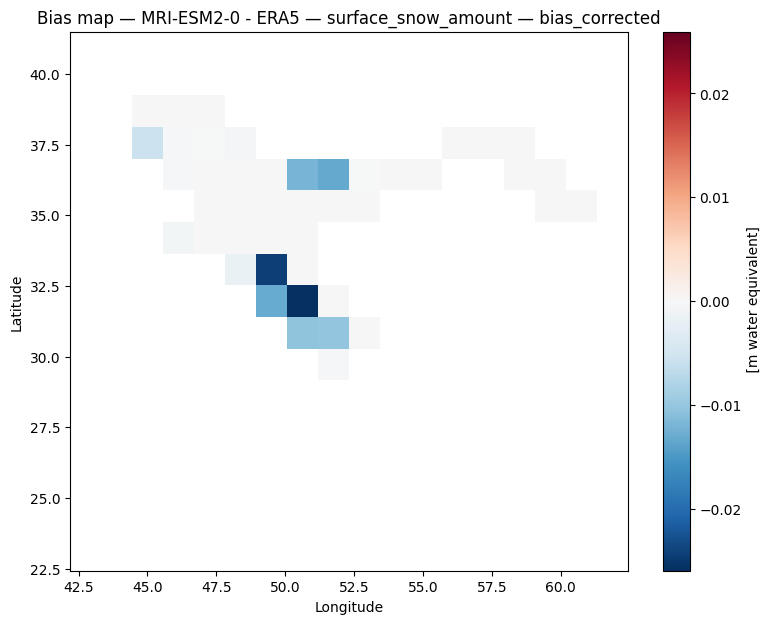

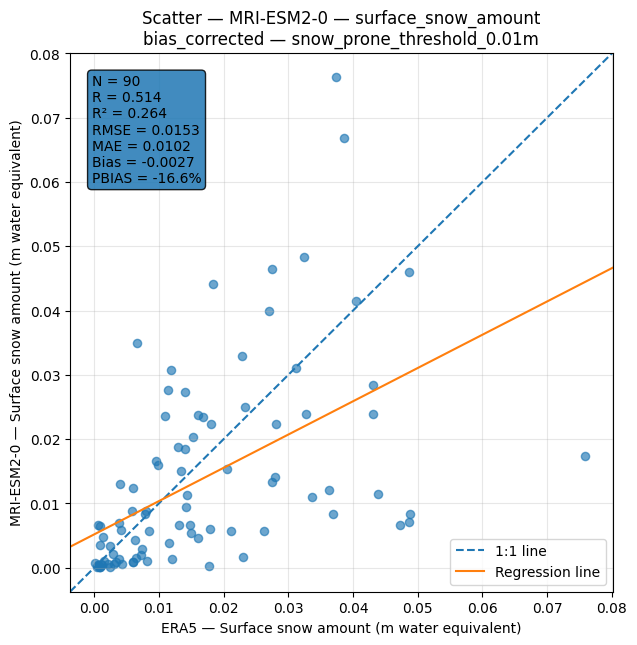

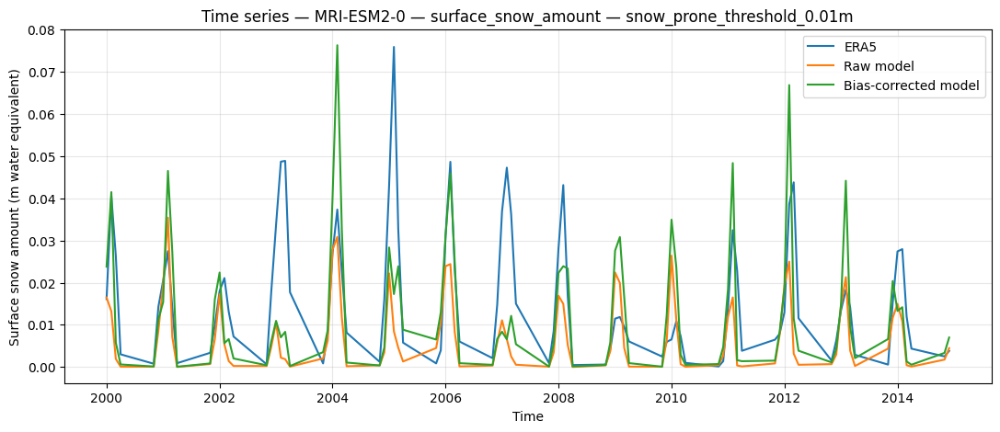

Finished: MRI-ESM2-0 surface_snow_amount

DONE.
Saved metrics:
data\processed\final_validation_metrics_raw_and_bias_corrected.csv

Saved time series:
data\processed\final_validation_timeseries_raw_and_bias_corrected.csv

Saved ranking:
data\processed\final_ranked_models_raw_and_bias_corrected.csv

Metrics preview:
                model        variable_type model_variable era5_variable  \
0       CanESM5-CanOE           snow_depth            snd           sde   
1       CanESM5-CanOE           snow_depth            snd           sde   
2       CanESM5-CanOE             snowfall           prsn            sf   
3       CanESM5-CanOE             snowfall           prsn            sf   
4       CNRM-CM6-1-HR             snowfall           prsn            sf   
5       CNRM-CM6-1-HR             snowfall           prsn            sf   
6   EC-Earth3-AerChem           snow_depth            snd           sde   
7   EC-Earth3-AerChem           snow_depth            snd           sde   
8   EC-Ea

In [23]:
# ============================================================
# FINAL CODE — ERA5 vs CMIP6 snow models
# Best-practice validation:
#   1) ERA5 -> model grid
#   2) Snow-prone regions
#   3) Snow season
#   4) Raw and monthly bias-corrected models
#   5) Time series + scatter + metrics + bias maps
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import Point
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr, linregress

# ============================================================
# 1. Paths and settings
# ============================================================

BASE_DIR = Path(".")
RAW_DIR = BASE_DIR / "data" / "raw"
OUT_DIR = BASE_DIR / "data" / "processed"
FIG_DIR = BASE_DIR / "outputs" / "figures" / "final_validation"

OUT_DIR.mkdir(parents=True, exist_ok=True)
FIG_DIR.mkdir(parents=True, exist_ok=True)

era5_final_file = OUT_DIR / "ERA5_Iran_Snow_Monthly_1950_2025_Final.nc"
iran_shp = RAW_DIR / "Iran" / "iran layer" / "IRAN.shp"

start_year = 2000
end_year = 2014

# Main scientific setting
use_snow_season_only = True
snow_season_months = [11, 12, 1, 2, 3, 4]

# Snow-prone mask threshold
# For snow depth and surface snow amount, this is based on ERA5 snow-season climatology.
snow_depth_threshold_m = 0.01  # 1 cm

# Bias correction
apply_bias_correction = True
bias_method = "monthly_mean_scaling"

# Avoid division by zero
EPS = 1e-12

# ============================================================
# 2. Model files
# ============================================================

model_files = {
    "CanESM5-CanOE": {
        "snow_depth": RAW_DIR / "CanESM5-CanOE _Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "CanESM5-CanOE _Snowfall_Historical.nc",
    },
    "CNRM-CM6-1-HR": {
        "snowfall": RAW_DIR / "CNRM-CM6-1-HR_Snowfall flux.nc",
    },
    "EC-Earth3-AerChem": {
        "snow_depth": RAW_DIR / "EC-Earth3-AerChem_Snow depth.nc",
        "snowfall": RAW_DIR / "EC-Earth3-AerChem_Snowfall flux.nc",
    },
    "GFDL-ESM4": {
        "snow_depth": RAW_DIR / "GFDL-ESM4-Snow_Depth_Historical.nc",
        "snowfall": RAW_DIR / "GFDL-ESM4-Snowfall_Historical.nc",
    },
    "HadGEM3-GC31-MM": {
        "snowfall": RAW_DIR / "HadGEM3-GC31-MM_Snowfall flux.nc",
    },
    "MPI-ESM1-2-HR": {
        "snowfall": RAW_DIR / "MPI-ESM1-2-HR_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MPI-ESM1-2-HR_Surface snow amount.nc",
    },
    "MRI-ESM2-0": {
        "snow_depth": RAW_DIR / "MRI-ESM2-0_Snow depth.nc",
        "snowfall": RAW_DIR / "MRI-ESM2-0_Snowfall flux.nc",
        "surface_snow_amount": RAW_DIR / "MRI-ESM2-0_Surface snow amount.nc",
    },
}

model_var_map = {
    "snow_depth": "snd",
    "surface_snow_amount": "snw",
    "snowfall": "prsn",
}

era5_var_map = {
    "snow_depth": "sde",
    "surface_snow_amount": "sd",
    "snowfall": "sf",
}

# ============================================================
# 3. Load ERA5 and Iran shapefile
# ============================================================

ds_era5 = xr.open_dataset(era5_final_file)

iran = gpd.read_file(iran_shp)
if iran.crs is None:
    iran = iran.set_crs("EPSG:4326")
else:
    iran = iran.to_crs("EPSG:4326")

print("ERA5 loaded:")
print(ds_era5)

# ============================================================
# 4. Helper functions
# ============================================================

def safe_name(text):
    return (
        str(text)
        .replace(" ", "_")
        .replace("/", "_")
        .replace("\\", "_")
        .replace(":", "_")
        .replace("-", "_")
        .replace(".", "_")
    )


def standardize_model_dataset(ds):
    rename_dict = {}

    if "lat" in ds.coords or "lat" in ds.dims:
        rename_dict["lat"] = "latitude"
    if "lon" in ds.coords or "lon" in ds.dims:
        rename_dict["lon"] = "longitude"
    if "valid_time" in ds.coords or "valid_time" in ds.dims:
        rename_dict["valid_time"] = "time"

    if rename_dict:
        ds = ds.rename(rename_dict)

    if "longitude" in ds.coords and float(ds.longitude.max()) > 180:
        ds = ds.assign_coords(
            longitude=(((ds.longitude + 180) % 360) - 180)
        )

    if "latitude" in ds.coords:
        ds = ds.sortby("latitude")

    if "longitude" in ds.coords:
        ds = ds.sortby("longitude")

    return ds


def select_period(da, start_year=2000, end_year=2014):
    return da.where(
        (da.time.dt.year >= start_year) &
        (da.time.dt.year <= end_year),
        drop=True
    )


def assign_month_index(da):
    years = da.time.dt.year.values
    months = da.time.dt.month.values

    new_time = pd.to_datetime([
        f"{int(y):04d}-{int(m):02d}-01"
        for y, m in zip(years, months)
    ])

    return da.assign_coords(time=new_time)


def convert_model_units(da, variable_type):
    """
    Converts model variables to ERA5-compatible units.

    snow_depth:
        snd, m -> m
    surface_snow_amount:
        snw, kg m-2 -> m water equivalent
    snowfall:
        prsn, kg m-2 s-1 -> monthly m water equivalent
    """

    units_original = da.attrs.get("units", "")
    units = units_original.lower().replace(" ", "").replace("^", "**")

    out = da.copy()

    if variable_type == "snow_depth":
        out.attrs["units"] = "m"
        out.attrs["conversion_note"] = "No conversion; snd is already m."
        return out

    if variable_type == "surface_snow_amount":
        if units in ["kgm-2", "kg/m2", "kgm**-2"]:
            out = out / 1000.0
        out.attrs["units"] = "m water equivalent"
        out.attrs["conversion_note"] = "snw converted from kg m-2 to m water equivalent by dividing by 1000."
        return out

    if variable_type == "snowfall":
        if units in ["kgm-2s-1", "kg/m2/s", "kgm**-2s**-1"]:
            seconds_per_month = out.time.dt.days_in_month * 24 * 3600
            out = out * seconds_per_month / 1000.0
        out.attrs["units"] = "m water equivalent per month"
        out.attrs["conversion_note"] = "prsn converted from kg m-2 s-1 to monthly m water equivalent."
        return out

    return out


def prepare_era5_variable(da, variable_type):
    """
    Prepares ERA5 variable.

    Important:
    ERA5 sf in monthly means is treated as daily-equivalent accumulation,
    so for monthly total snowfall we multiply by days_in_month.
    """

    out = da.copy()

    if variable_type == "snowfall":
        out = out * out.time.dt.days_in_month
        out.attrs["units"] = "m water equivalent per month"
        out.attrs["conversion_note"] = "ERA5 sf multiplied by days_in_month to estimate monthly total."
    elif variable_type == "snow_depth":
        out.attrs["units"] = "m"
        out.attrs["conversion_note"] = "ERA5 sde used as snow depth in m."
    elif variable_type == "surface_snow_amount":
        out.attrs["units"] = "m water equivalent"
        out.attrs["conversion_note"] = "ERA5 sd used as m water equivalent."

    return out


def create_mask_on_grid(lats, lons, country_gdf):
    lon2d, lat2d = np.meshgrid(lons, lats)

    points = gpd.GeoDataFrame(
        geometry=[Point(x, y) for x, y in zip(lon2d.ravel(), lat2d.ravel())],
        crs="EPSG:4326"
    )

    country_polygon = country_gdf.geometry.union_all()
    mask_flat = points.within(country_polygon).values
    mask_2d = mask_flat.reshape(lat2d.shape)

    return xr.DataArray(
        mask_2d,
        coords={"latitude": lats, "longitude": lons},
        dims=("latitude", "longitude"),
        name="iran_mask"
    )


def area_weighted_mean(da, mask):
    weights = np.cos(np.deg2rad(da.latitude))
    weights.name = "weights"

    return da.where(mask).weighted(weights).mean(
        dim=("latitude", "longitude"),
        skipna=True
    )


def calculate_metrics(obs, sim):
    df = pd.DataFrame({
        "ERA5": obs.values,
        "Model": sim.values
    }).replace([np.inf, -np.inf], np.nan).dropna()

    if len(df) < 3:
        return {
            "n": len(df),
            "bias": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "corr": np.nan,
            "r2": np.nan,
            "pbias": np.nan,
            "slope": np.nan,
            "intercept": np.nan
        }

    x = df["ERA5"].values
    y = df["Model"].values

    bias = float(np.mean(y - x))
    mae = float(mean_absolute_error(x, y))
    rmse = float(np.sqrt(mean_squared_error(x, y)))

    if np.std(x) == 0 or np.std(y) == 0:
        corr = np.nan
        r2 = np.nan
        slope = np.nan
        intercept = np.nan
    else:
        corr = float(pearsonr(x, y)[0])
        r2 = float(corr ** 2)
        reg = linregress(x, y)
        slope = float(reg.slope)
        intercept = float(reg.intercept)

    if np.sum(x) != 0:
        pbias = float(100 * (np.sum(y) - np.sum(x)) / np.sum(x))
    else:
        pbias = np.nan

    return {
        "n": int(len(df)),
        "bias": bias,
        "mae": mae,
        "rmse": rmse,
        "corr": corr,
        "r2": r2,
        "pbias": pbias,
        "slope": slope,
        "intercept": intercept
    }


def get_bounds_from_centers(values):
    values = np.asarray(values)
    values = np.sort(values)

    mid = (values[:-1] + values[1:]) / 2

    first = values[0] - (mid[0] - values[0])
    last = values[-1] + (values[-1] - mid[-1])

    bounds = np.zeros((len(values), 2))
    bounds[0, 0] = first
    bounds[0, 1] = mid[0]

    for i in range(1, len(values) - 1):
        bounds[i, 0] = mid[i - 1]
        bounds[i, 1] = mid[i]

    bounds[-1, 0] = mid[-1]
    bounds[-1, 1] = last

    return bounds


def get_model_bounds(ds_model):
    """
    Handles:
    lat_bnds(lat,bnds)
    lat_bnds(time,lat,bnds)
    lon_bnds(lon,bnds)
    lon_bnds(time,lon,bnds)
    """

    if "lat_bnds" in ds_model:
        lat_bnds = ds_model["lat_bnds"]
        if "time" in lat_bnds.dims:
            lat_bnds = lat_bnds.isel(time=0)
        lat_bnds = lat_bnds.values
    elif "latitude_bnds" in ds_model:
        lat_bnds = ds_model["latitude_bnds"]
        if "time" in lat_bnds.dims:
            lat_bnds = lat_bnds.isel(time=0)
        lat_bnds = lat_bnds.values
    else:
        lat_bnds = get_bounds_from_centers(ds_model.latitude.values)

    if "lon_bnds" in ds_model:
        lon_bnds = ds_model["lon_bnds"]
        if "time" in lon_bnds.dims:
            lon_bnds = lon_bnds.isel(time=0)
        lon_bnds = lon_bnds.values
    elif "longitude_bnds" in ds_model:
        lon_bnds = ds_model["longitude_bnds"]
        if "time" in lon_bnds.dims:
            lon_bnds = lon_bnds.isel(time=0)
        lon_bnds = lon_bnds.values
    else:
        lon_bnds = get_bounds_from_centers(ds_model.longitude.values)

    return lat_bnds, lon_bnds


def aggregate_era5_to_model_grid(era_da, ds_model):
    """
    Area-weighted aggregation of ERA5 to model grid using model cell bounds.
    """

    model_lats = ds_model.latitude.values
    model_lons = ds_model.longitude.values

    lat_bnds, lon_bnds = get_model_bounds(ds_model)

    out = np.full(
        (era_da.sizes["time"], len(model_lats), len(model_lons)),
        np.nan,
        dtype=np.float32
    )

    for i in range(len(model_lats)):

        lat_min = np.nanmin(lat_bnds[i])
        lat_max = np.nanmax(lat_bnds[i])

        lat_mask = (era_da.latitude >= lat_min) & (era_da.latitude <= lat_max)

        for j in range(len(model_lons)):

            lon_min = np.nanmin(lon_bnds[j])
            lon_max = np.nanmax(lon_bnds[j])

            lon_mask = (era_da.longitude >= lon_min) & (era_da.longitude <= lon_max)

            subset = era_da.where(lat_mask & lon_mask, drop=True)

            if subset.sizes.get("latitude", 0) == 0 or subset.sizes.get("longitude", 0) == 0:
                continue

            weights = np.cos(np.deg2rad(subset.latitude))
            weights.name = "weights"

            cell_mean = subset.weighted(weights).mean(
                dim=("latitude", "longitude"),
                skipna=True
            )

            out[:, i, j] = cell_mean.values.astype(np.float32)

    out_da = xr.DataArray(
        out,
        coords={
            "time": era_da.time,
            "latitude": model_lats,
            "longitude": model_lons
        },
        dims=("time", "latitude", "longitude"),
        name=era_da.name
    )

    out_da.attrs.update(era_da.attrs)
    out_da.attrs["regridding_method"] = "ERA5 aggregated to model grid using model cell bounds"

    return out_da


def create_snow_prone_mask(era_on_model_sde, iran_mask_model, threshold_m=0.01):
    """
    Creates snow-prone region mask based on ERA5 snow-depth climatology.
    """

    era_sde_snow_season = era_on_model_sde.where(
        era_on_model_sde.time.dt.month.isin(snow_season_months),
        drop=True
    )

    snow_climatology = era_sde_snow_season.mean(dim="time", skipna=True)

    snow_prone_mask = (snow_climatology > threshold_m) & iran_mask_model
    snow_prone_mask.name = "snow_prone_mask"

    return snow_prone_mask, snow_climatology


def monthly_mean_scaling(model_da, era_da, mask):
    """
    Monthly mean scaling bias correction:
    corrected_model(month) = model(month) * mean_ERA5(month) / mean_model(month)

    Factor is calculated spatially for each grid cell and each calendar month.
    """

    corrected_list = []
    factor_list = []

    for m in range(1, 13):

        model_m = model_da.where(model_da.time.dt.month == m, drop=True)
        era_m = era_da.where(era_da.time.dt.month == m, drop=True)

        model_clim = model_m.where(mask).mean(dim="time", skipna=True)
        era_clim = era_m.where(mask).mean(dim="time", skipna=True)

        factor = era_clim / xr.where(np.abs(model_clim) < EPS, np.nan, model_clim)

        # Avoid unrealistic factors caused by nearly-zero model climatology.
        factor = factor.where(np.isfinite(factor))
        factor = factor.clip(min=0.0, max=20.0)

        corrected_m = model_m * factor

        corrected_list.append(corrected_m)
        factor_list.append(factor.assign_coords(month=m).expand_dims("month"))

    corrected = xr.concat(corrected_list, dim="time").sortby("time")
    factors = xr.concat(factor_list, dim="month")

    corrected.attrs.update(model_da.attrs)
    corrected.attrs["bias_correction"] = "monthly_mean_scaling"
    corrected.attrs["factor_clip"] = "0 to 20"

    return corrected, factors


def get_axis_label(variable_type):
    if variable_type == "snow_depth":
        return "Snow depth (m)"
    if variable_type == "surface_snow_amount":
        return "Surface snow amount (m water equivalent)"
    if variable_type == "snowfall":
        return "Monthly snowfall (m water equivalent)"
    return variable_type


def plot_timeseries(era_ts, raw_ts, bc_ts, model_name, variable_type, mask_name, fig_path):
    fig, ax = plt.subplots(figsize=(13, 5))

    ax.plot(era_ts.time, era_ts, label="ERA5")
    ax.plot(raw_ts.time, raw_ts, label="Raw model")
    ax.plot(bc_ts.time, bc_ts, label="Bias-corrected model")

    ax.set_title(f"Time series — {model_name} — {variable_type} — {mask_name}")
    ax.set_xlabel("Time")
    ax.set_ylabel(get_axis_label(variable_type))
    ax.grid(True, alpha=0.3)
    ax.legend()

    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    plt.show()


def plot_scatter(era_ts, model_ts, model_name, variable_type, condition, mask_name, fig_path):
    df = pd.DataFrame({
        "ERA5": era_ts.values,
        "Model": model_ts.values
    }).replace([np.inf, -np.inf], np.nan).dropna()

    if len(df) < 3:
        return

    x = df["ERA5"].values
    y = df["Model"].values

    stats = calculate_metrics(
        xr.DataArray(x, dims="points"),
        xr.DataArray(y, dims="points")
    )

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.scatter(x, y, alpha=0.65, s=35)

    xy_min = np.nanmin([np.nanmin(x), np.nanmin(y)])
    xy_max = np.nanmax([np.nanmax(x), np.nanmax(y)])

    if xy_min == xy_max:
        xy_min -= 1
        xy_max += 1

    padding = 0.05 * (xy_max - xy_min)
    axis_min = xy_min - padding
    axis_max = xy_max + padding

    ax.set_xlim(axis_min, axis_max)
    ax.set_ylim(axis_min, axis_max)

    ax.plot(
        [axis_min, axis_max],
        [axis_min, axis_max],
        linestyle="--",
        linewidth=1.5,
        label="1:1 line"
    )

    if not np.isnan(stats["slope"]):
        x_line = np.linspace(axis_min, axis_max, 100)
        y_line = stats["slope"] * x_line + stats["intercept"]
        ax.plot(x_line, y_line, linewidth=1.5, label="Regression line")

    stats_text = (
        f"N = {stats['n']}\n"
        f"R = {stats['corr']:.3f}\n"
        f"R² = {stats['r2']:.3f}\n"
        f"RMSE = {stats['rmse']:.4f}\n"
        f"MAE = {stats['mae']:.4f}\n"
        f"Bias = {stats['bias']:.4f}\n"
        f"PBIAS = {stats['pbias']:.1f}%"
    )

    ax.text(
        0.04, 0.96, stats_text,
        transform=ax.transAxes,
        va="top", ha="left",
        bbox=dict(boxstyle="round", alpha=0.85)
    )

    ax.set_xlabel(f"ERA5 — {get_axis_label(variable_type)}")
    ax.set_ylabel(f"{model_name} — {get_axis_label(variable_type)}")
    ax.set_title(f"Scatter — {model_name} — {variable_type}\n{condition} — {mask_name}")
    ax.grid(True, alpha=0.3)
    ax.legend(loc="lower right")

    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    plt.show()


def plot_bias_map(bias_map, model_name, variable_type, condition, fig_path):
    fig, ax = plt.subplots(figsize=(9, 7))
    bias_map.plot(ax=ax)
    ax.set_title(f"Bias map — {model_name} - ERA5 — {variable_type} — {condition}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.savefig(fig_path, dpi=300, bbox_inches="tight")
    plt.show()


# ============================================================
# 5. Main final validation
# ============================================================

metrics_rows = []
timeseries_rows = []

for model_name, files in model_files.items():

    print("\n" + "#" * 120)
    print("MODEL:", model_name)
    print("#" * 120)

    # --------------------------------------------------------
    # First create snow-prone mask for this model grid
    # Need one representative grid from any file of this model
    # --------------------------------------------------------
    representative_file = list(files.values())[0]
    ds_grid = xr.open_dataset(representative_file, decode_times=True)
    ds_grid = standardize_model_dataset(ds_grid)

    iran_mask_model = create_mask_on_grid(
        ds_grid.latitude.values,
        ds_grid.longitude.values,
        iran
    )

    # Create ERA5 sde on this model grid for snow-prone mask
    era_sde = ds_era5["sde"]
    era_sde = select_period(era_sde, start_year, end_year)
    era_sde = assign_month_index(era_sde)
    era_sde = prepare_era5_variable(era_sde, "snow_depth")

    era_sde_on_model = aggregate_era5_to_model_grid(era_sde, ds_grid)

    snow_prone_mask, snow_climatology = create_snow_prone_mask(
        era_sde_on_model,
        iran_mask_model,
        threshold_m=snow_depth_threshold_m
    )

    mask_file = OUT_DIR / f"final_snow_prone_mask_{safe_name(model_name)}.nc"
    snow_prone_mask.to_netcdf(mask_file)

    clim_file = OUT_DIR / f"final_ERA5_snow_climatology_{safe_name(model_name)}.nc"
    snow_climatology.name = "era5_sde_snow_season_climatology"
    snow_climatology.to_netcdf(clim_file)

    print("Iran grid cells:", int(iran_mask_model.sum().values))
    print("Snow-prone grid cells:", int(snow_prone_mask.sum().values))

    if int(snow_prone_mask.sum().values) < 2:
        print("Warning: snow-prone mask has too few cells. Using Iran mask instead.")
        analysis_mask = iran_mask_model
        mask_name = "iran_all_grid_cells"
    else:
        analysis_mask = snow_prone_mask
        mask_name = f"snow_prone_threshold_{snow_depth_threshold_m}m"

    # Plot snow-prone mask
    fig, ax = plt.subplots(figsize=(8, 6))
    analysis_mask.plot(ax=ax)
    ax.set_title(f"Analysis mask — {model_name}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    mask_png = FIG_DIR / f"analysis_mask_{safe_name(model_name)}.png"
    plt.savefig(mask_png, dpi=300, bbox_inches="tight")
    plt.show()

    # --------------------------------------------------------
    # Loop through variables available for this model
    # --------------------------------------------------------
    for variable_type, model_path in files.items():

        print("\n" + "=" * 100)
        print("MODEL:", model_name)
        print("VARIABLE:", variable_type)
        print("FILE:", model_path)

        ds_model = xr.open_dataset(model_path, decode_times=True)
        ds_model = standardize_model_dataset(ds_model)

        model_var = model_var_map[variable_type]
        era5_var = era5_var_map[variable_type]

        model_da = ds_model[model_var]
        era_da = ds_era5[era5_var]

        # Select period
        model_da = select_period(model_da, start_year, end_year)
        era_da = select_period(era_da, start_year, end_year)

        # Convert units
        model_da = convert_model_units(model_da, variable_type)
        era_da = prepare_era5_variable(era_da, variable_type)

        # Standard monthly time
        model_da = assign_month_index(model_da)
        era_da = assign_month_index(era_da)

        # Common months
        common_time = np.intersect1d(era_da.time.values, model_da.time.values)
        model_da = model_da.sel(time=common_time)
        era_da = era_da.sel(time=common_time)

        # Snow season
        if use_snow_season_only:
            model_da = model_da.where(model_da.time.dt.month.isin(snow_season_months), drop=True)
            era_da = era_da.where(era_da.time.dt.month.isin(snow_season_months), drop=True)

        # ERA5 to model grid
        era_on_model = aggregate_era5_to_model_grid(era_da, ds_model)
        era_on_model.name = f"{era5_var}_on_{safe_name(model_name)}_grid"

        era_on_model_file = OUT_DIR / f"final_ERA5_{safe_name(variable_type)}_on_{safe_name(model_name)}_grid.nc"
        era_on_model.to_netcdf(
            era_on_model_file,
            encoding={era_on_model.name: {"zlib": True, "complevel": 4, "dtype": "float32"}}
        )

        # Ensure model and ERA5 have same time after filtering
        common_time2 = np.intersect1d(era_on_model.time.values, model_da.time.values)
        era_on_model = era_on_model.sel(time=common_time2)
        model_da = model_da.sel(time=common_time2)

        valid_mask = analysis_mask & era_on_model.notnull().any(dim="time") & model_da.notnull().any(dim="time")

        if int(valid_mask.sum().values) < 1:
            print("No valid grid cells. Skipping:", model_name, variable_type)
            continue

        # Raw time series
        era_ts = area_weighted_mean(era_on_model, valid_mask)
        raw_ts = area_weighted_mean(model_da, valid_mask)

        # Bias correction
        if apply_bias_correction:
            bc_model_da, bc_factors = monthly_mean_scaling(model_da, era_on_model, valid_mask)

            bc_factor_file = OUT_DIR / f"final_bias_factors_{safe_name(model_name)}_{safe_name(variable_type)}.nc"
            bc_factors.name = "monthly_bias_correction_factor"
            bc_factors.to_netcdf(bc_factor_file)

            bc_model_file = OUT_DIR / f"final_bias_corrected_{safe_name(model_name)}_{safe_name(variable_type)}.nc"
            bc_model_da.name = f"{model_var}_bias_corrected"
            bc_model_da.to_netcdf(
                bc_model_file,
                encoding={bc_model_da.name: {"zlib": True, "complevel": 4, "dtype": "float32"}}
            )
        else:
            bc_model_da = model_da.copy()

        bc_ts = area_weighted_mean(bc_model_da, valid_mask)

        # Metrics for raw and corrected
        for condition, sim_da, sim_ts in [
            ("raw", model_da, raw_ts),
            ("bias_corrected", bc_model_da, bc_ts),
        ]:

            metrics = calculate_metrics(era_ts, sim_ts)

            metrics_rows.append({
                "model": model_name,
                "variable_type": variable_type,
                "model_variable": model_var,
                "era5_variable": era5_var,
                "condition": condition,
                "method": "era5_to_model_grid",
                "mask": mask_name,
                "snow_season_only": use_snow_season_only,
                "snow_season_months": ",".join(map(str, snow_season_months)),
                "model_units": sim_da.attrs.get("units", ""),
                "era5_units": era_on_model.attrs.get("units", ""),
                "n_valid_grid_cells": int(valid_mask.sum().values),
                **metrics
            })

            # Bias map
            bias_map = (sim_da - era_on_model).where(valid_mask).mean(dim="time", skipna=True)

            bias_png = FIG_DIR / (
                f"bias_map_{safe_name(condition)}_"
                f"{safe_name(model_name)}_{safe_name(variable_type)}.png"
            )
            plot_bias_map(bias_map, model_name, variable_type, condition, bias_png)

            # Scatter plot
            scatter_png = FIG_DIR / (
                f"scatter_{safe_name(condition)}_"
                f"{safe_name(model_name)}_{safe_name(variable_type)}.png"
            )
            plot_scatter(era_ts, sim_ts, model_name, variable_type, condition, mask_name, scatter_png)

        # Time series plot with both raw and corrected
        ts_png = FIG_DIR / f"timeseries_raw_vs_bc_{safe_name(model_name)}_{safe_name(variable_type)}.png"
        plot_timeseries(era_ts, raw_ts, bc_ts, model_name, variable_type, mask_name, ts_png)

        # Store time series
        df_ts = pd.DataFrame({
            "time": pd.to_datetime(era_ts.time.values),
            "ERA5": era_ts.values,
            "Raw_Model": raw_ts.values,
            "Bias_Corrected_Model": bc_ts.values,
            "model": model_name,
            "variable_type": variable_type,
            "method": "era5_to_model_grid",
            "mask": mask_name,
            "snow_season_only": use_snow_season_only
        })

        timeseries_rows.append(df_ts)

        print("Finished:", model_name, variable_type)


# ============================================================
# 6. Save final outputs
# ============================================================

metrics_df = pd.DataFrame(metrics_rows)

metrics_csv = OUT_DIR / "final_validation_metrics_raw_and_bias_corrected.csv"
metrics_df.to_csv(metrics_csv, index=False)

timeseries_df = pd.concat(timeseries_rows, ignore_index=True)

timeseries_csv = OUT_DIR / "final_validation_timeseries_raw_and_bias_corrected.csv"
timeseries_df.to_csv(timeseries_csv, index=False)

# Ranking
rank_df = metrics_df.copy()
rank_df["abs_bias"] = rank_df["bias"].abs()
rank_df["abs_pbias"] = rank_df["pbias"].abs()

rank_df = rank_df.sort_values(
    by=["variable_type", "condition", "rmse", "mae", "abs_pbias", "corr"],
    ascending=[True, True, True, True, True, False]
)

rank_csv = OUT_DIR / "final_ranked_models_raw_and_bias_corrected.csv"
rank_df.to_csv(rank_csv, index=False)

print("\nDONE.")
print("Saved metrics:")
print(metrics_csv)

print("\nSaved time series:")
print(timeseries_csv)

print("\nSaved ranking:")
print(rank_csv)

print("\nMetrics preview:")
print(metrics_df)

print("\nRanked preview:")
print(rank_df)